# Exective summary of Work Package 3

## Objectives

In this WP, you will work on a given training dataset. Your goal is to develop a fault detection model using the regression algorithms learnt in the class, in order to achieve best F1 score。

## Tasks

- Task 1: Develop a regression model to predict the reference value for motor temperature.
- Task 2: Develop a fault detection model using the regression model you developed in Task 1.

## Delierables

- A Jupyter notebook reporting the process and results of the above tasks


# Before starting, please:
- Fetch the most up-to-date version of the github repository.
- Create a new branch with your name, based on the "main" branch and switch to your own branch.
- Copy this notebook to the work space of your group, and rename it to TD_WP_3_Your name.ipynb
- After finishing this task, push your changes to the github repository of your group.

# Task 1: Predict normal behaviors through regression models

In this task, let us try to develop a best regression model to predict the normal behaviors of a given motor. In this exercise, we can use motor 6 as an example. You can easilily generate the approach to other models for the data challenge.

We can use all the dataset where motor 6 works normally as our dataset. Then, we can run a cross validation (based on sequence, not points) to test the performances of the developed model.

In this example, we mainly use the following performance metrics:
- max error: The max error between the predicted and the true values.
- Mean root squared error: The mean root squared error between the predicted and the true values.
- Out-of-boundary rate: The percentage that the residual error between the predicted and the true values is larger than a given threshold. Here, we set the thresold to be $3$ degree.

## Sub-task 1: Only use the features at the current moment.

[This notebook](demo_regression_mdl.ipynb) provides a basic demonstration of how to set up the experiment. Let us start by considering only using the features from the current moment. In the notebook, we show a baseline using a simple linear regression with all the features. Could you please try to improve the performance of the model?

A few possible directions:
- Feature selection?
- Smoothing?
- Removing sequence-to-sequence variablity? Adding features regarding time dynamics (see the TD for last lecture).
- Changing to other regression models? For this, you can try different regression models from [here](https://scikit-learn.org/stable/supervised_learning.html)

Put your code below.

In [31]:
from utility import read_all_test_data_from_path
import numpy as np
import pandas as pd


def pre_processing(df: pd.DataFrame):
    ''' # Description
    Remove outliers from the dataframe based on defined valid ranges. 
    Define a valid range of temperature and voltage. 
    Use ffil function to replace the invalid measurement with the previous value.
    '''
    df['temperature'] = df['temperature'].where(df['temperature'] <= 100, np.nan)
    df['temperature'] = df['temperature'].where(df['temperature'] >= 0, np.nan)
    df['temperature'] = df['temperature'].ffill()

    df['voltage'] = df['voltage'].where(df['voltage'] >= 6000, np.nan)
    df['voltage'] = df['voltage'].where(df['voltage'] <= 9000, np.nan)
    df['voltage'] = df['voltage'].ffill()

    df['position'] = df['position'].where(df['position'] >= 0, np.nan)
    df['position'] = df['position'].where(df['position'] <= 1000, np.nan)
    df['position'] = df['position'].ffill()

In [4]:
base_dictionary = '../../dataset/training_data/'
df_data = read_all_test_data_from_path(base_dictionary, pre_processing, is_plot=False)

In [32]:
normal_test_id = ['20240105_164214', 
    '20240105_165300', 
    '20240105_165972', 
    '20240320_152031', 
    '20240320_153841', 
    '20240320_155664', 
    '20240321_122650', 
    '20240325_135213', 
    '20240426_141190', 
    '20240426_141532', 
    '20240426_141602', 
    '20240426_141726', 
    '20240426_141938', 
    '20240426_141980', 
    '20240503_164435']
df_data = df_data[df_data['test_condition'].isin(normal_test_id)]
#df_data_smoothing = df_data_smoothing[df_data_smoothing['test_condition'].isin(normal_test_id)]


In [33]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression


# Define the steps of the pipeline
steps = [
    ('standardizer', StandardScaler()),  # Step 1: StandardScaler
    ('regressor', LinearRegression())    # Step 2: Linear Regression
]

# Create the pipeline
mdl_linear_regreession = Pipeline(steps)

Model for motor 6:

 New run:

training performance, max error is: 6.6972267395600165
training performance, mean root square error is: 1.4854492316006143
training performance, residual error > 1: 46.921341070277236%

 New run:

testing performance, max error is: 15.104766525403646
testing performance, mean root square error is: 5.152003125802122
testing performance, residual error > 1: 85.6283763123025%


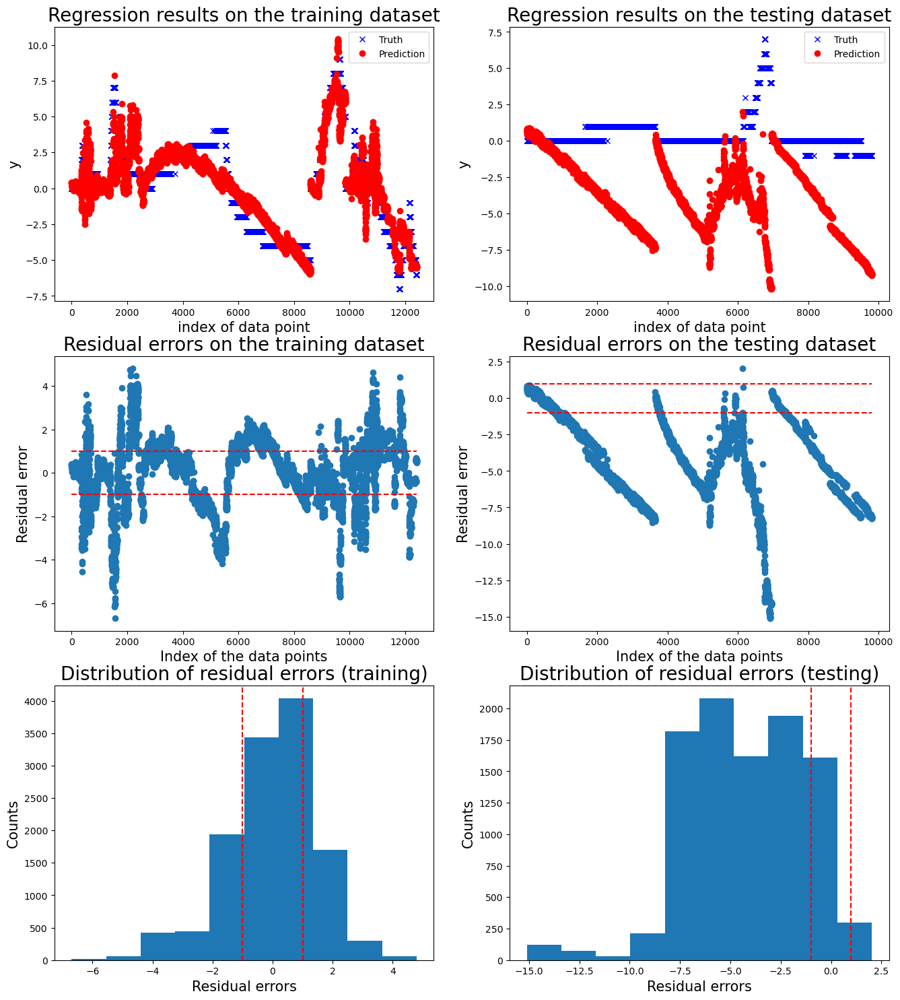


 New run:

training performance, max error is: 8.271030560101142
training performance, mean root square error is: 1.8442058035671365
training performance, residual error > 1: 57.836121510828875%

 New run:

testing performance, max error is: 6.402047327246197
testing performance, mean root square error is: 1.6460203913875402
testing performance, residual error > 1: 66.27906976744185%


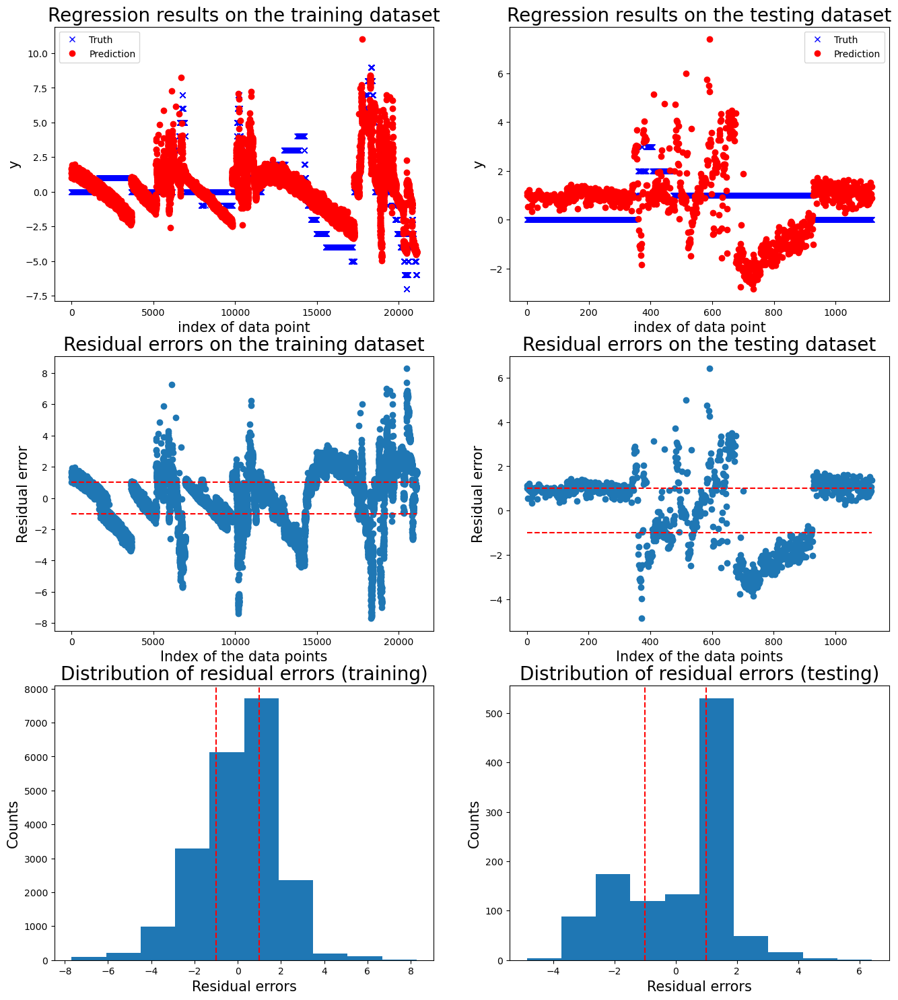


 New run:

training performance, max error is: 5.615224120353048
training performance, mean root square error is: 1.001881882581798
training performance, residual error > 1: 21.19976271689159%

 New run:

testing performance, max error is: 13.02344012407996
testing performance, mean root square error is: 6.369851263518135
testing performance, residual error > 1: 86.35062406962098%


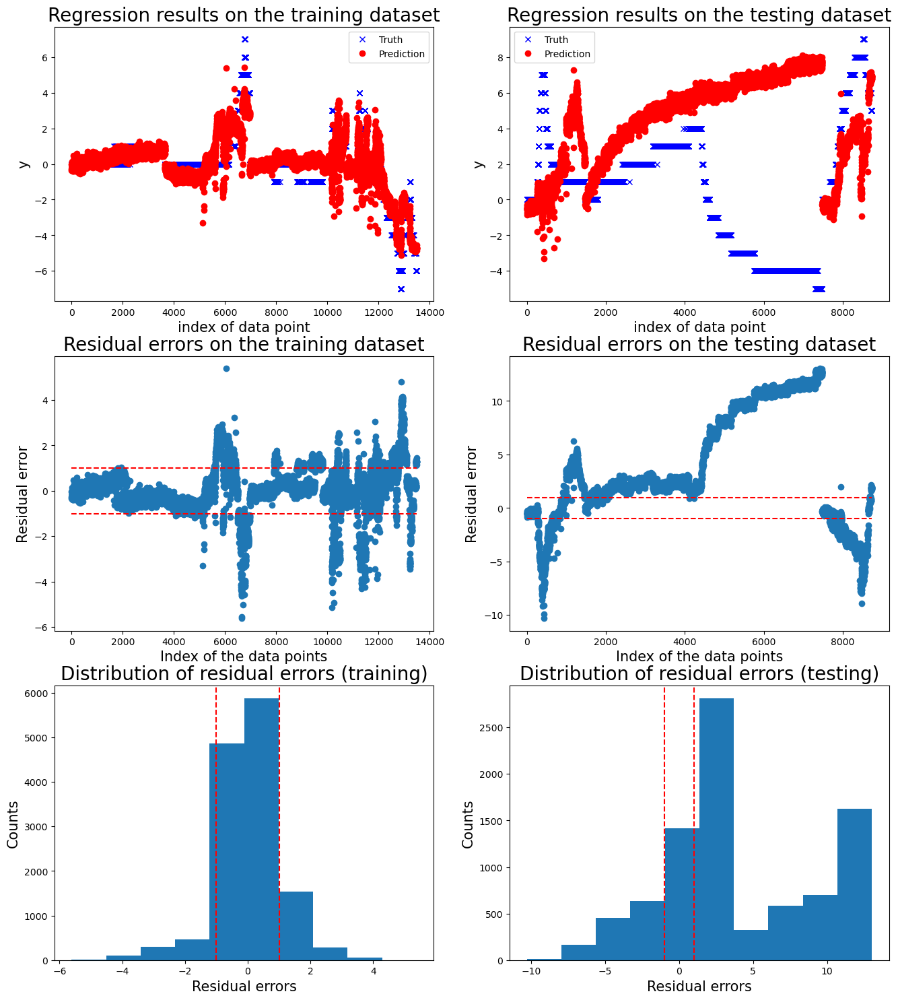


 New run:

training performance, max error is: 8.125196815445042
training performance, mean root square error is: 1.7568011677600057
training performance, residual error > 1: 57.85197291618025%

 New run:

testing performance, max error is: 9.546157045542191
testing performance, mean root square error is: 3.7391099536398595
testing performance, residual error > 1: 67.28855721393035%


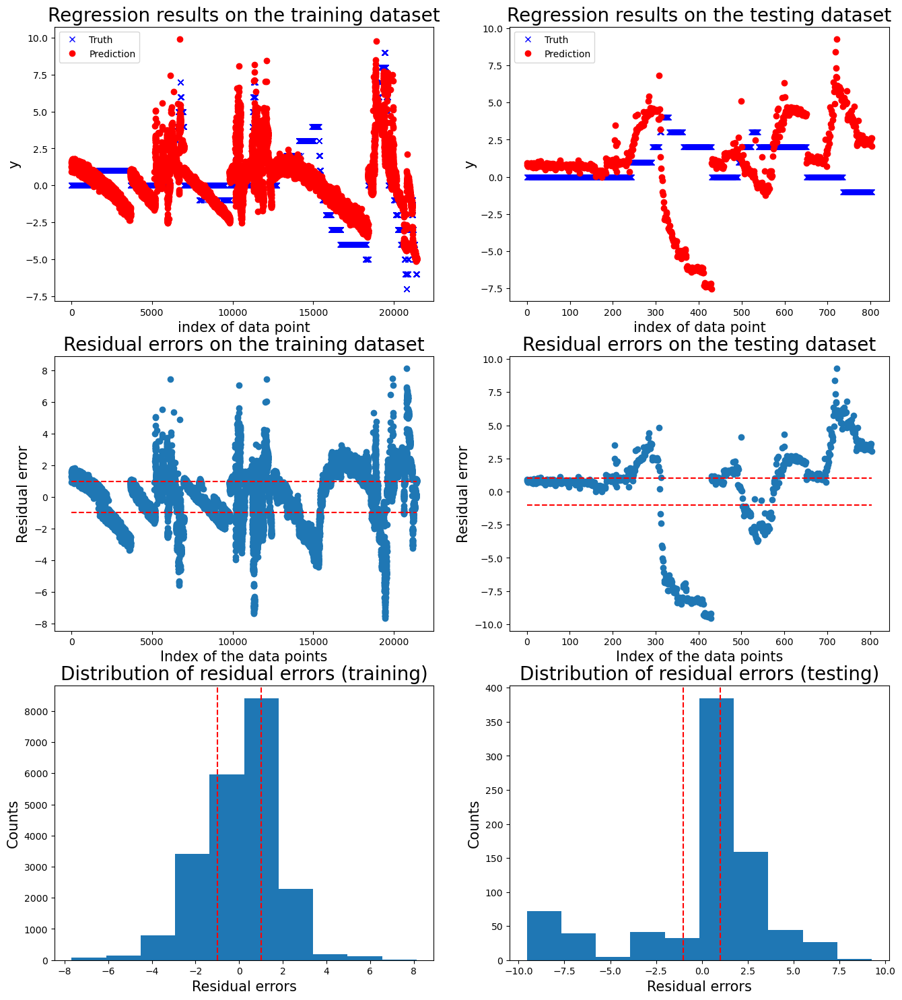


 New run:

training performance, max error is: 6.739710534311113
training performance, mean root square error is: 1.5909904924911105
training performance, residual error > 1: 61.0524772793902%

 New run:

testing performance, max error is: 10.653704367968919
testing performance, mean root square error is: 5.953529055836146
testing performance, residual error > 1: 99.82886480319453%


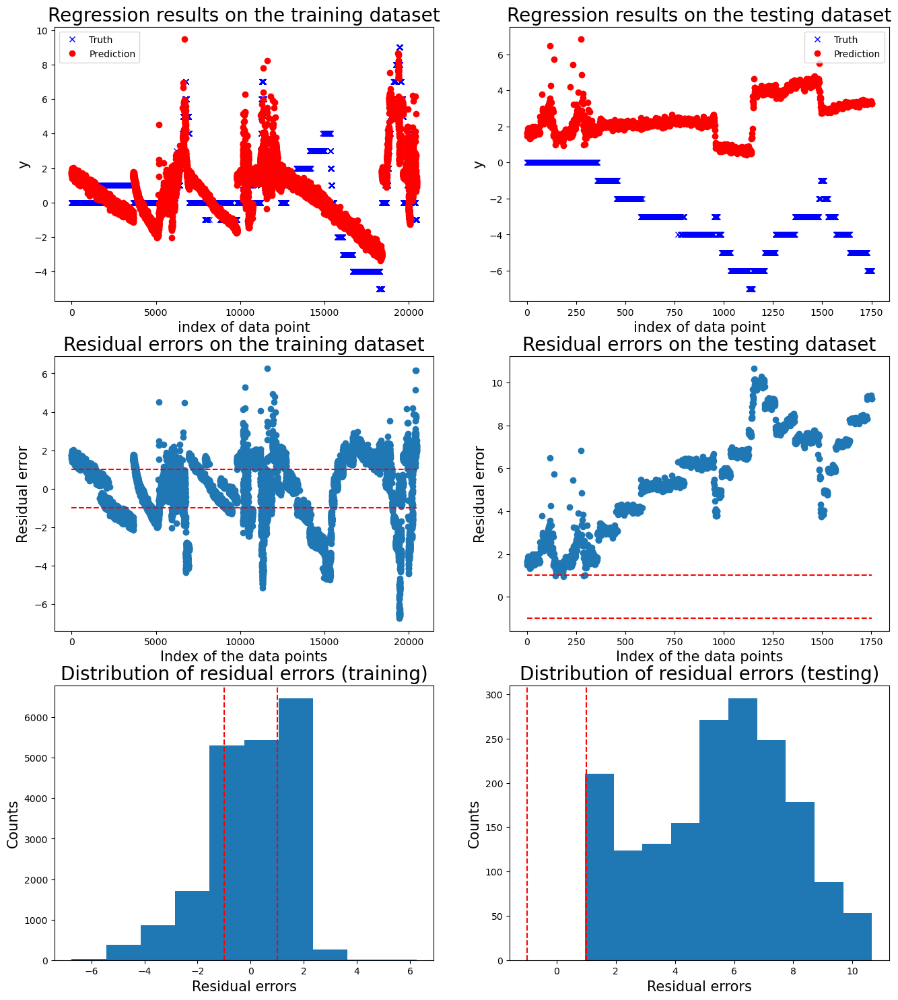

   Max error      RMSE  Exceed boundary rate
0  15.104767  5.152003              0.856284
1   6.402047  1.646020              0.662791
2  13.023440  6.369851              0.863506
3   9.546157  3.739110              0.672886
4  10.653704  5.953529              0.998289


Mean performance metric and standard error:
Max error: 10.9460 +- 3.3280
RMSE: 4.5721 +- 1.9191
Exceed boundary rate: 0.8108 +- 0.1422




In [34]:
from utility import run_cv_one_motor

feature_list_all = ['time', 'data_motor_1_position', 'data_motor_1_temperature', 'data_motor_1_voltage',
                    'data_motor_2_position', 'data_motor_2_temperature', 'data_motor_2_voltage',
                    'data_motor_3_position', 'data_motor_3_temperature', 'data_motor_3_voltage',
                    'data_motor_4_position', 'data_motor_4_temperature', 'data_motor_4_voltage',
                    'data_motor_5_position', 'data_motor_5_temperature', 'data_motor_5_voltage',
                    'data_motor_6_position', 'data_motor_6_temperature', 'data_motor_6_voltage']

threshold = 1
window_size = 1
sample_step = 1

df_perf = run_cv_one_motor(motor_idx=6, df_data=df_data, mdl=mdl_linear_regreession, 
            feature_list=feature_list_all, n_fold=5, 
            threshold=threshold, window_size=window_size, sample_step=sample_step, mdl_type='reg')

### Smoothing

In [6]:
import pandas as pd
import numpy as np
from scipy.signal import butter, filtfilt


# Function to design a Butterworth low-pass filter
def butter_lowpass(cutoff, fs, order=5):
    nyquist = 0.5 * fs
    normal_cutoff = cutoff / nyquist
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a


# Function to apply the Butterworth low-pass filter
def lowpass_filter(data, cutoff_freq, sampling_freq, order=5):
    b, a = butter_lowpass(cutoff_freq, sampling_freq, order=order)
    filtered_data = filtfilt(b, a, data)
    return filtered_data


# Set parameters for the low-pass filter
cutoff_frequency = .5  # Adjust as needed
sampling_frequency = 10  # Assuming your data is evenly spaced in time


def customized_outlier_removal(df: pd.DataFrame):
    ''' # Description
    Remove outliers from the dataframe based on defined valid ranges. 
    Define a valid range of temperature and voltage. 
    Use ffil function to replace the invalid measurement with the previous value.
    '''
    df['position'] = df['position'].where(df['position'] <= 1000, np.nan)
    df['position'] = df['position'].where(df['position'] >= 0, np.nan)
    df['position'] = df['position'].ffill()
    df['position'] = lowpass_filter(df['position'], cutoff_frequency, sampling_frequency)
    # df['position'] = df['position'].rolling(window=10, min_periods=1).mean()
    df['position'] = df['position'].round()

    df['temperature'] = df['temperature'].where(df['temperature'] <= 100, np.nan)
    df['temperature'] = df['temperature'].where(df['temperature'] >= 0, np.nan)
    # df['temperature'] = df['temperature'].rolling(window=10, min_periods=1).mean()

    # Make sure that the difference between the current and previous temperature cannot be too large.
    # Define your threshold
    threshold = 10
    # Shift the 'temperature' column by one row to get the previous temperature
    prev_tmp = df['temperature'].shift(1)
    # Calculate the absolute difference between current and previous temperature
    temp_diff = np.abs(df['temperature'] - prev_tmp)
    # Set the temperature to NaN where the difference is larger than the threshold
    df.loc[temp_diff > threshold, 'temperature'] = np.nan
    df['temperature'] = df['temperature'].ffill()

    df['voltage'] = df['voltage'].where(df['voltage'] >= 6000, np.nan)
    df['voltage'] = df['voltage'].where(df['voltage'] <= 8000, np.nan)
    df['voltage'] = df['voltage'].ffill()
    # df['voltage'] = lowpass_filter(df['voltage'], cutoff_frequency, sampling_frequency)
    # df['voltage'] = df['voltage'].rolling(window=5, min_periods=1).mean()
    

from utility import read_all_csvs_one_test
import matplotlib.pyplot as plt
import pandas as pd
import os

# Get all the folders in the base_dictionary
path_list = os.listdir(base_dictionary)
# Only keep the folders, not the excel file.
path_list = [f for f in path_list if not f.endswith('.xlsx')]

# Read the data.
df_data_smoothing = pd.DataFrame()
for tmp_path in path_list:
    path = base_dictionary + tmp_path
    # Read the data with the customized outlier removal function.
    tmp_df = read_all_csvs_one_test(path, tmp_path, customized_outlier_removal)
    df_data_smoothing = pd.concat([df_data_smoothing, tmp_df])
    df_data_smoothing = df_data_smoothing.reset_index(drop=True)

# Read the test conditions
df_test_conditions = pd.read_excel(base_dictionary+'Test conditions.xlsx')

# # Visulize the data
# for selected_sequence_idx in path_list:
#     filtered_df = df_data_smoothing[df_data_smoothing['test_condition'] == selected_sequence_idx]

#     print('{}: {}\n'.format(selected_sequence_idx, df_test_conditions[df_test_conditions['Test id'] == selected_sequence_idx]['Description']))

#     fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 10))
#     for ax, col in zip(axes.flat, ['data_motor_1_position', 'data_motor_2_position', 'data_motor_3_position', 
#         'data_motor_1_temperature', 'data_motor_2_temperature', 'data_motor_3_temperature',
#         'data_motor_1_voltage', 'data_motor_2_voltage', 'data_motor_3_voltage']):
#         ax.plot(filtered_df['time'], filtered_df[col], marker='o', label=col)
#         ax.set_ylabel(col)

#     fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 10))
#     for ax, col in zip(axes.flat, ['data_motor_4_position', 'data_motor_5_position', 'data_motor_6_position',
#         'data_motor_4_temperature', 'data_motor_5_temperature', 'data_motor_6_temperature',
#         'data_motor_4_voltage', 'data_motor_5_voltage', 'data_motor_6_voltage']):
#         ax.plot(filtered_df['time'], filtered_df[col], marker='o', label=col)
#         ax.set_ylabel(col)

#     plt.show()

In [14]:
normal_test_id = ['20240105_164214', 
    '20240105_165300', 
    '20240105_165972', 
    '20240320_152031', 
    '20240320_153841', 
    '20240320_155664', 
    '20240321_122650', 
    '20240325_135213', 
    '20240426_141190', 
    '20240426_141532', 
    '20240426_141602', 
    '20240426_141726', 
    '20240426_141938', 
    '20240426_141980', 
    '20240503_164435']
df_data_smoothing = df_data_smoothing[df_data_smoothing['test_condition'].isin(normal_test_id)]


Model for motor 6:

 New run:

training performance, max error is: 9.262523351508161
training performance, mean root square error is: 1.780009829712086
training performance, residual error > 1: 56.13687947389862%

 New run:

testing performance, max error is: 7.903769566628103
testing performance, mean root square error is: 2.664736138226074
testing performance, residual error > 1: 70.39316918189039%


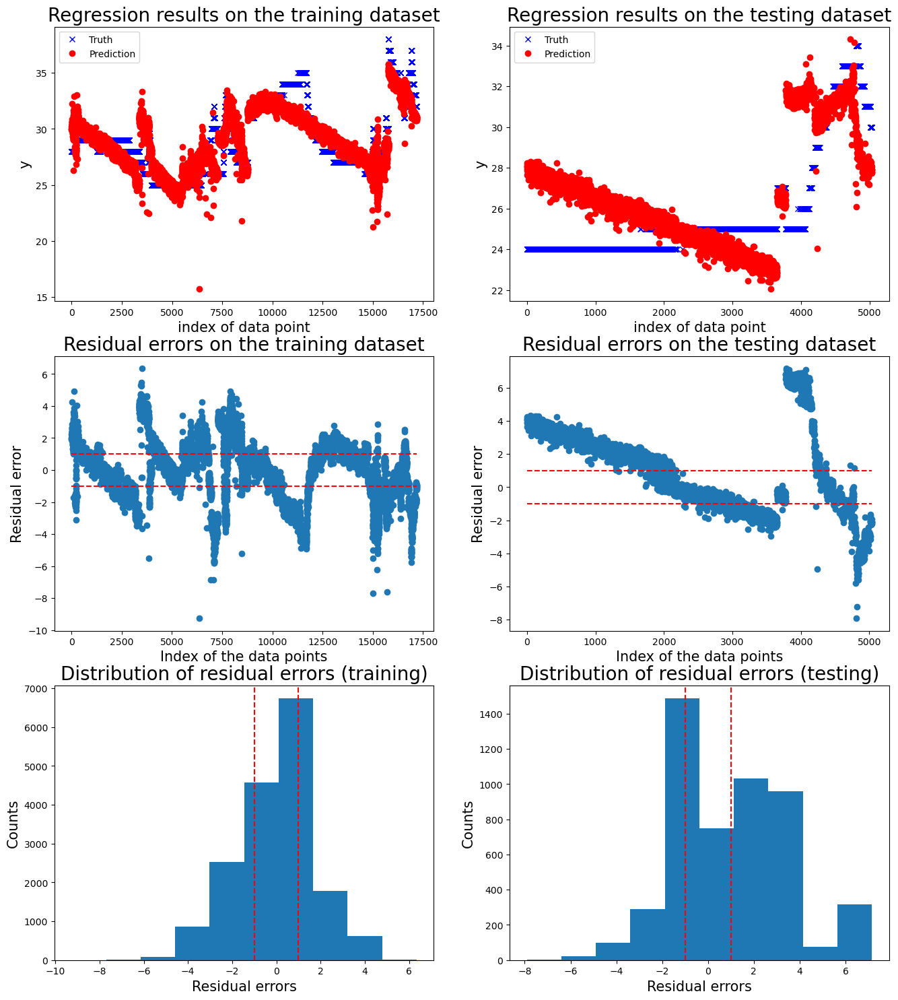


 New run:

training performance, max error is: 10.237742330936833
training performance, mean root square error is: 1.9648321812983973
training performance, residual error > 1: 66.2781540400063%

 New run:

testing performance, max error is: 6.70356407974829
testing performance, mean root square error is: 4.135766737729443
testing performance, residual error > 1: 98.61286254728878%


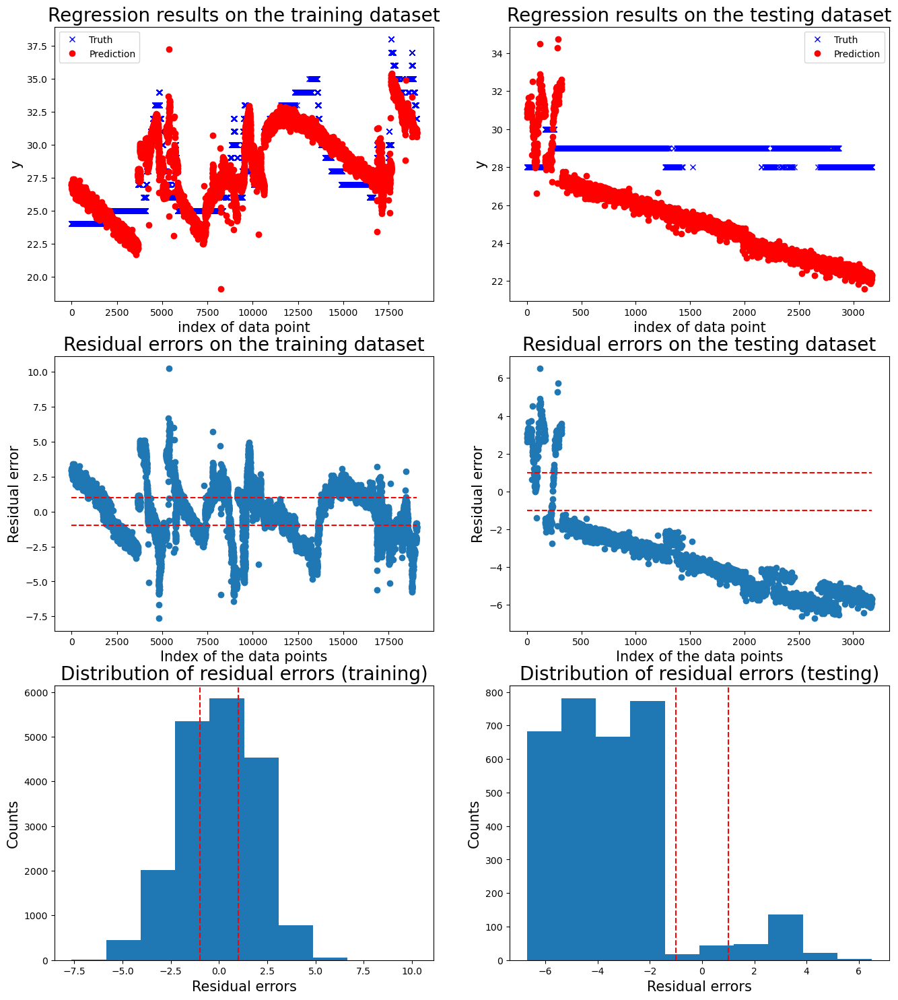


 New run:

training performance, max error is: 6.624795048224144
training performance, mean root square error is: 1.8007221365520814
training performance, residual error > 1: 63.87072669531104%

 New run:

testing performance, max error is: 11.380040935950063
testing performance, mean root square error is: 5.290141467564145
testing performance, residual error > 1: 79.05824039653035%


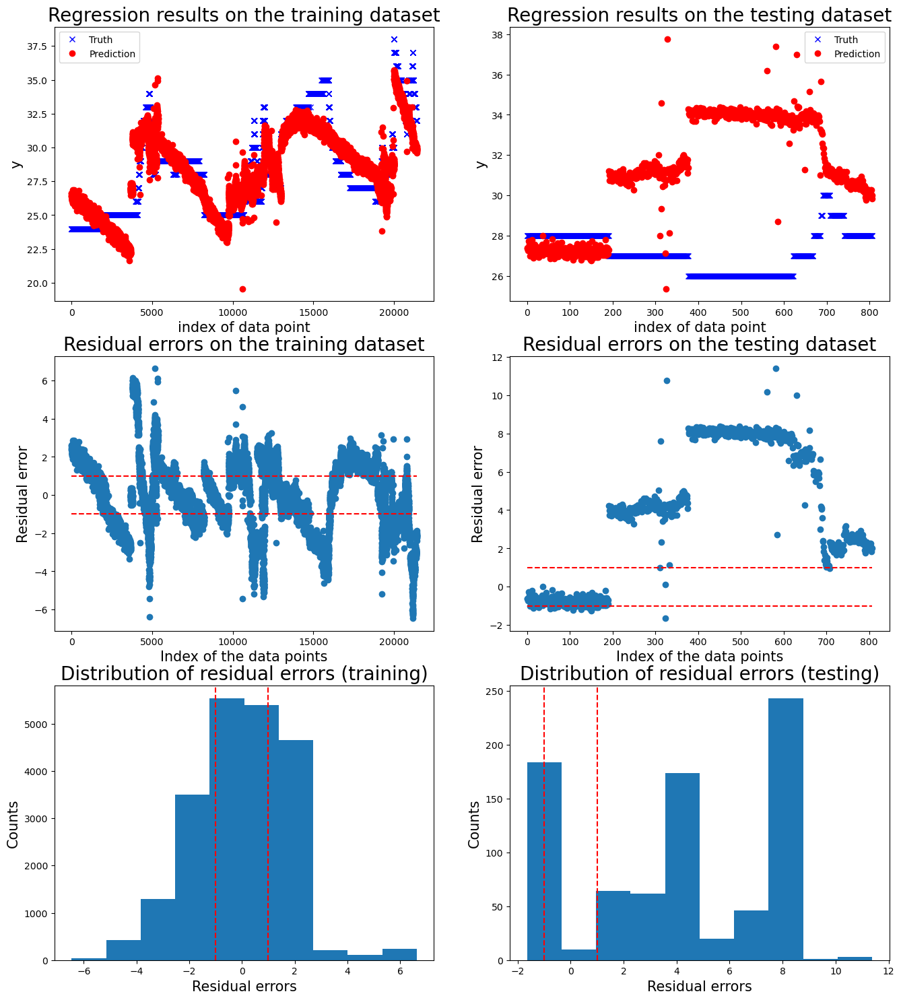


 New run:

training performance, max error is: 7.772633407294414
training performance, mean root square error is: 1.2943240492743318
training performance, residual error > 1: 22.39615216440752%

 New run:

testing performance, max error is: 15.206849301011502
testing performance, mean root square error is: 6.202441440539744
testing performance, residual error > 1: 66.70994065281899%


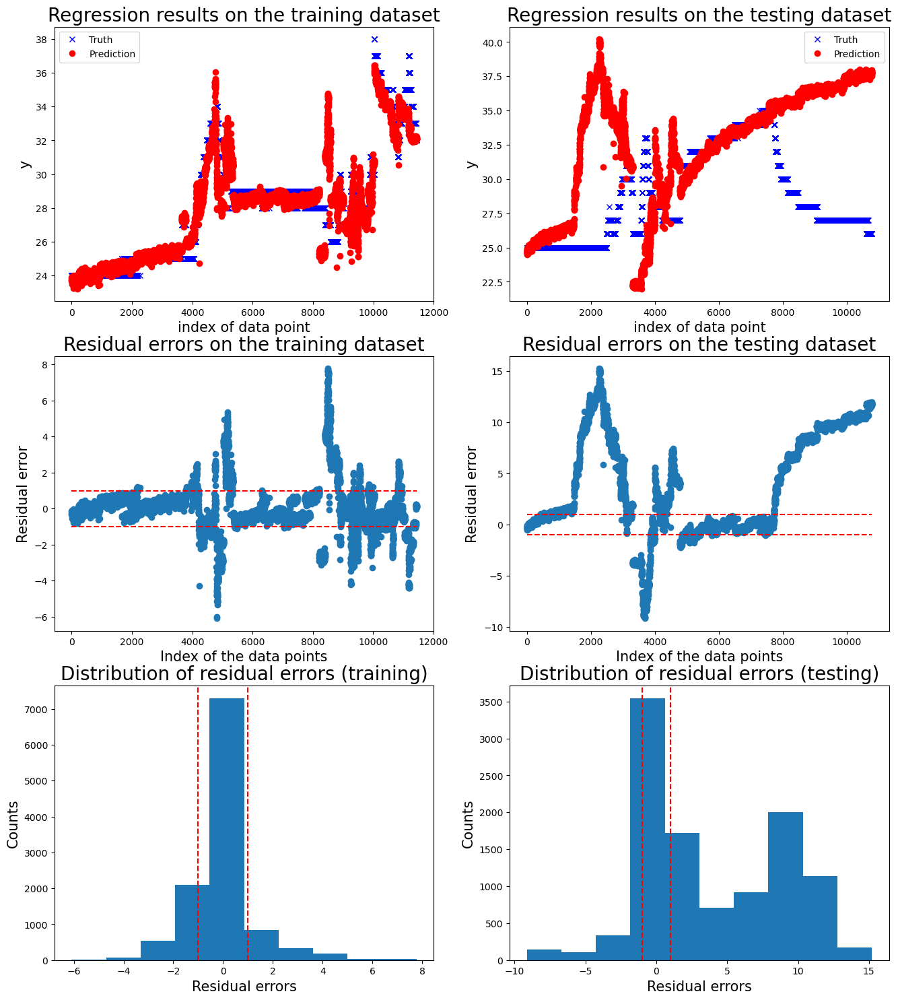


 New run:

training performance, max error is: 8.720202435034075
training performance, mean root square error is: 1.7446076773739048
training performance, residual error > 1: 58.92216778625183%

 New run:

testing performance, max error is: 10.50785646674148
testing performance, mean root square error is: 5.320618599822526
testing performance, residual error > 1: 86.44628099173553%


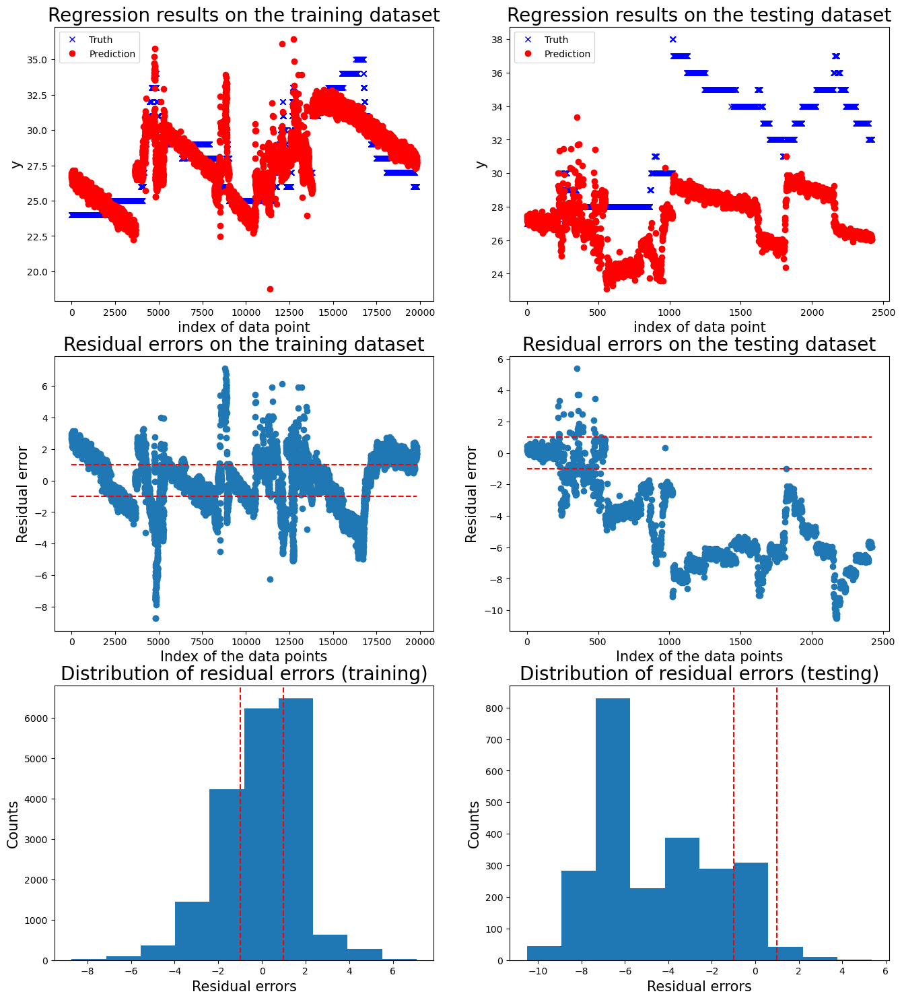

   Max error      RMSE  Exceed boundary rate
0   7.903770  2.664736              0.703932
1   6.703564  4.135767              0.986129
2  11.380041  5.290141              0.790582
3  15.206849  6.202441              0.667099
4  10.507856  5.320619              0.864463


Mean performance metric and standard error:
Max error: 10.3404 +- 3.3149
RMSE: 4.7227 +- 1.3646
Exceed boundary rate: 0.8024 +- 0.1282




In [19]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression

# Define the steps of the pipeline
steps = [
    ('standardizer', StandardScaler()),  # Step 1: StandardScaler
    ('regressor', LinearRegression())    # Step 2: Linear Regression
]

# Create the pipeline
mdl_linear_regreession = Pipeline(steps)


threshold = 1
window_size = 1
sample_step = 1

df_perf = run_cv_one_motor(motor_idx=6, df_data=df_data_smoothing, mdl=mdl_linear_regreession, 
            feature_list=feature_list_all, n_fold=5, 
            threshold=threshold, window_size=window_size, sample_step=sample_step, mdl_type='reg')

### remove seq to seq variability

In [22]:
from utility import read_all_test_data_from_path
import numpy as np 
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
import warnings
%matplotlib inline


def compensate_seq_bias(df: pd.DataFrame):
    ''' # Description
    Adjust for the sequence-to-sequence bias.
    '''
    # Tranform the features relative to the first data point.
    df['temperature'] = df['temperature'] - df['temperature'].iloc[0]
    df['voltage'] = df['voltage'] - df['voltage'].iloc[0]
    df['position'] = df['position'] - df['position'].iloc[0]


def remove_outliers(df: pd.DataFrame):
    ''' # Description
    Remove outliers from the dataframe based on defined valid ranges. 
    Define a valid range of temperature and voltage. 
    Use ffil function to replace the invalid measurement with the previous value.
    '''
    df['temperature'] = df['temperature'].where(df['temperature'] <= 100, np.nan)
    df['temperature'] = df['temperature'].where(df['temperature'] >= 0, np.nan)
    df['temperature'] = df['temperature'].ffill()        

    df['voltage'] = df['voltage'].where(df['voltage'] >= 6000, np.nan)
    df['voltage'] = df['voltage'].where(df['voltage'] <= 9000, np.nan)
    df['voltage'] = df['voltage'].ffill()        

    df['position'] = df['position'].where(df['position'] >= 0, np.nan)
    df['position'] = df['position'].where(df['position'] <= 1000, np.nan)
    df['position'] = df['position'].ffill()


# Subfunction for data preprocessing.
def pre_processing(df: pd.DataFrame):
    ''' ### Description
    Preprocess the data:
    - remove outliers
    - Adjust for the sequence-to-sequence bias.
    - add new features about the difference between the current and previous n data point.
    '''     
    # Start processing.
    remove_outliers(df)
    compensate_seq_bias(df)


In [24]:
base_dictionary = '../../dataset/training_data/'
df_data = read_all_test_data_from_path(base_dictionary, pre_processing, is_plot=False)

normal_test_id = ['20240105_164214', 
    '20240105_165300', 
    '20240105_165972', 
    '20240320_152031', 
    '20240320_153841', 
    '20240320_155664', 
    '20240321_122650', 
    '20240325_135213', 
    '20240426_141190', 
    '20240426_141532', 
    '20240426_141602', 
    '20240426_141726', 
    '20240426_141938', 
    '20240426_141980', 
    '20240503_164435']
df_data = df_data[df_data['test_condition'].isin(normal_test_id)]

Model for motor 6:

 New run:

training performance, max error is: 6.6972267395600165
training performance, mean root square error is: 1.4854492316006143
training performance, residual error > 1: 46.921341070277236%

 New run:

testing performance, max error is: 15.104766525403646
testing performance, mean root square error is: 5.152003125802122
testing performance, residual error > 1: 85.6283763123025%


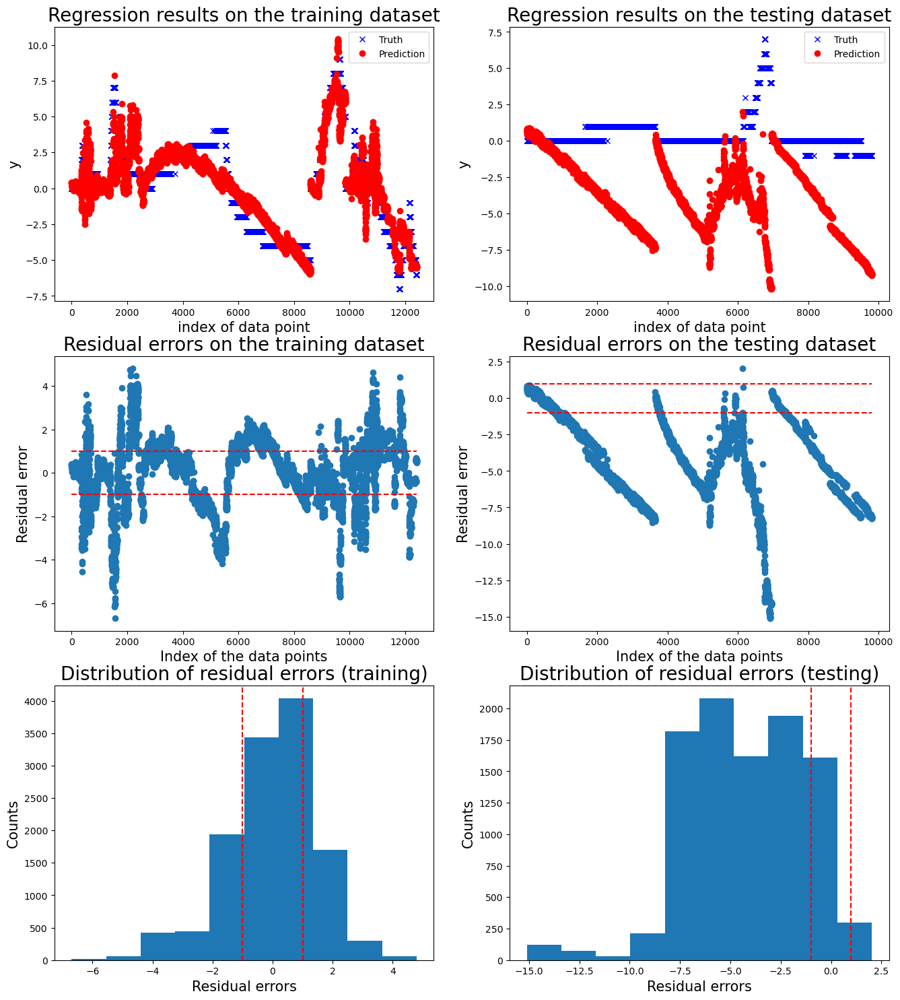


 New run:

training performance, max error is: 8.271030560101142
training performance, mean root square error is: 1.8442058035671365
training performance, residual error > 1: 57.836121510828875%

 New run:

testing performance, max error is: 6.402047327246197
testing performance, mean root square error is: 1.6460203913875402
testing performance, residual error > 1: 66.27906976744185%


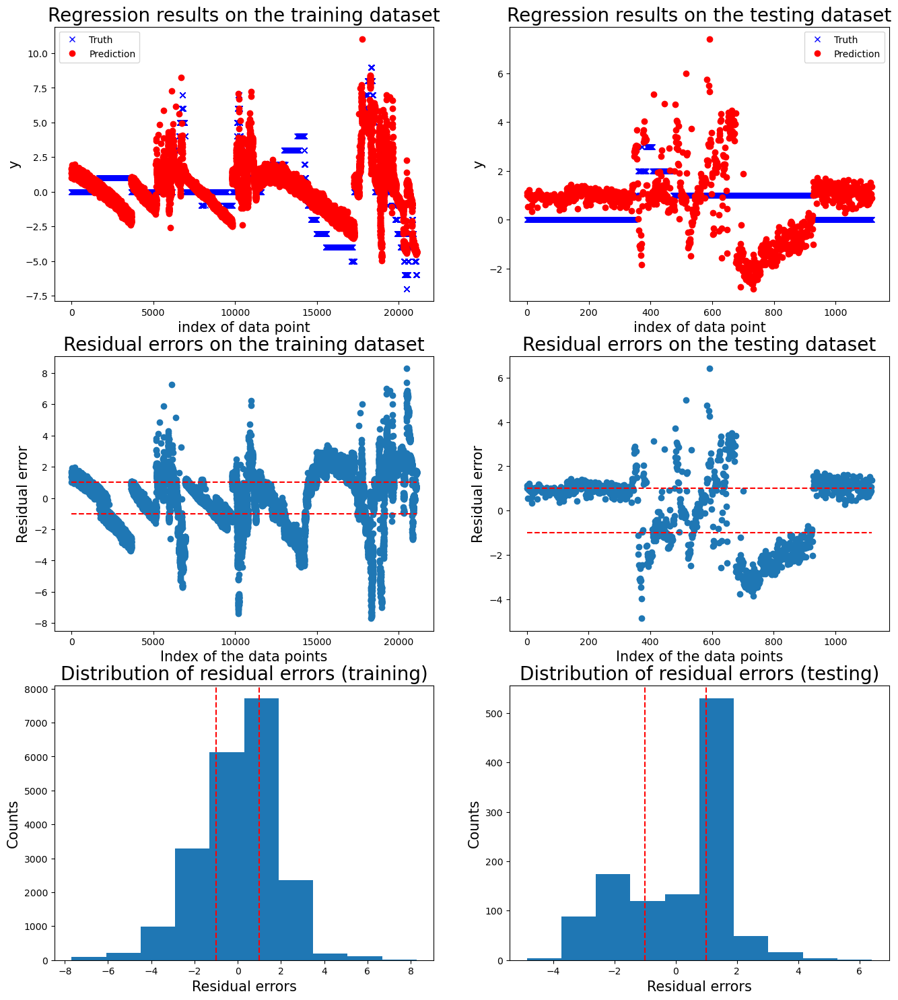


 New run:

training performance, max error is: 5.615224120353048
training performance, mean root square error is: 1.001881882581798
training performance, residual error > 1: 21.19976271689159%

 New run:

testing performance, max error is: 13.02344012407996
testing performance, mean root square error is: 6.369851263518135
testing performance, residual error > 1: 86.35062406962098%


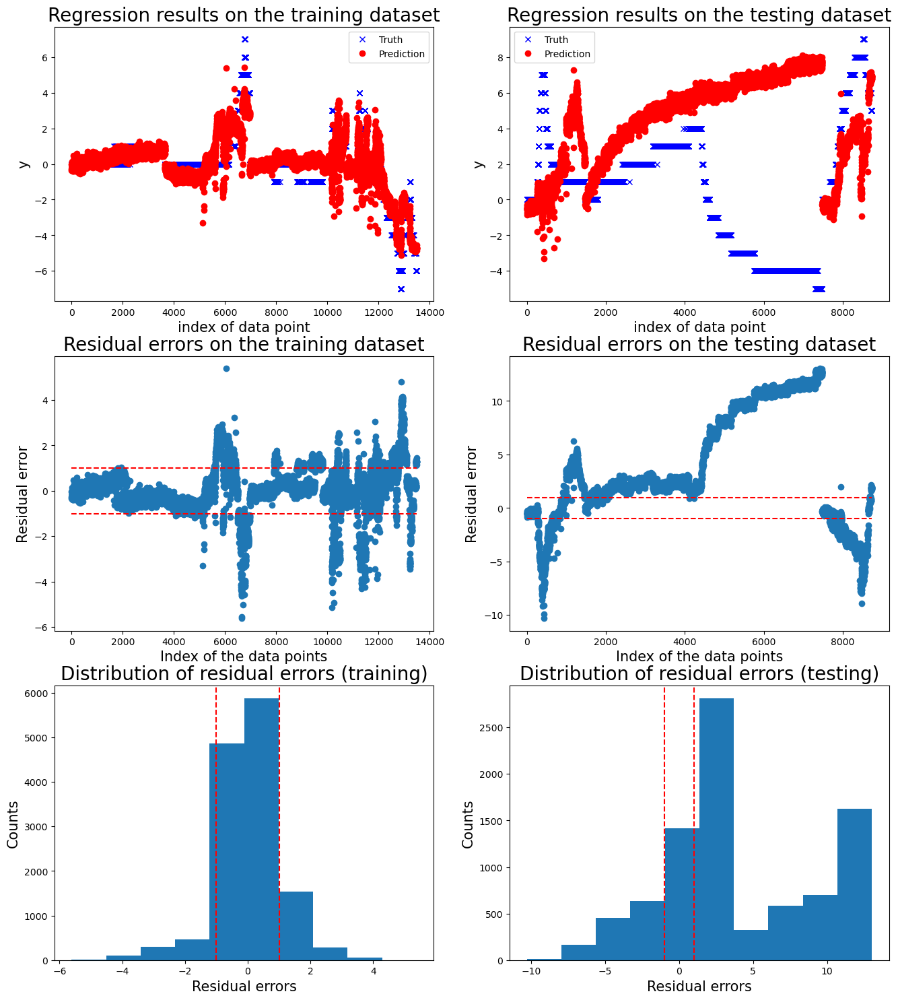


 New run:

training performance, max error is: 8.125196815445042
training performance, mean root square error is: 1.7568011677600057
training performance, residual error > 1: 57.85197291618025%

 New run:

testing performance, max error is: 9.546157045542191
testing performance, mean root square error is: 3.7391099536398595
testing performance, residual error > 1: 67.28855721393035%


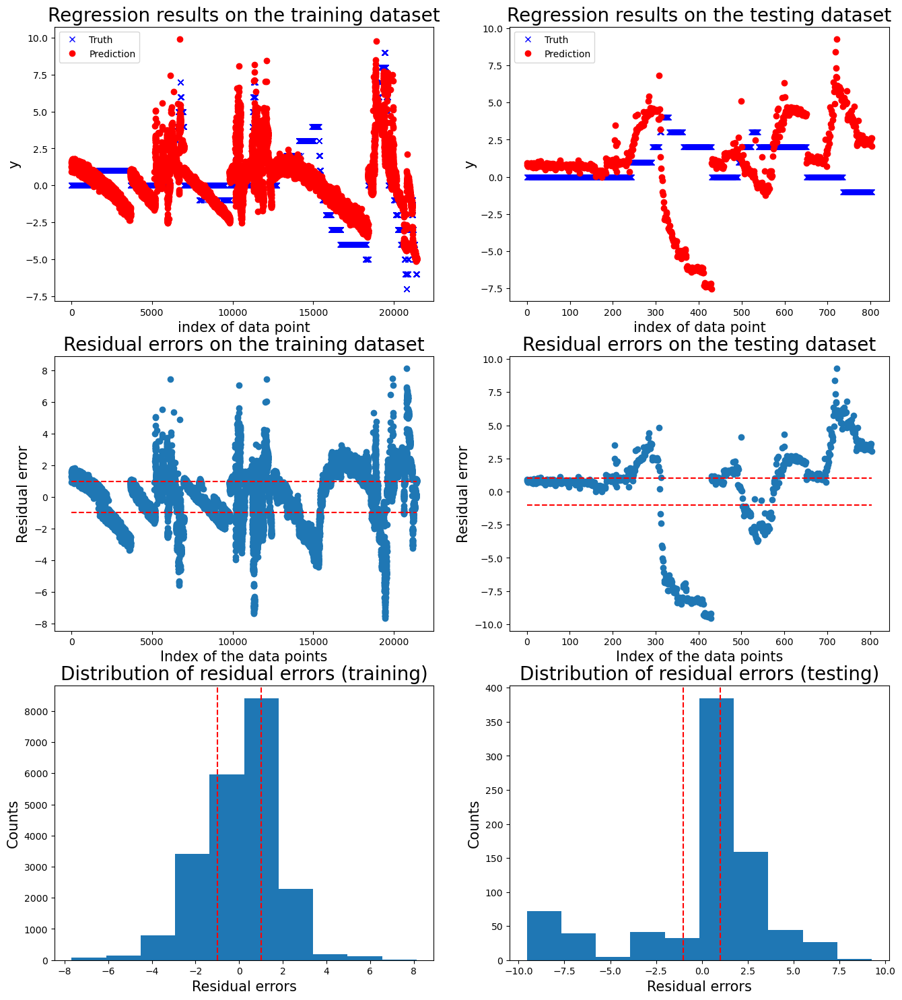


 New run:

training performance, max error is: 6.739710534311113
training performance, mean root square error is: 1.5909904924911105
training performance, residual error > 1: 61.0524772793902%

 New run:

testing performance, max error is: 10.653704367968919
testing performance, mean root square error is: 5.953529055836146
testing performance, residual error > 1: 99.82886480319453%


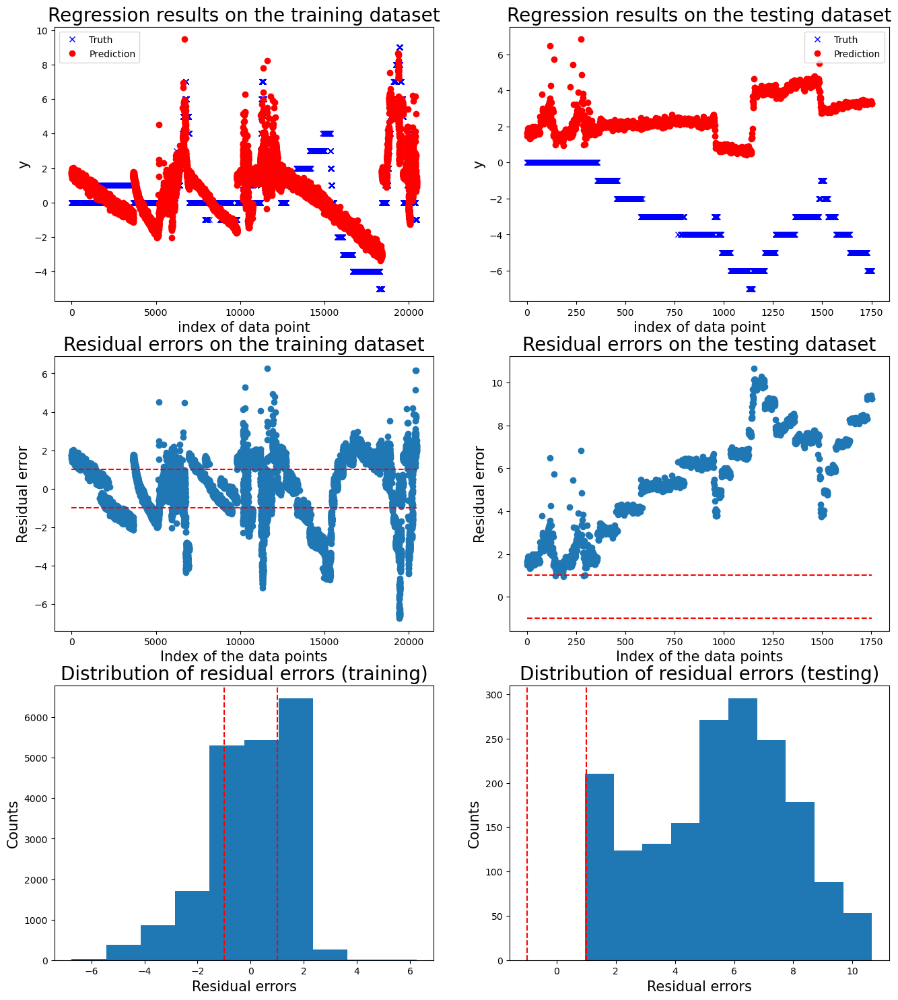

   Max error      RMSE  Exceed boundary rate
0  15.104767  5.152003              0.856284
1   6.402047  1.646020              0.662791
2  13.023440  6.369851              0.863506
3   9.546157  3.739110              0.672886
4  10.653704  5.953529              0.998289


Mean performance metric and standard error:
Max error: 10.9460 +- 3.3280
RMSE: 4.5721 +- 1.9191
Exceed boundary rate: 0.8108 +- 0.1422




In [25]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression


# Define the steps of the pipeline
steps = [
    ('standardizer', StandardScaler()),  # Step 1: StandardScaler
    ('regressor', LinearRegression())    # Step 2: Linear Regression
]

# Create the pipeline
mdl_linear_regreession = Pipeline(steps)

from utility import run_cv_one_motor

feature_list_all = ['time', 'data_motor_1_position', 'data_motor_1_temperature', 'data_motor_1_voltage',
                    'data_motor_2_position', 'data_motor_2_temperature', 'data_motor_2_voltage',
                    'data_motor_3_position', 'data_motor_3_temperature', 'data_motor_3_voltage',
                    'data_motor_4_position', 'data_motor_4_temperature', 'data_motor_4_voltage',
                    'data_motor_5_position', 'data_motor_5_temperature', 'data_motor_5_voltage',
                    'data_motor_6_position', 'data_motor_6_temperature', 'data_motor_6_voltage']

threshold = 1
window_size = 1
sample_step = 1

df_perf = run_cv_one_motor(motor_idx=6, df_data=df_data, mdl=mdl_linear_regreession, 
            feature_list=feature_list_all, n_fold=5, 
            threshold=threshold, window_size=window_size, sample_step=sample_step, mdl_type='reg')

Model for motor 6:

 New run:

training performance, max error is: 9.913861907442534
training performance, mean root square error is: 1.0572267204774826
training performance, residual error > 1: 17.335845774749963%

 New run:

testing performance, max error is: 13.550936247257727
testing performance, mean root square error is: 3.9086372054088816
testing performance, residual error > 1: 85.8021002305131%


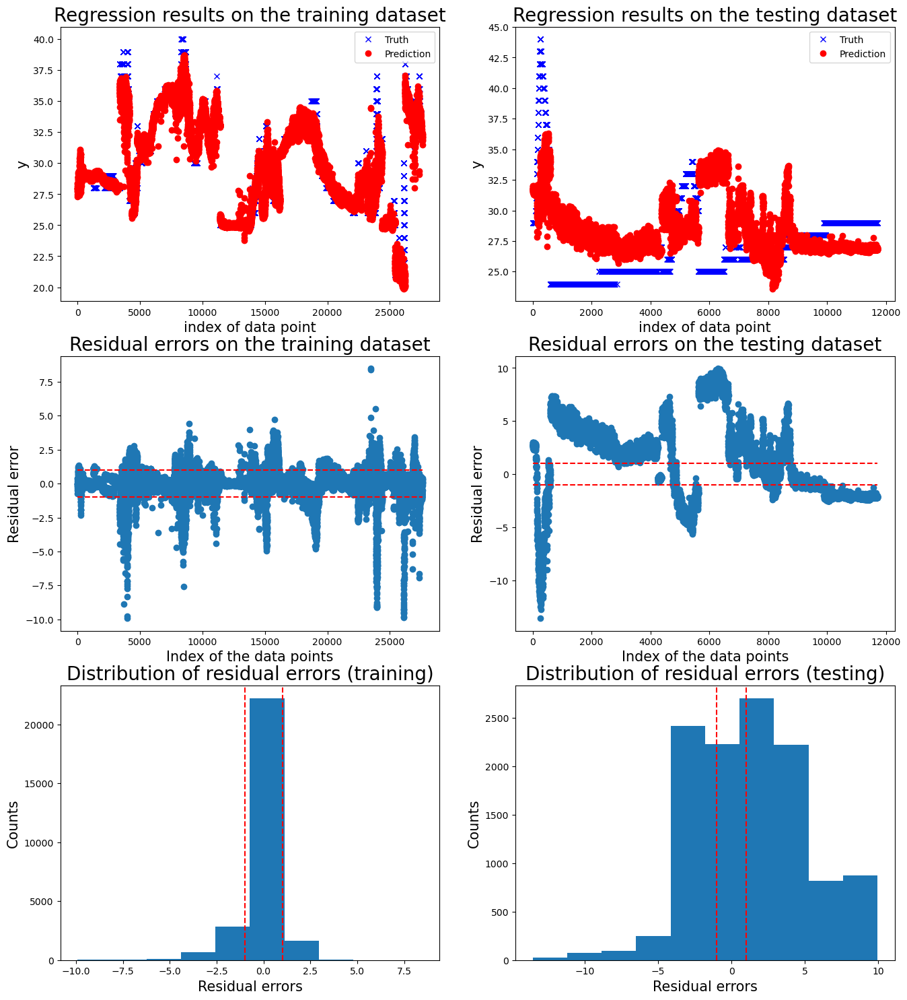


 New run:

training performance, max error is: 12.3593611832644
training performance, mean root square error is: 1.1845516876623658
training performance, residual error > 1: 15.664363501947737%

 New run:

testing performance, max error is: 9.752706925085239
testing performance, mean root square error is: 2.524230161772201
testing performance, residual error > 1: 79.2512077294686%


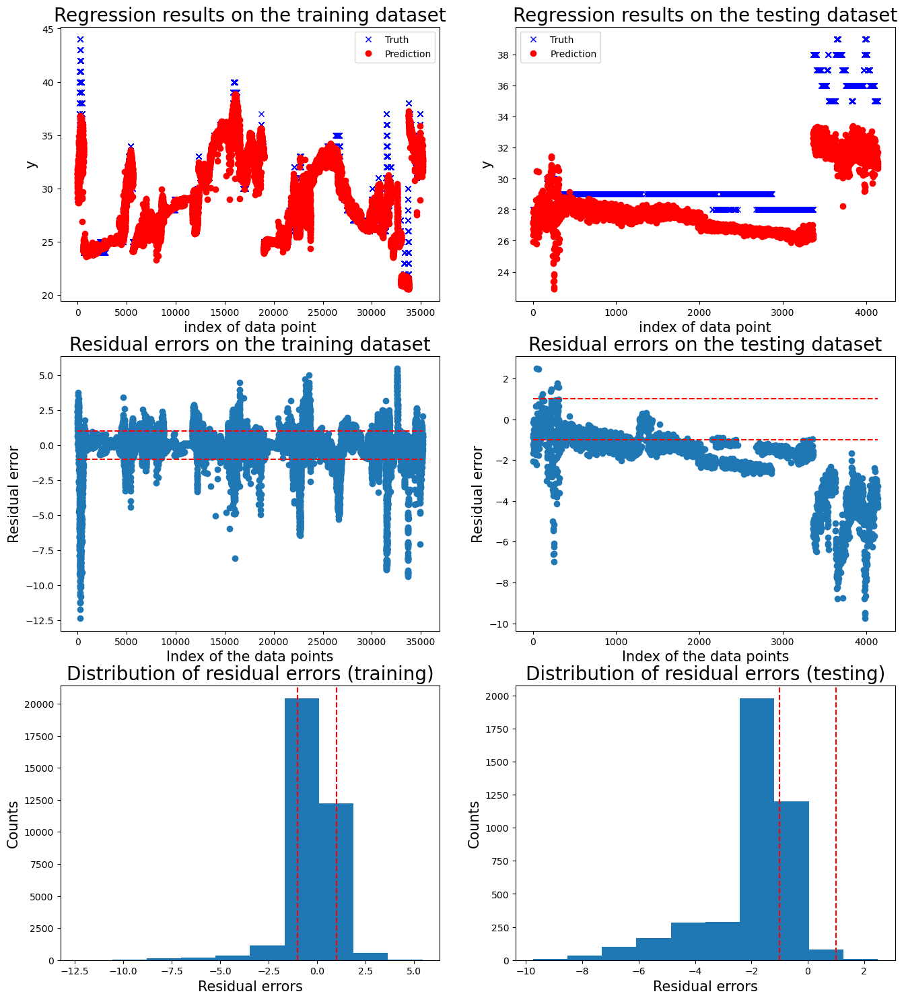


 New run:

training performance, max error is: 9.941875637682372
training performance, mean root square error is: 1.0193609211188372
training performance, residual error > 1: 12.55457313717577%

 New run:

testing performance, max error is: 14.538998566343146
testing performance, mean root square error is: 6.262601074241481
testing performance, residual error > 1: 89.67806173249254%


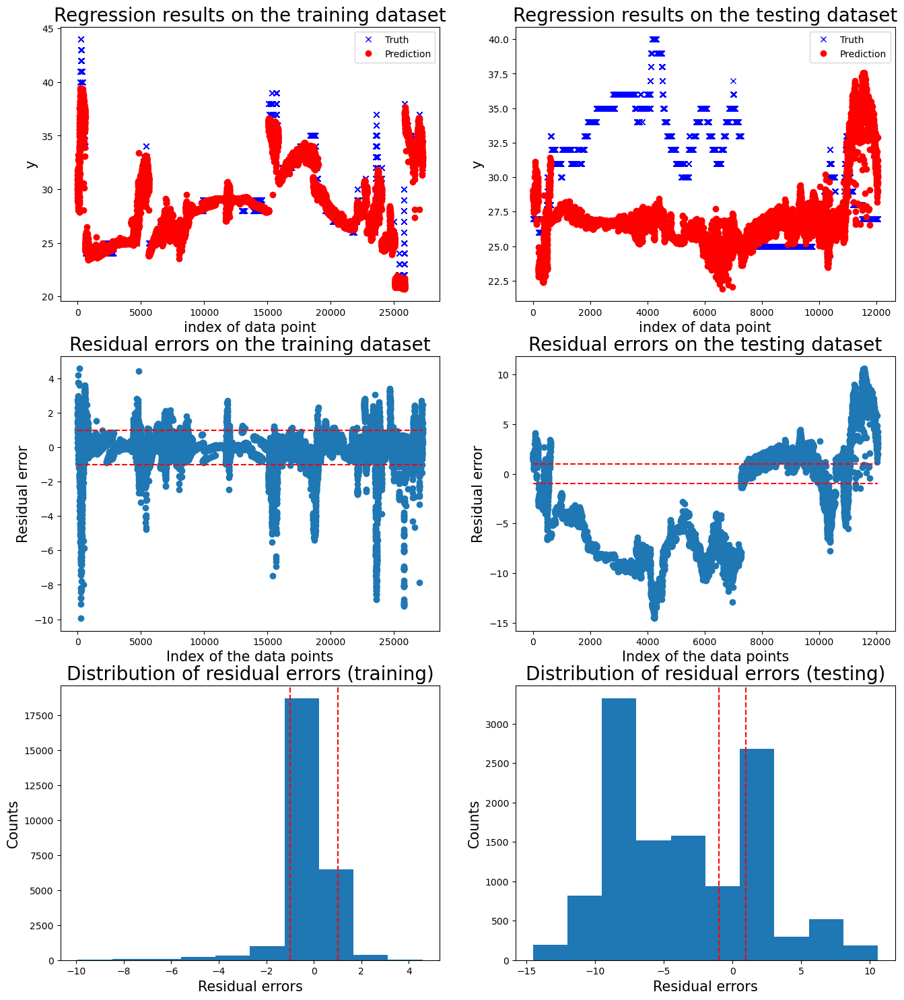


 New run:

training performance, max error is: 12.215212528910904
training performance, mean root square error is: 1.1164995162148512
training performance, residual error > 1: 15.34089084427888%

 New run:

testing performance, max error is: 8.427021065166858
testing performance, mean root square error is: 4.08430117405669
testing performance, residual error > 1: 64.92044063647491%


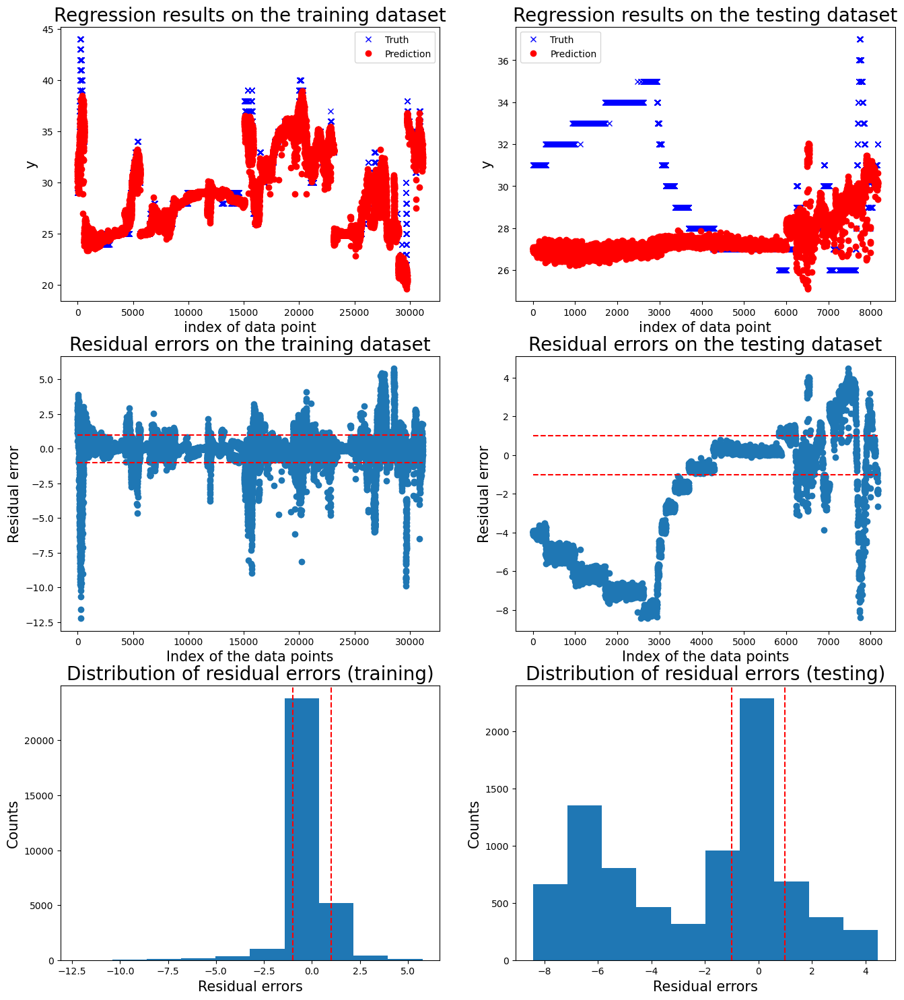


 New run:

training performance, max error is: 11.693328083151577
training performance, mean root square error is: 1.0968914633304623
training performance, residual error > 1: 14.516978516978519%

 New run:

testing performance, max error is: 20.33239968846874
testing performance, mean root square error is: 9.613139403566953
testing performance, residual error > 1: 84.7247990105133%


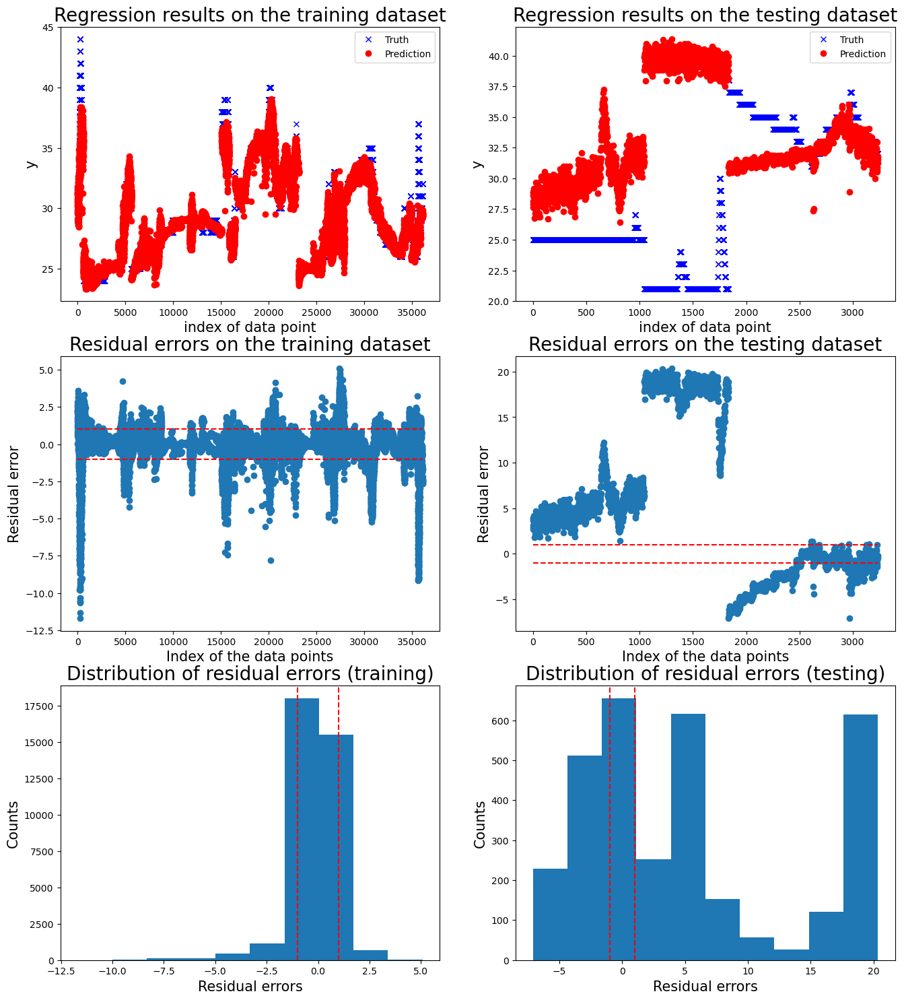

   Max error      RMSE  Exceed boundary rate
0  13.550936  3.908637              0.858021
1   9.752707  2.524230              0.792512
2  14.538999  6.262601              0.896781
3   8.427021  4.084301              0.649204
4  20.332400  9.613139              0.847248


Mean performance metric and standard error:
Max error: 13.3204 +- 4.6739
RMSE: 5.2786 +- 2.7680
Exceed boundary rate: 0.8088 +- 0.0967




In [14]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from utility import run_cv_one_motor

feature_list_all = ['time', 'data_motor_1_temperature', 'data_motor_1_voltage',
                    'data_motor_2_temperature', 'data_motor_2_voltage',
                    'data_motor_3_temperature', 'data_motor_3_voltage',
                    'data_motor_4_temperature', 'data_motor_4_voltage',
                    'data_motor_5_temperature', 'data_motor_5_voltage',
                    'data_motor_6_temperature', 'data_motor_6_voltage']

# Define the steps of the pipeline
steps = [
    ('standardizer', StandardScaler()),  # Step 1: StandardScaler
    ('regressor', SVR(C=0.8))    
]

# Create the pipeline
mdl_svr_regreession = Pipeline(steps)


threshold = 1
window_size = 1
sample_step = 1

df_perf = run_cv_one_motor(motor_idx=6, df_data=df_data_smoothing, mdl=mdl_svr_regreession, 
            feature_list=feature_list_all, n_fold=5, 
            threshold=threshold, window_size=window_size, sample_step=sample_step, mdl_type='reg')

Model for motor 6:

 New run:

training performance, max error is: 7.7182979441687145
training performance, mean root square error is: 0.6808801710438975
training performance, residual error > 1: 8.52659805768952%

 New run:

testing performance, max error is: 15.18329702439647
testing performance, mean root square error is: 4.493443082203435
testing performance, residual error > 1: 87.87671817638521%


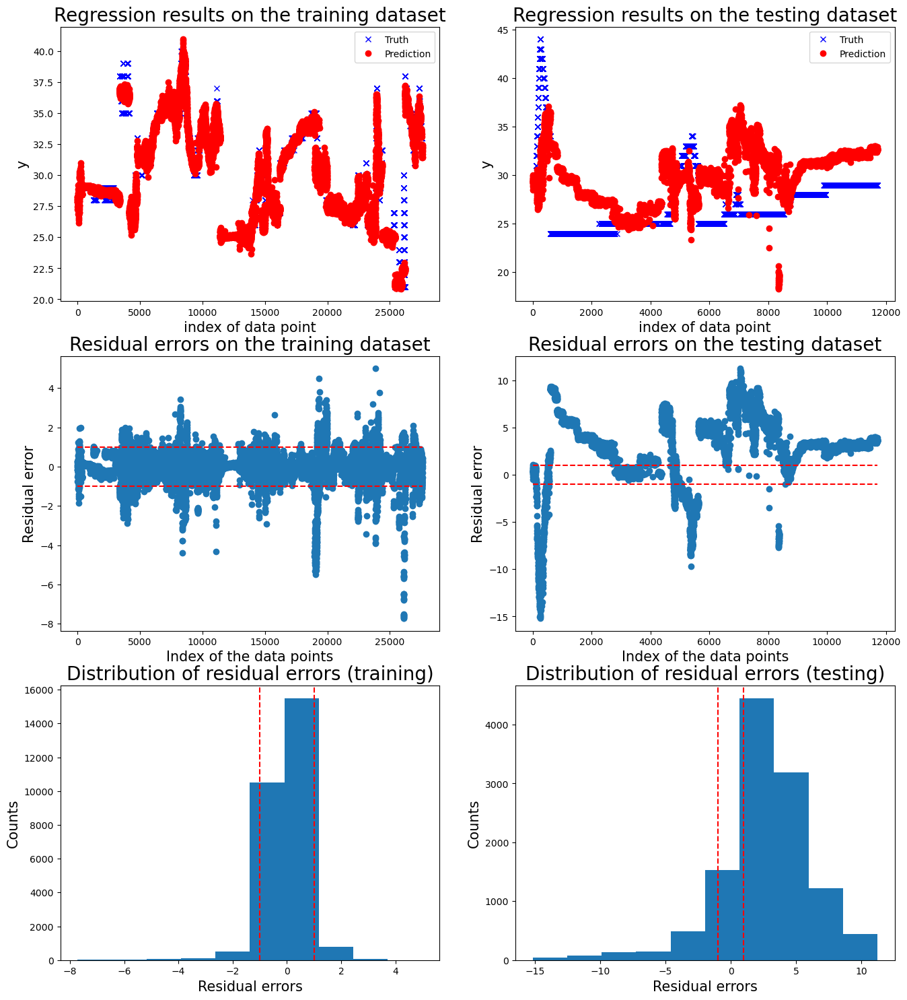


 New run:

training performance, max error is: 8.004714801892586
training performance, mean root square error is: 0.710174690327803
training performance, residual error > 1: 9.869487332594046%

 New run:

testing performance, max error is: 11.066611077981644
testing performance, mean root square error is: 7.920169488173951
testing performance, residual error > 1: 97.72946859903382%


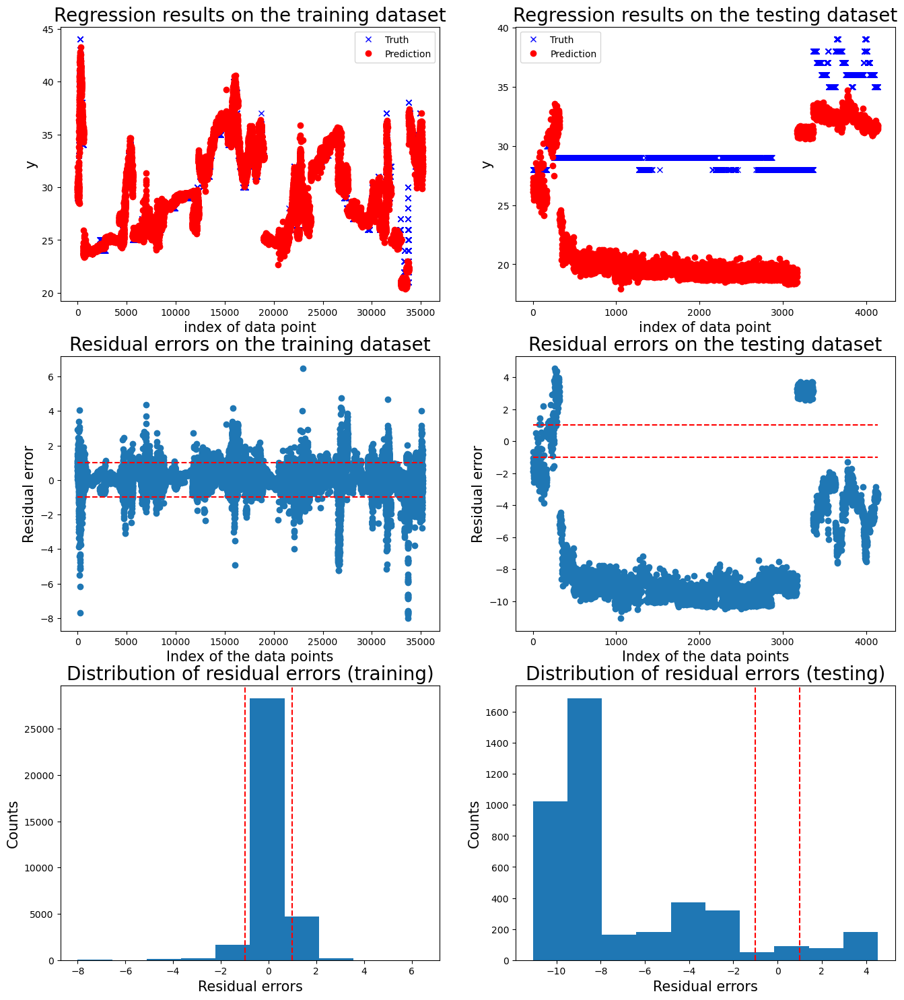


 New run:

training performance, max error is: 7.726723471915918
training performance, mean root square error is: 0.738684662917416
training performance, residual error > 1: 10.378985214807205%

 New run:

testing performance, max error is: 30.61740934057495
testing performance, mean root square error is: 11.049978100025987
testing performance, residual error > 1: 79.9784268171258%


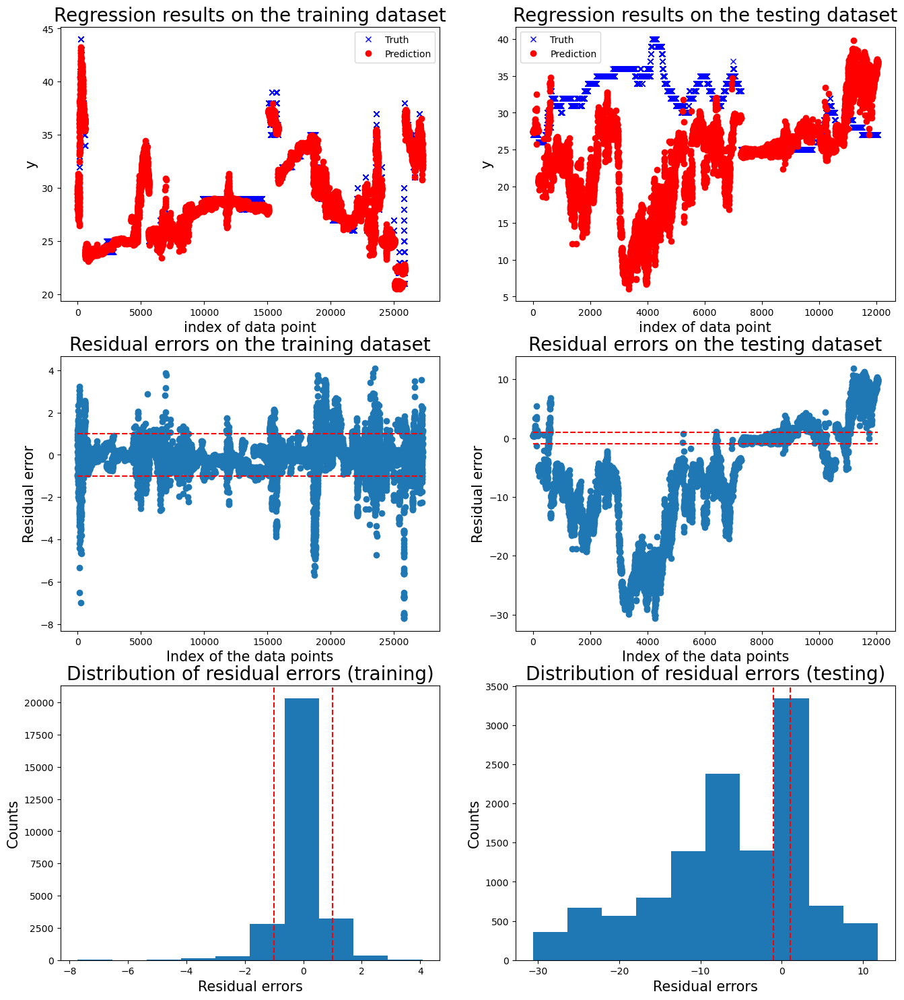


 New run:

training performance, max error is: 8.932047286834774
training performance, mean root square error is: 0.6032842107608628
training performance, residual error > 1: 7.530749221233822%

 New run:

testing performance, max error is: 10.032105868744761
testing performance, mean root square error is: 4.034269975070004
testing performance, residual error > 1: 65.593635250918%


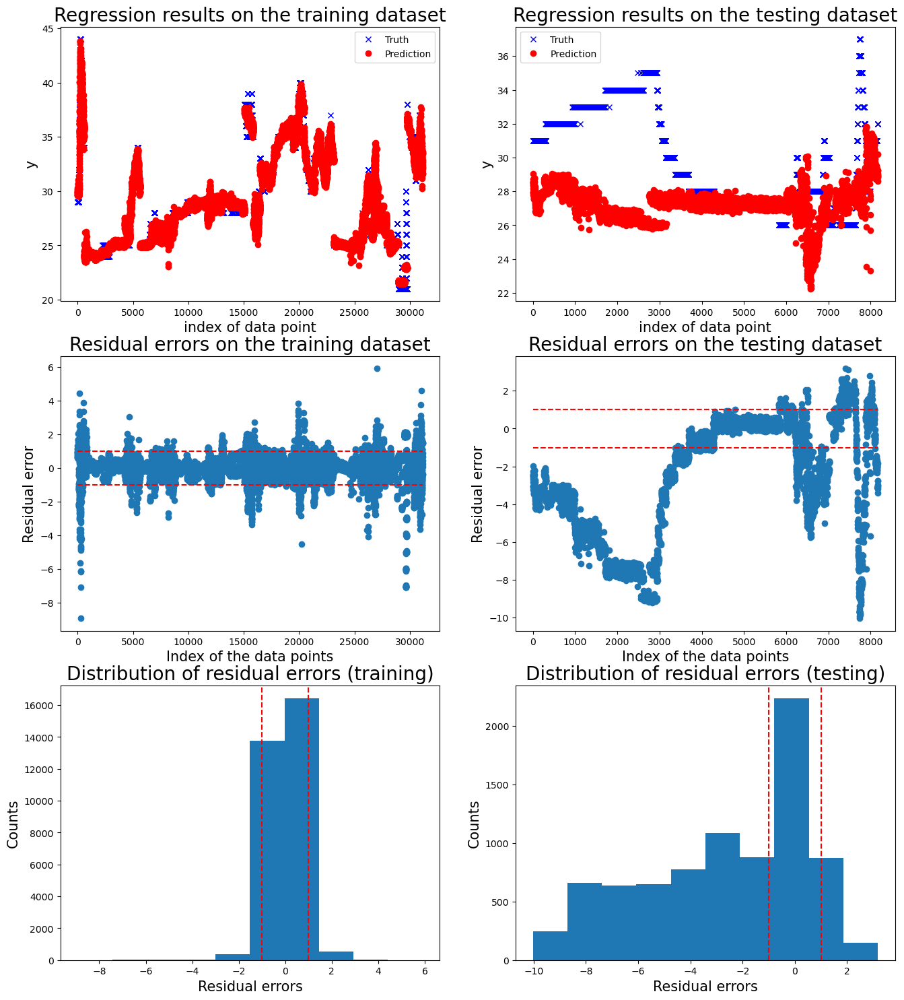


 New run:

training performance, max error is: 7.363479177236741
training performance, mean root square error is: 0.6654792332125965
training performance, residual error > 1: 8.013860013860013%

 New run:

testing performance, max error is: 20.904337372676245
testing performance, mean root square error is: 9.730004939541868
testing performance, residual error > 1: 83.45701917130488%


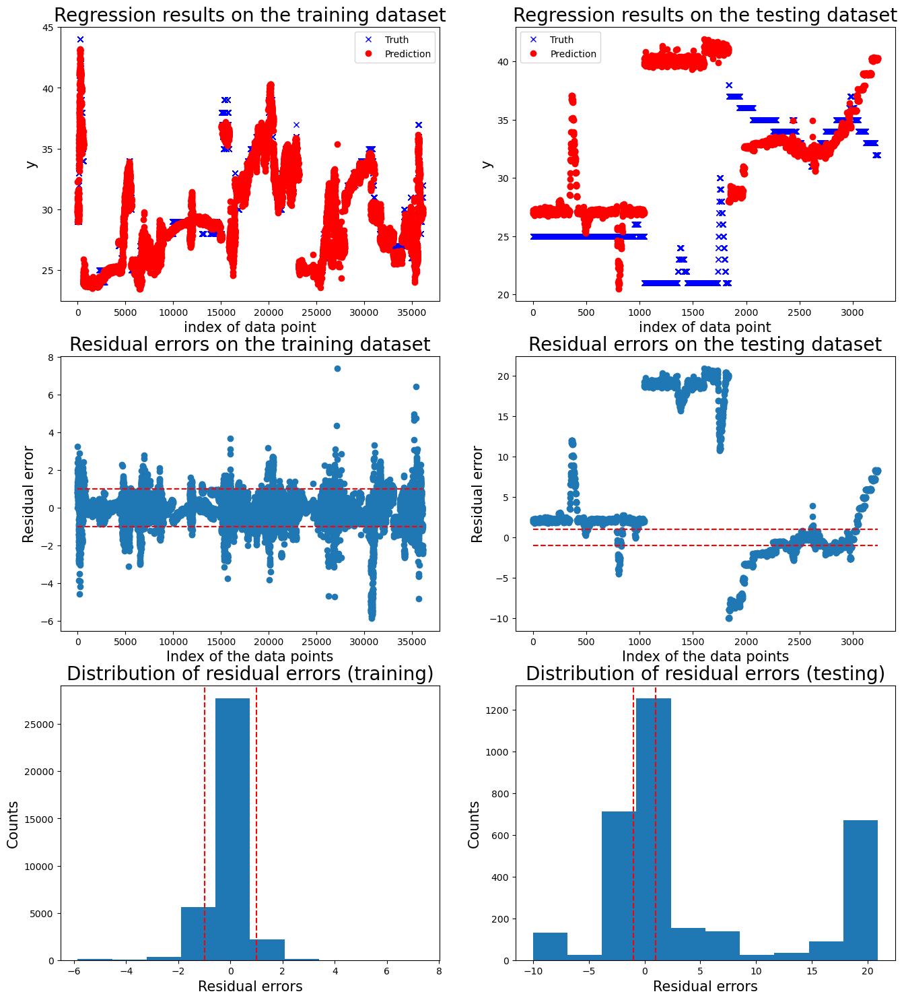

   Max error       RMSE  Exceed boundary rate
0  15.183297   4.493443              0.878767
1  11.066611   7.920169              0.977295
2  30.617409  11.049978              0.799784
3  10.032106   4.034270              0.655936
4  20.904337   9.730005              0.834570


Mean performance metric and standard error:
Max error: 17.5608 +- 8.4582
RMSE: 7.4456 +- 3.1140
Exceed boundary rate: 0.8293 +- 0.1176




In [15]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.neural_network import MLPRegressor
from utility import run_cv_one_motor

feature_list_all = ['data_motor_1_temperature', 'data_motor_1_voltage',
                    'data_motor_2_temperature', 'data_motor_2_voltage',
                    'data_motor_3_temperature', 'data_motor_3_voltage',
                    'data_motor_4_temperature', 'data_motor_4_voltage',
                    'data_motor_5_temperature', 'data_motor_5_voltage',
                    'data_motor_6_temperature', 'data_motor_6_voltage']

# Define the steps of the pipeline
steps = [
    ('standardizer', StandardScaler()),  # Step 1: StandardScaler
    ('regressor', MLPRegressor(hidden_layer_sizes=(20, 30, 20), solver='adam', max_iter=3000))    # Step 2: Linear Regression
]

# Create the pipeline
mdl_mlp_regreession = Pipeline(steps)


threshold = 1
window_size = 1
sample_step = 1

df_perf = run_cv_one_motor(motor_idx=6, df_data=df_data_smoothing, mdl=mdl_mlp_regreession, 
            feature_list=feature_list_all, n_fold=5, 
            threshold=threshold, window_size=window_size, sample_step=sample_step, mdl_type='reg')

**Summary of the results - Only using features from the current moment**

Please add a table in the end, summarying the results from all the models. Please write a few texts to explain what is the best model you got (including the features and preprocessing you did), its performance, and how could you further improve it.

| Model   | Max error | MRSE | Exceed boundary rate |
|---------|----------|-----------|--------|
| Linear regression |   11.6147 +- 2.9111  |   5.3185 +- 0.8187   |  0.8325 +- 0.1312 | 
| Linear regression w smoothing |   10.3404 +- 3.3149  |   4.7227 +- 1.3646   |  0.8024 +- 0.1282 | 
| Linear regression w/o seq to seq variability |   10.9460 +- 3.3280  |   4.5721 +- 1.9191   |  0.8108 +- 0.1422 | 
| Support vector regressor w smoothing |   13.3204 +- 4.6739  |   5.2786 +- 2.7680   |  0.8088 +- 0.0967 | 
| MLP regressor w smoothing |   17.5608 +- 8.4582  |   7.4456 +- 3.1140   |  0.8293 +- 0.1176 | 




The best models are linear regression with smoothing or without sequence to sequence variability

further improvement can be done by using features in the past

## Sub-task 2: Include the features in the past

Now, let's consider using the sliding window approach to include the past in the regression model as well. Please have a look at the demo notebook, run your experiment, and report the best models you could have if you apply the sliding window approach.

### no smoothing

Model for motor 6:

 New run:

training performance, max error is: 1.0303518562248044
training performance, mean root square error is: 0.1174506618194246
training performance, residual error > 1: 0.13821138211382114%

 New run:

testing performance, max error is: 1.0336625022745203
testing performance, mean root square error is: 0.1646620946432431
testing performance, residual error > 1: 0.24529844644317253%


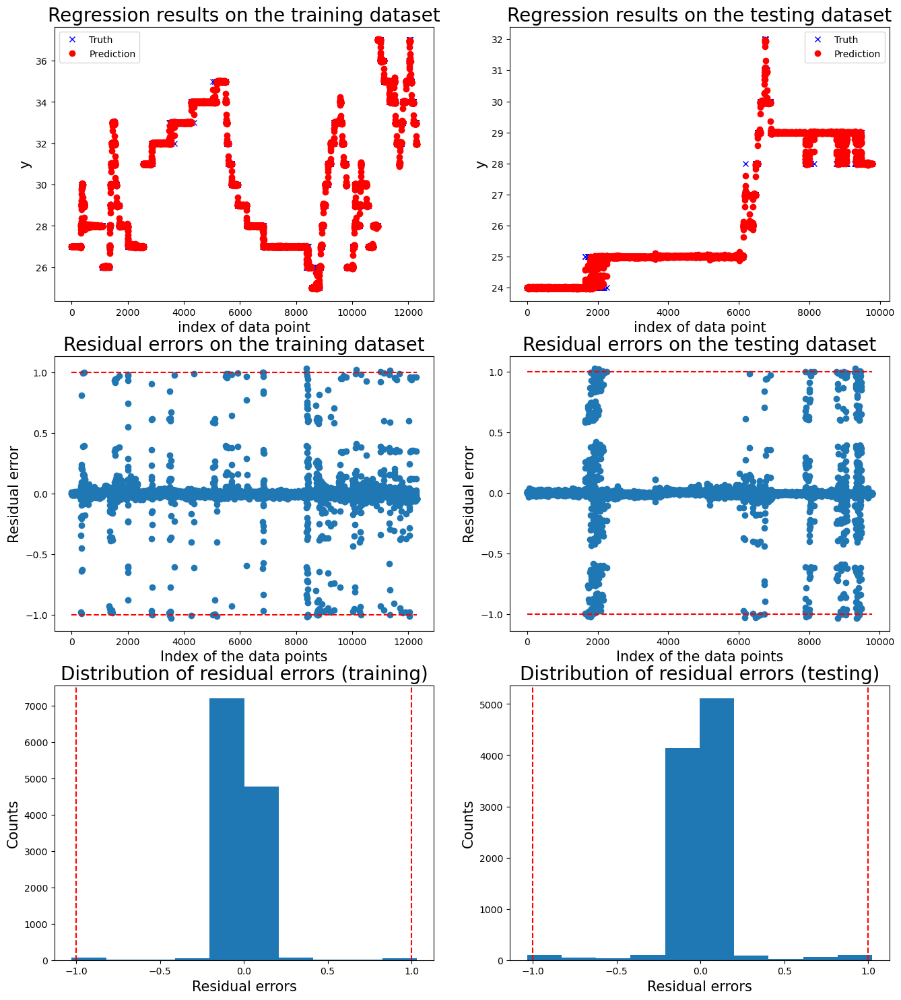


 New run:

training performance, max error is: 1.038054703395094
training performance, mean root square error is: 0.13920700963241514
training performance, residual error > 1: 0.12861430000476348%

 New run:

testing performance, max error is: 1.0387603665209149
testing performance, mean root square error is: 0.09694947100379803
testing performance, residual error > 1: 0.18331805682859761%


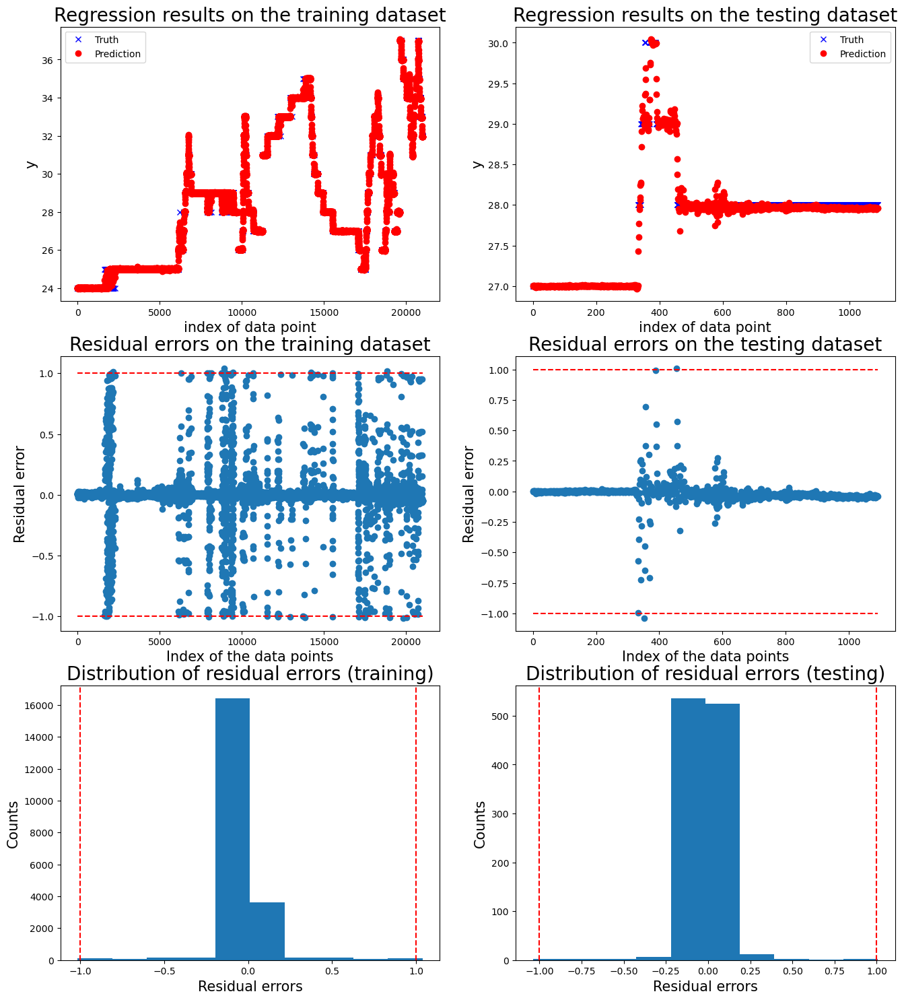


 New run:

training performance, max error is: 1.0470363840796857
training performance, mean root square error is: 0.14786322948594804
training performance, residual error > 1: 0.14949917775452234%

 New run:

testing performance, max error is: 1.0579150337931367
testing performance, mean root square error is: 0.12454225295242996
testing performance, residual error > 1: 0.1837813002526993%


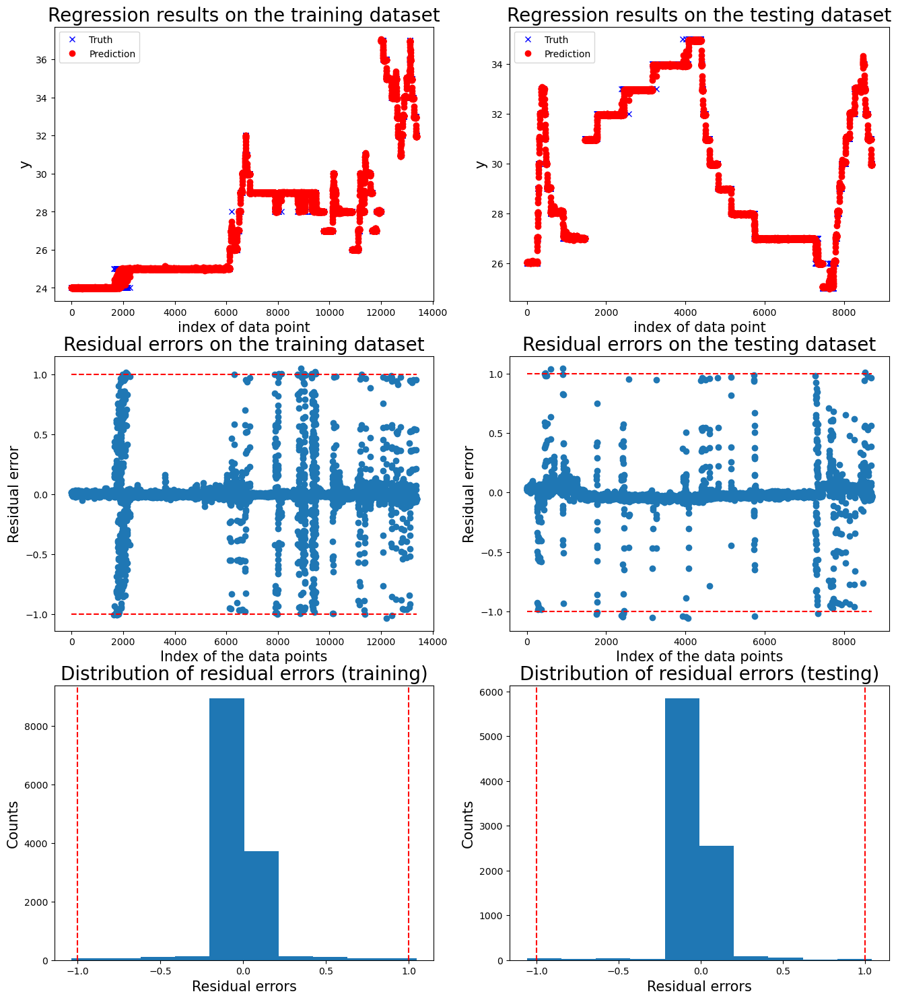


 New run:

training performance, max error is: 1.0276870169469632
training performance, mean root square error is: 0.13706347705926503
training performance, residual error > 1: 0.09855915896184353%

 New run:

testing performance, max error is: 1.049103848289331
testing performance, mean root square error is: 0.145469183079109
testing performance, residual error > 1: 0.6435006435006435%


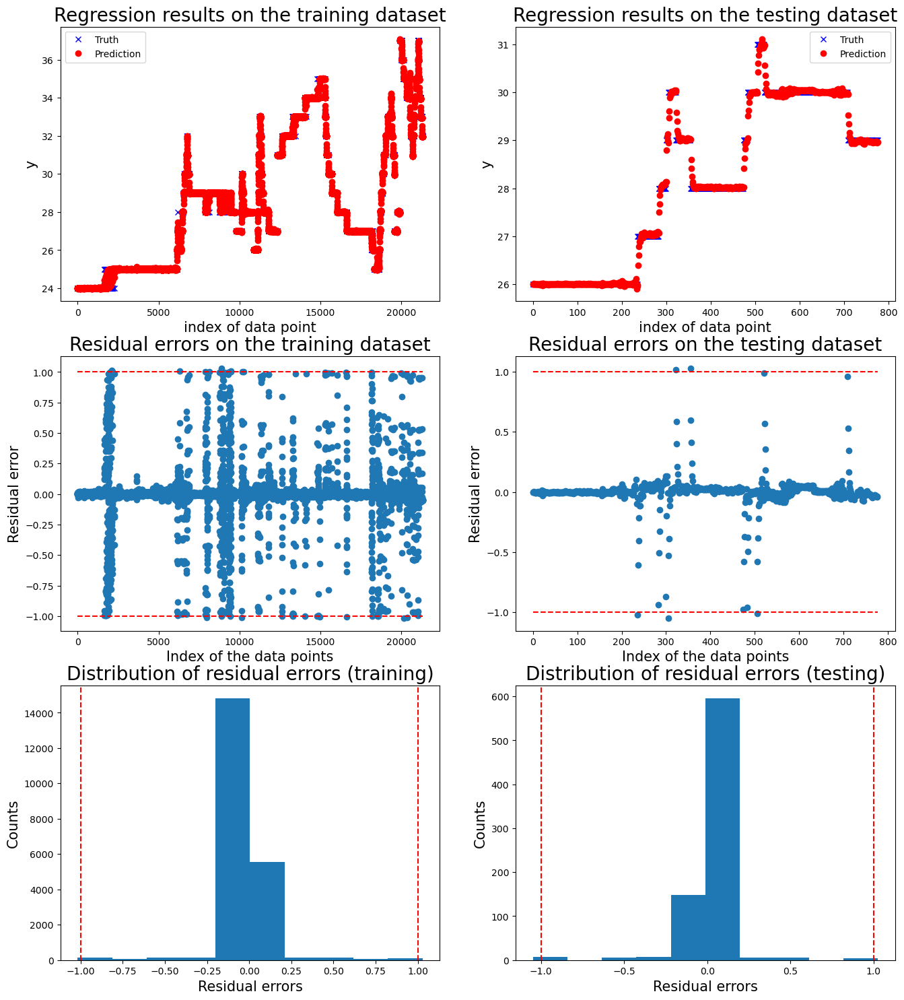


 New run:

training performance, max error is: 1.038024303304077
training performance, mean root square error is: 0.13641308400859367
training performance, residual error > 1: 0.14245014245014245%

 New run:

testing performance, max error is: 1.1514867157995496
testing performance, mean root square error is: 0.15189036535578507
testing performance, residual error > 1: 0.28968713789107764%


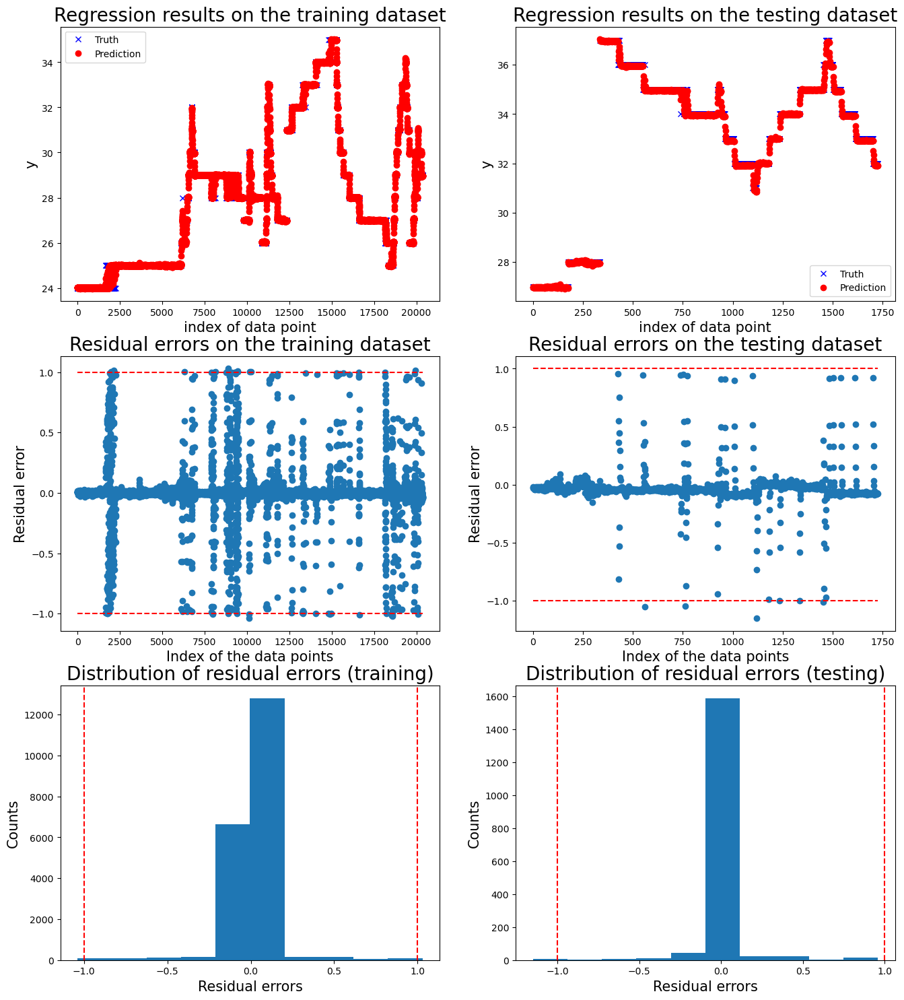

   Max error      RMSE  Exceed boundary rate
0   1.033663  0.164662              0.002453
1   1.038760  0.096949              0.001833
2   1.057915  0.124542              0.001838
3   1.049104  0.145469              0.006435
4   1.151487  0.151890              0.002897


Mean performance metric and standard error:
Max error: 1.0662 +- 0.0486
RMSE: 0.1367 +- 0.0265
Exceed boundary rate: 0.0031 +- 0.0019




In [20]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression

# Define the steps of the pipeline
steps = [
    ('standardizer', StandardScaler()),  # Step 1: StandardScaler
    ('regressor', LinearRegression())    # Step 2: Linear Regression
]

# Create the pipeline
mdl_linear_regreession = Pipeline(steps)


threshold = 1
window_size = 10
sample_step = 1

df_perf = run_cv_one_motor(motor_idx=6, df_data=df_data, mdl=mdl_linear_regreession, 
            feature_list=feature_list_all, n_fold=5, 
            threshold=threshold, window_size=window_size, sample_step=sample_step, mdl_type='reg')

### add smoothing

Model for motor 6:

 New run:

training performance, max error is: 1.0464823730987405
training performance, mean root square error is: 0.1251950573661825
training performance, residual error > 1: 0.1171303074670571%

 New run:

testing performance, max error is: 1.0754155037740958
testing performance, mean root square error is: 0.17602270878149268
testing performance, residual error > 1: 0.2994609702535436%


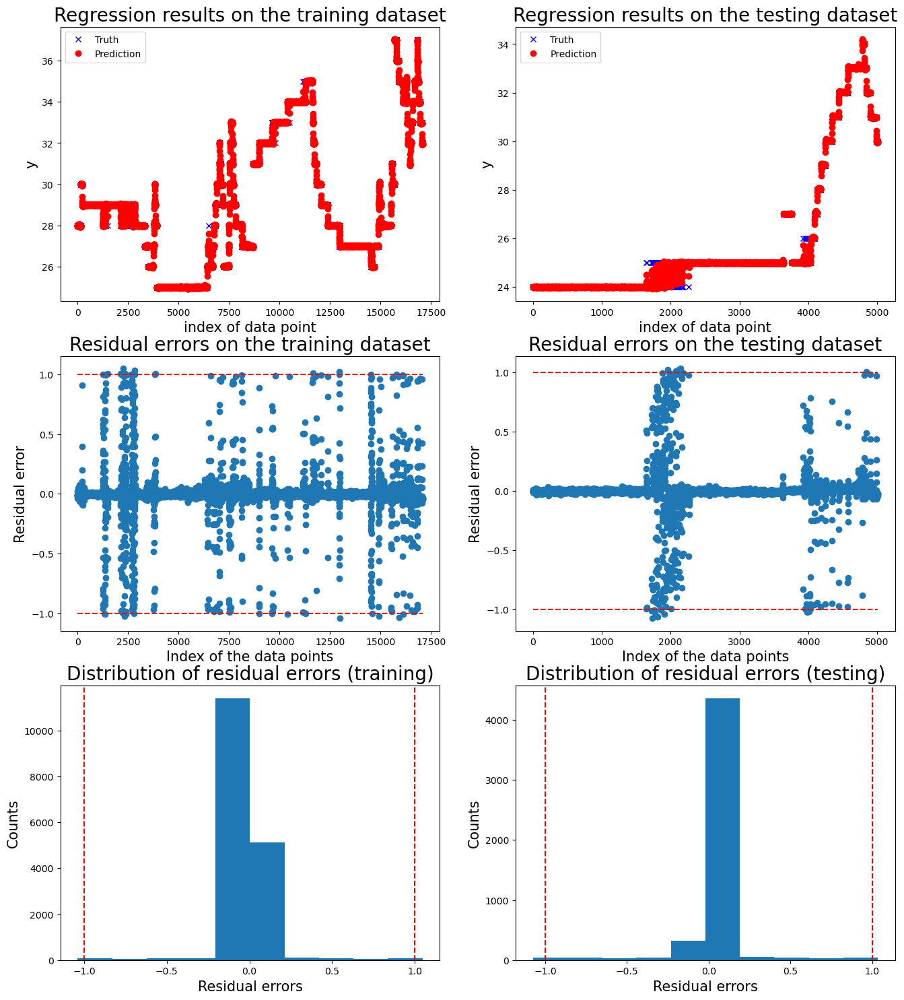


 New run:

training performance, max error is: 1.035281134768809
training performance, mean root square error is: 0.12642629744332234
training performance, residual error > 1: 0.10560219652568774%

 New run:

testing performance, max error is: 1.034820308855629
testing performance, mean root square error is: 0.19192145043080433
testing performance, residual error > 1: 0.7313195548489666%


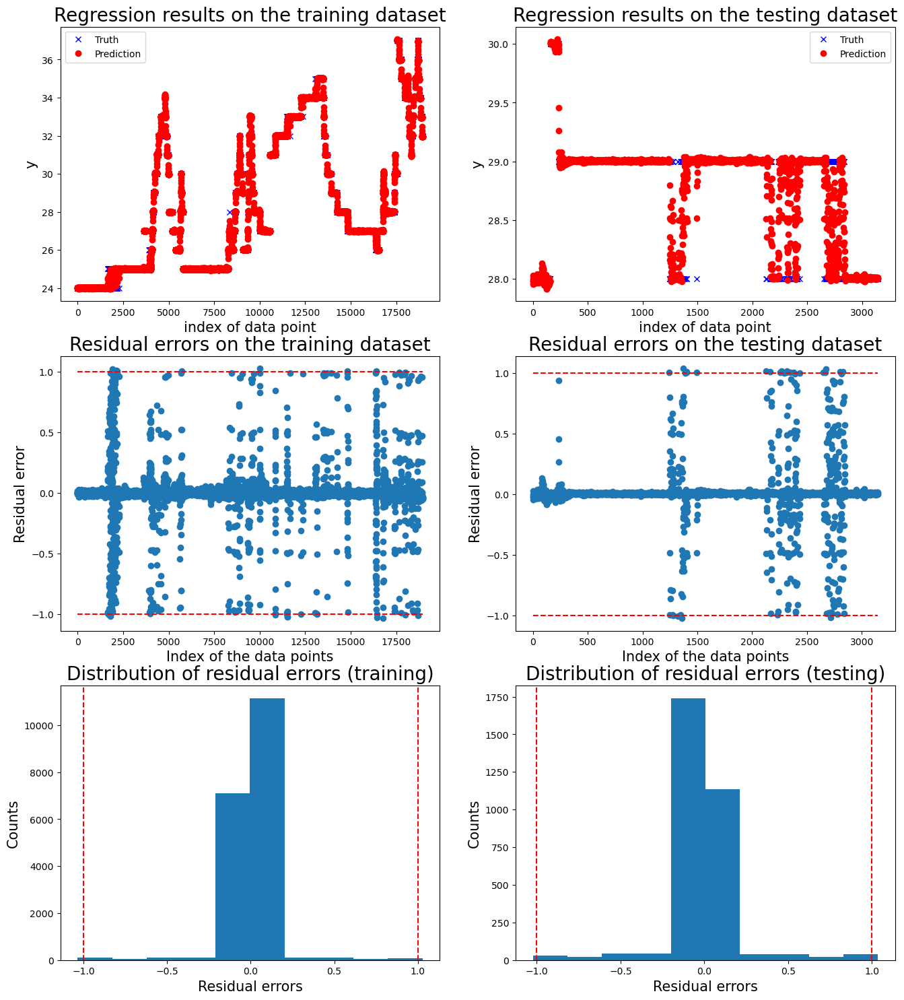


 New run:

training performance, max error is: 1.0547262858823707
training performance, mean root square error is: 0.13827752281226258
training performance, residual error > 1: 0.08918512955313557%

 New run:

testing performance, max error is: 1.0376768704440593
testing performance, mean root square error is: 0.10561077214275305
testing performance, residual error > 1: 0.38461538461538464%


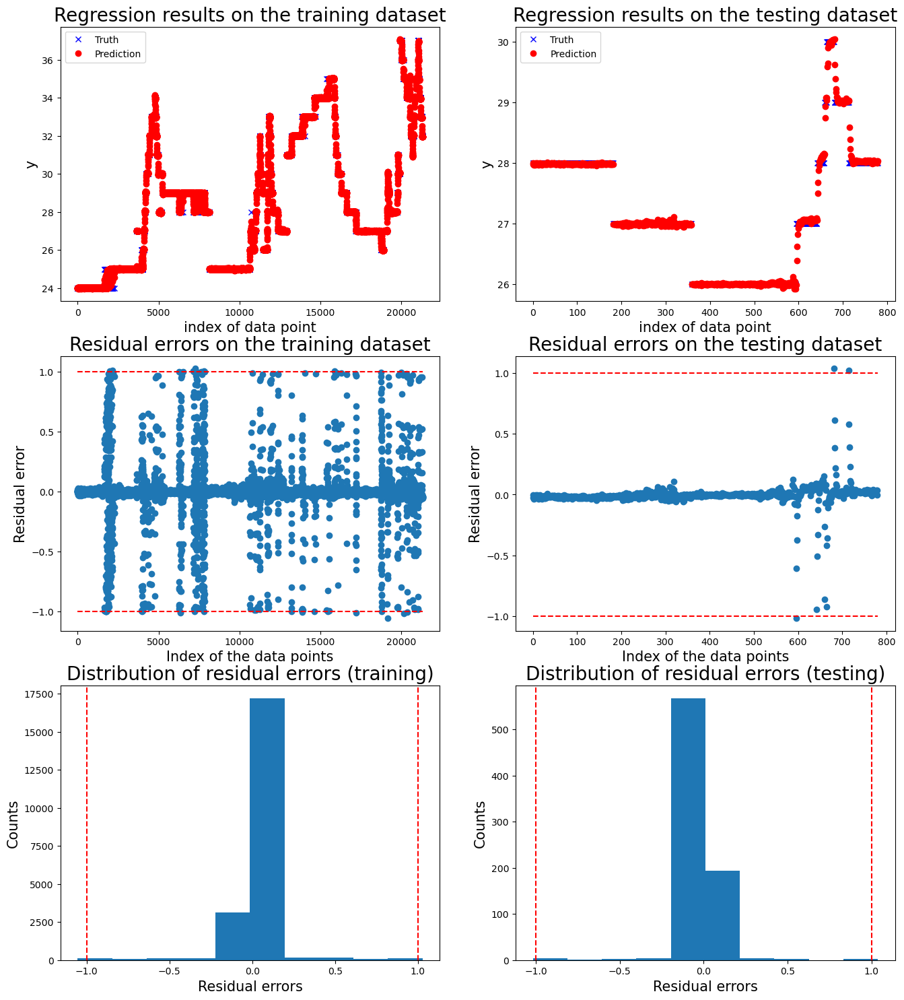


 New run:

training performance, max error is: 1.0321245247953392
training performance, mean root square error is: 0.16445594689895066
training performance, residual error > 1: 0.12359848150437008%

 New run:

testing performance, max error is: 1.0631992535471966
testing performance, mean root square error is: 0.10683669196825418
testing performance, residual error > 1: 0.19522171609184716%


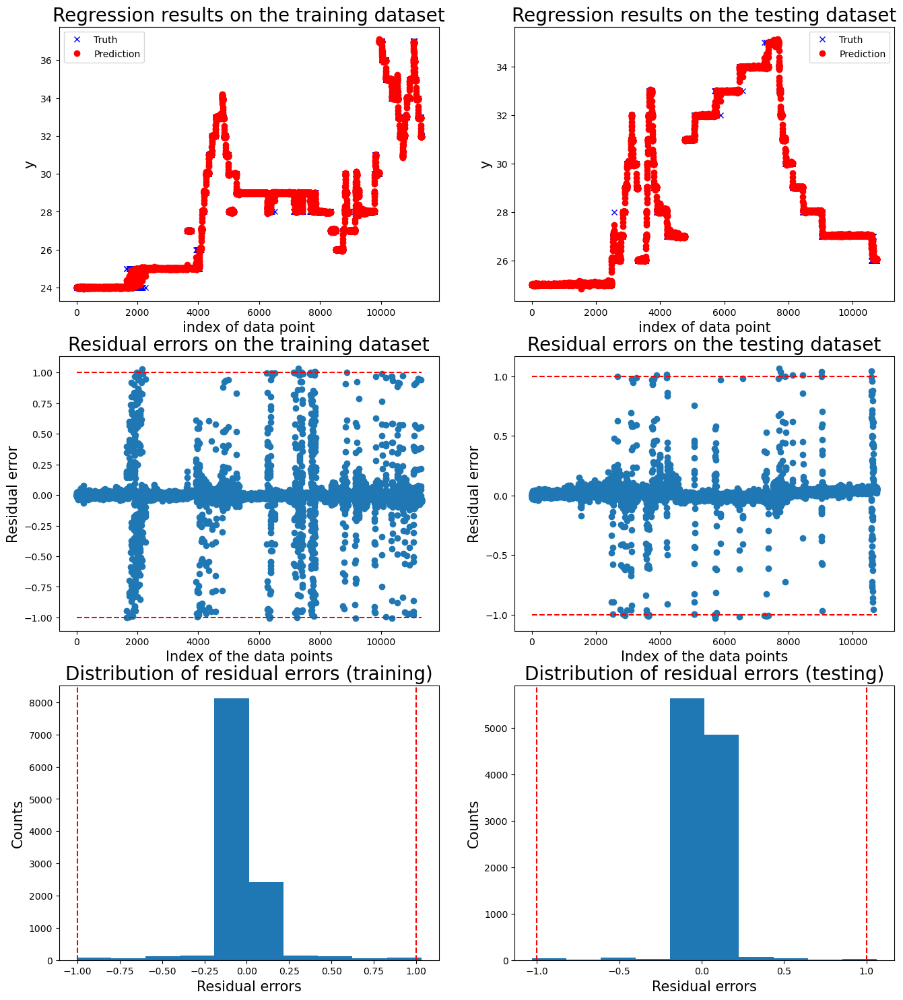


 New run:

training performance, max error is: 1.0294935543627446
training performance, mean root square error is: 0.1358954997299193
training performance, residual error > 1: 0.10664770707429791%

 New run:

testing performance, max error is: 1.1430262846348462
testing performance, mean root square error is: 0.15716331880155102
testing performance, residual error > 1: 0.41788549937317176%


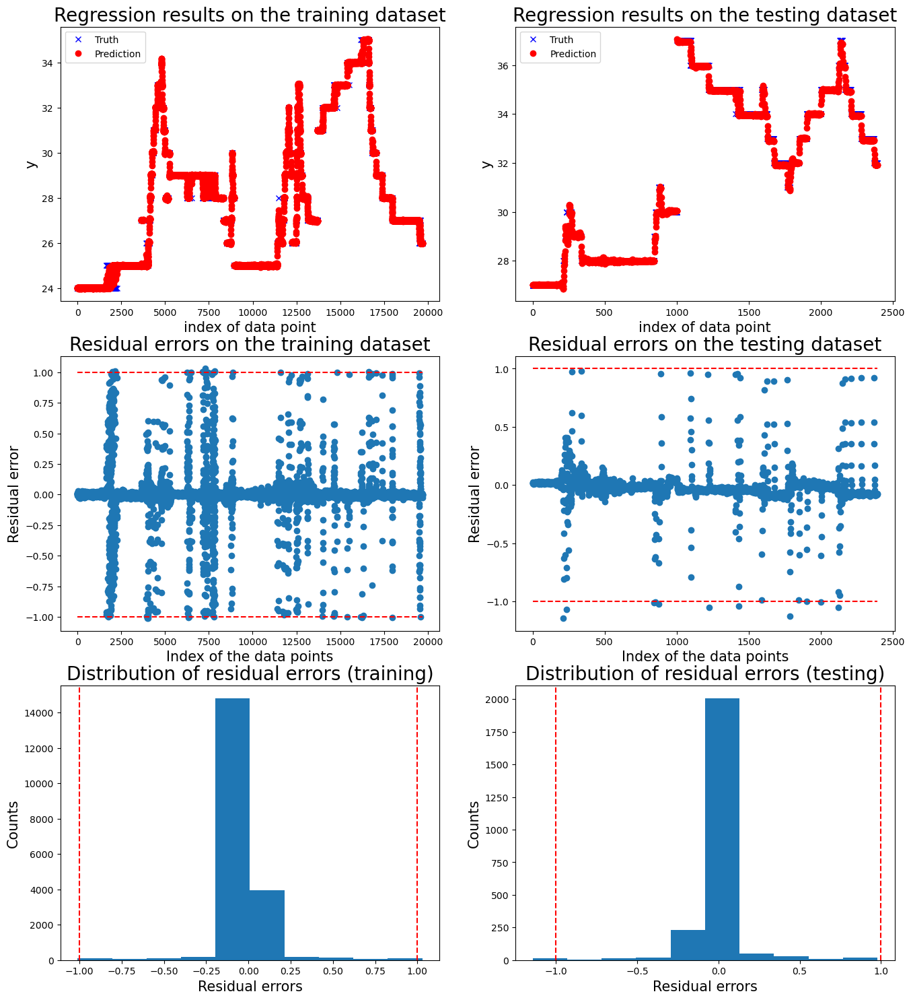

   Max error      RMSE  Exceed boundary rate
0   1.075416  0.176023              0.002995
1   1.034820  0.191921              0.007313
2   1.037677  0.105611              0.003846
3   1.063199  0.106837              0.001952
4   1.143026  0.157163              0.004179


Mean performance metric and standard error:
Max error: 1.0708 +- 0.0438
RMSE: 0.1475 +- 0.0396
Exceed boundary rate: 0.0041 +- 0.0020




In [21]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression

# Define the steps of the pipeline
steps = [
    ('standardizer', StandardScaler()),  # Step 1: StandardScaler
    ('regressor', LinearRegression())    # Step 2: Linear Regression
]

# Create the pipeline
mdl_linear_regreession = Pipeline(steps)


threshold = 1
window_size = 10
sample_step = 1

df_perf = run_cv_one_motor(motor_idx=6, df_data=df_data_smoothing, mdl=mdl_linear_regreession, 
            feature_list=feature_list_all, n_fold=5, 
            threshold=threshold, window_size=window_size, sample_step=sample_step, mdl_type='reg')

### remove seq to seq variability

In [30]:
from utility import read_all_test_data_from_path
import numpy as np 
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
import warnings
%matplotlib inline


def compensate_seq_bias(df: pd.DataFrame):
    ''' # Description
    Adjust for the sequence-to-sequence bias.
    '''
    # Tranform the features relative to the first data point.
    df['temperature'] = df['temperature'] - df['temperature'].iloc[0]
    df['voltage'] = df['voltage'] - df['voltage'].iloc[0]
    df['position'] = df['position'] - df['position'].iloc[0]


def remove_outliers(df: pd.DataFrame):
    ''' # Description
    Remove outliers from the dataframe based on defined valid ranges. 
    Define a valid range of temperature and voltage. 
    Use ffil function to replace the invalid measurement with the previous value.
    '''
    df['temperature'] = df['temperature'].where(df['temperature'] <= 100, np.nan)
    df['temperature'] = df['temperature'].where(df['temperature'] >= 0, np.nan)
    df['temperature'] = df['temperature'].ffill()        

    df['voltage'] = df['voltage'].where(df['voltage'] >= 6000, np.nan)
    df['voltage'] = df['voltage'].where(df['voltage'] <= 9000, np.nan)
    df['voltage'] = df['voltage'].ffill()        

    df['position'] = df['position'].where(df['position'] >= 0, np.nan)
    df['position'] = df['position'].where(df['position'] <= 1000, np.nan)
    df['position'] = df['position'].ffill()


# Subfunction for data preprocessing.
def pre_processing(df: pd.DataFrame):
    ''' ### Description
    Preprocess the data:
    - remove outliers
    - Adjust for the sequence-to-sequence bias.
    - add new features about the difference between the current and previous n data point.
    '''     
    # Start processing.
    remove_outliers(df)
    compensate_seq_bias(df)


In [31]:
base_dictionary = '../../dataset/training_data/'
df_data_rem_seq = read_all_test_data_from_path(base_dictionary, pre_processing, is_plot=False)

normal_test_id = ['20240105_164214', 
    '20240105_165300', 
    '20240105_165972', 
    '20240320_152031', 
    '20240320_153841', 
    '20240320_155664', 
    '20240321_122650', 
    '20240325_135213', 
    '20240426_141190', 
    '20240426_141532', 
    '20240426_141602', 
    '20240426_141726', 
    '20240426_141938', 
    '20240426_141980', 
    '20240503_164435']
df_data_rem_seq = df_data_rem_seq[df_data_rem_seq['test_condition'].isin(normal_test_id)]

Model for motor 6:

 New run:

training performance, max error is: 1.0267868027192026
training performance, mean root square error is: 0.11741525350906981
training performance, residual error > 1: 0.14634146341463414%

 New run:

testing performance, max error is: 1.0394838352813798
testing performance, mean root square error is: 0.16479624597441964
testing performance, residual error > 1: 0.3270645952575634%


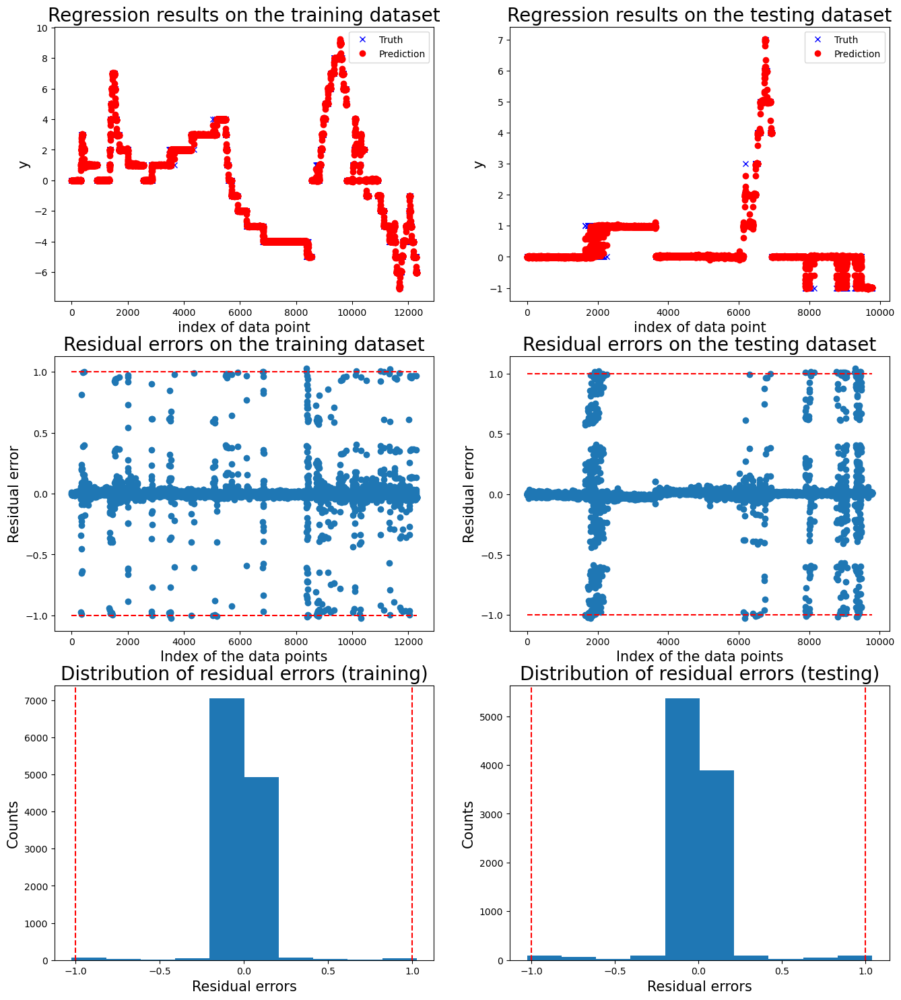


 New run:

training performance, max error is: 1.0362271772688358
training performance, mean root square error is: 0.1391687366772595
training performance, residual error > 1: 0.12385080741199447%

 New run:

testing performance, max error is: 1.0429930159074445
testing performance, mean root square error is: 0.09479917822186974
testing performance, residual error > 1: 0.18331805682859761%


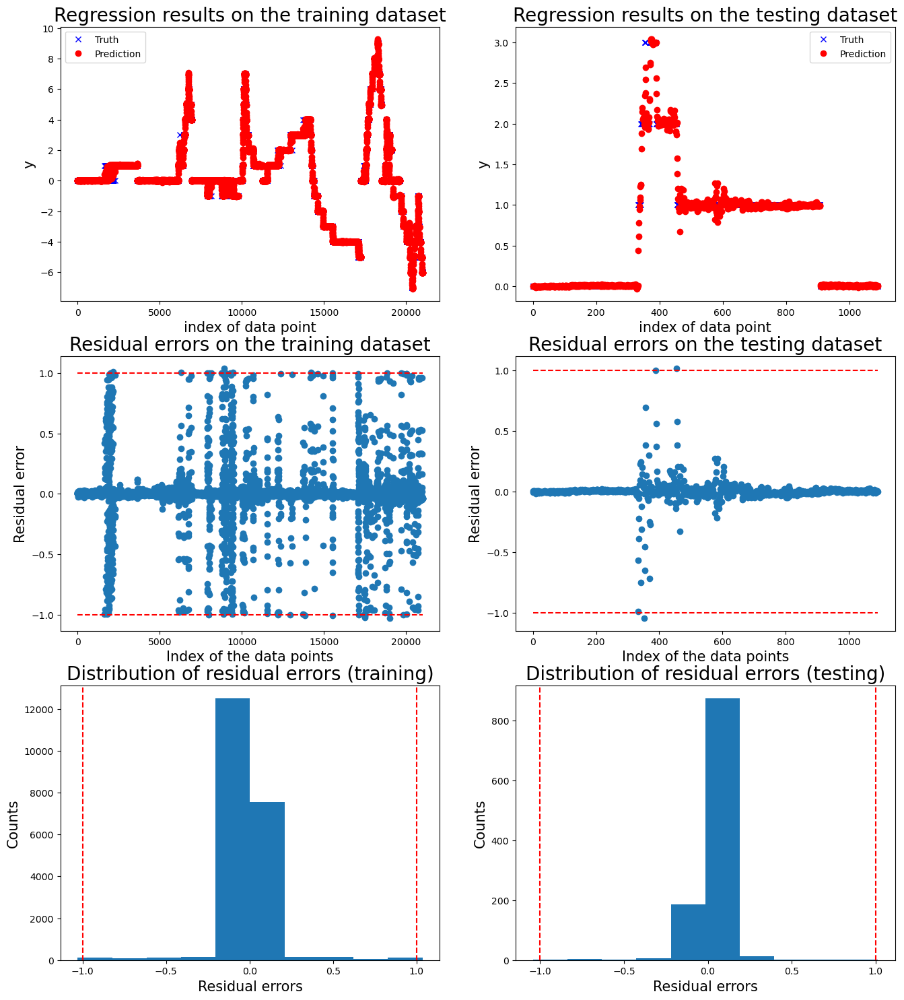


 New run:

training performance, max error is: 1.044517130563984
training performance, mean root square error is: 0.14794858694320123
training performance, residual error > 1: 0.14949917775452234%

 New run:

testing performance, max error is: 1.0975741727531108
testing performance, mean root square error is: 0.1323226084281207
testing performance, residual error > 1: 0.28715828164484264%


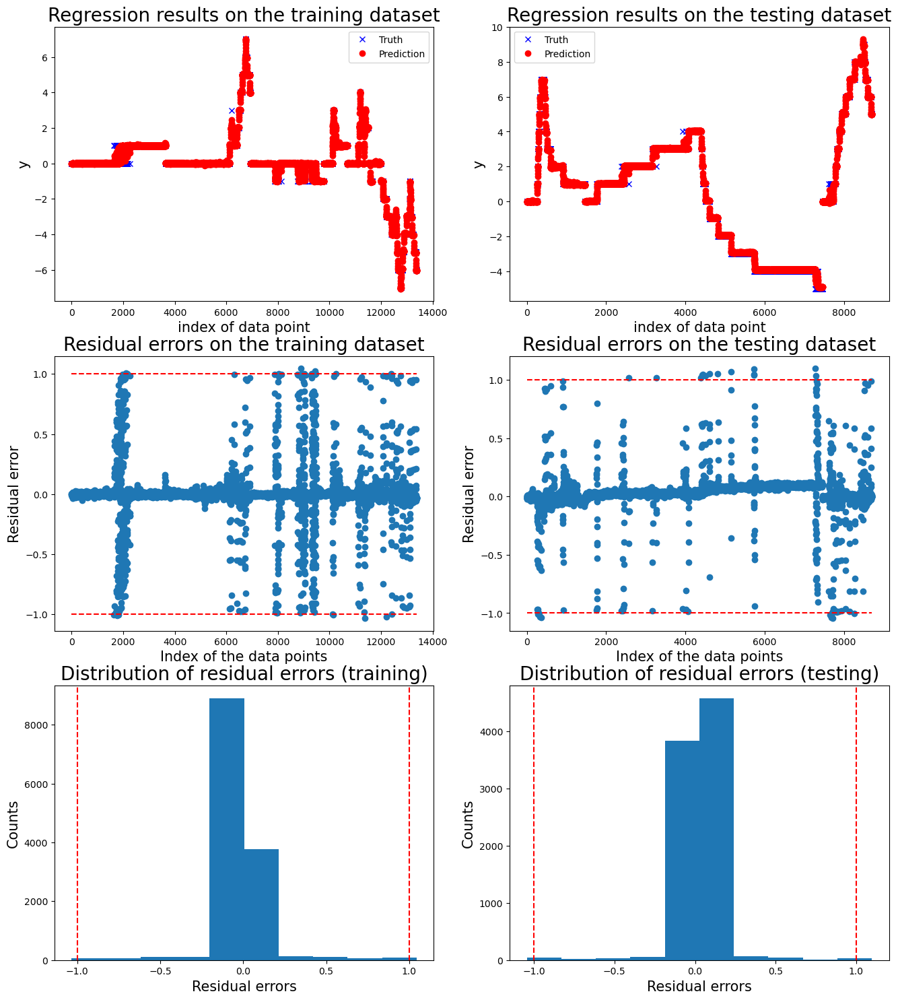


 New run:

training performance, max error is: 1.0260921485988863
training performance, mean root square error is: 0.13698453492426874
training performance, residual error > 1: 0.09855915896184353%

 New run:

testing performance, max error is: 1.0394035167601405
testing performance, mean root square error is: 0.14603213960544753
testing performance, residual error > 1: 0.5148005148005148%


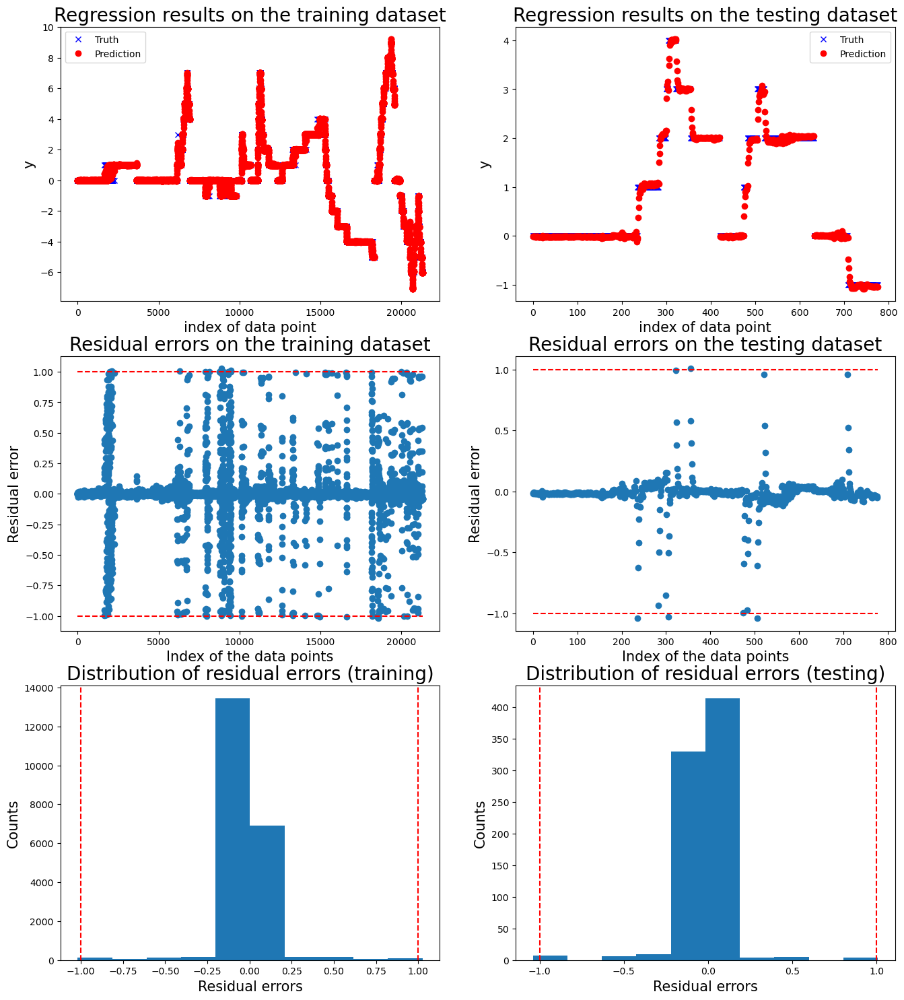


 New run:

training performance, max error is: 1.0310673184242654
training performance, mean root square error is: 0.13635784817410548
training performance, residual error > 1: 0.12280184693977797%

 New run:

testing performance, max error is: 1.062490829551189
testing performance, mean root square error is: 0.15141359342975155
testing performance, residual error > 1: 0.4055619930475087%


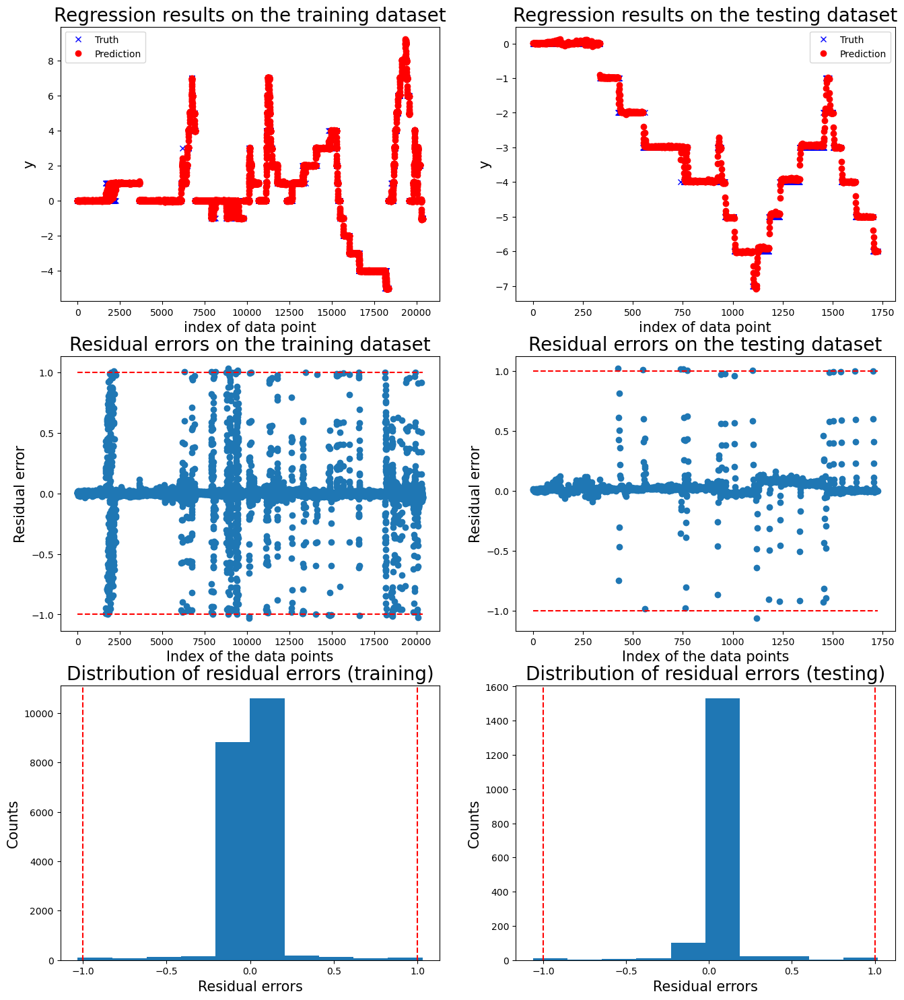

   Max error      RMSE  Exceed boundary rate
0   1.039484  0.164796              0.003271
1   1.042993  0.094799              0.001833
2   1.097574  0.132323              0.002872
3   1.039404  0.146032              0.005148
4   1.062491  0.151414              0.004056


Mean performance metric and standard error:
Max error: 1.0564 +- 0.0249
RMSE: 0.1379 +- 0.0267
Exceed boundary rate: 0.0034 +- 0.0012




In [32]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression


# Define the steps of the pipeline
steps = [
    ('standardizer', StandardScaler()),  # Step 1: StandardScaler
    ('regressor', LinearRegression())    # Step 2: Linear Regression
]

# Create the pipeline
mdl_linear_regreession = Pipeline(steps)

from utility import run_cv_one_motor

feature_list_all = ['time', 'data_motor_1_position', 'data_motor_1_temperature', 'data_motor_1_voltage',
                    'data_motor_2_position', 'data_motor_2_temperature', 'data_motor_2_voltage',
                    'data_motor_3_position', 'data_motor_3_temperature', 'data_motor_3_voltage',
                    'data_motor_4_position', 'data_motor_4_temperature', 'data_motor_4_voltage',
                    'data_motor_5_position', 'data_motor_5_temperature', 'data_motor_5_voltage',
                    'data_motor_6_position', 'data_motor_6_temperature', 'data_motor_6_voltage']

threshold = 1
window_size = 10
sample_step = 1

df_perf = run_cv_one_motor(motor_idx=6, df_data=df_data_rem_seq, mdl=mdl_linear_regreession, 
            feature_list=feature_list_all, n_fold=5, 
            threshold=threshold, window_size=window_size, sample_step=sample_step, mdl_type='reg')

### remove seq to seq and change model to ridge

Model for motor 6:

 New run:

training performance, max error is: 1.0742825206209856
training performance, mean root square error is: 0.1177974126807257
training performance, residual error > 1: 0.14634146341463414%

 New run:

testing performance, max error is: 1.0392103991137351
testing performance, mean root square error is: 0.16387946761709607
testing performance, residual error > 1: 0.31684382665576455%


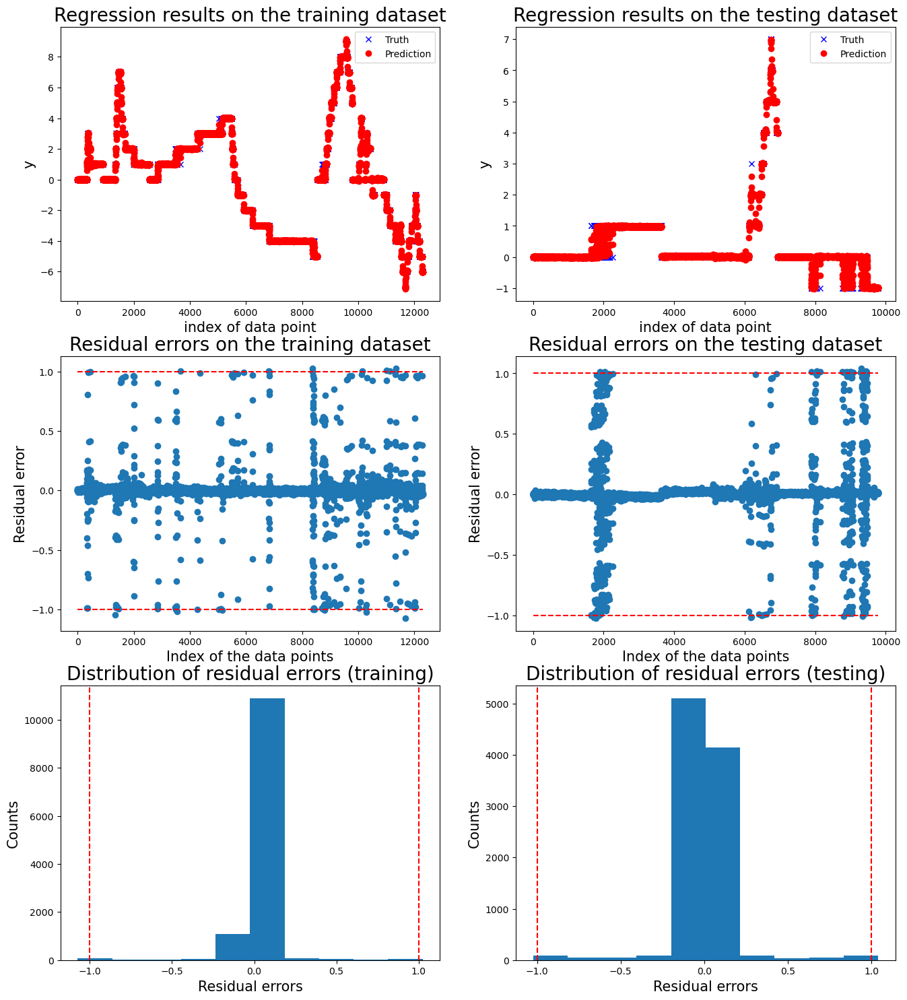


 New run:

training performance, max error is: 1.1115122334281509
training performance, mean root square error is: 0.13940313333668403
training performance, residual error > 1: 0.13814128519030153%

 New run:

testing performance, max error is: 1.0384670457250638
testing performance, mean root square error is: 0.09526055981558328
testing performance, residual error > 1: 0.27497708524289644%


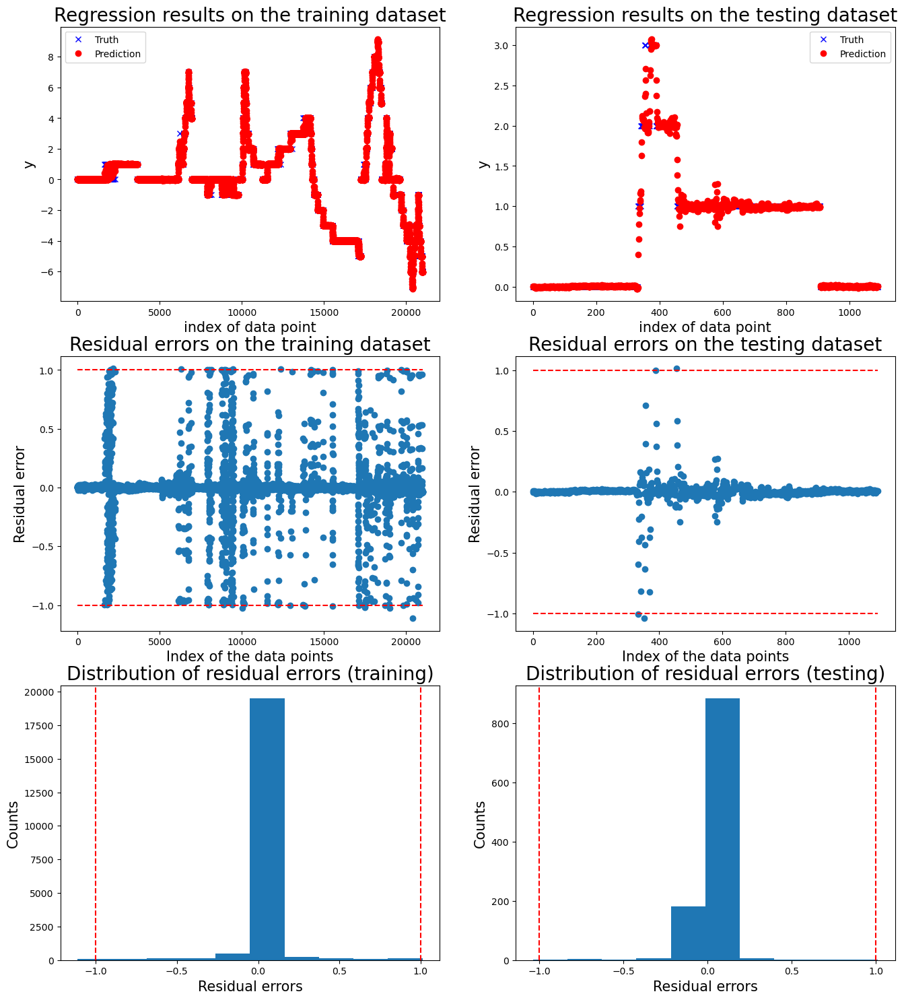


 New run:

training performance, max error is: 1.0960452803159502
training performance, mean root square error is: 0.14835570063122597
training performance, residual error > 1: 0.14949917775452234%

 New run:

testing performance, max error is: 1.0902691594207483
testing performance, mean root square error is: 0.1307586541801992
testing performance, residual error > 1: 0.32161727544222374%


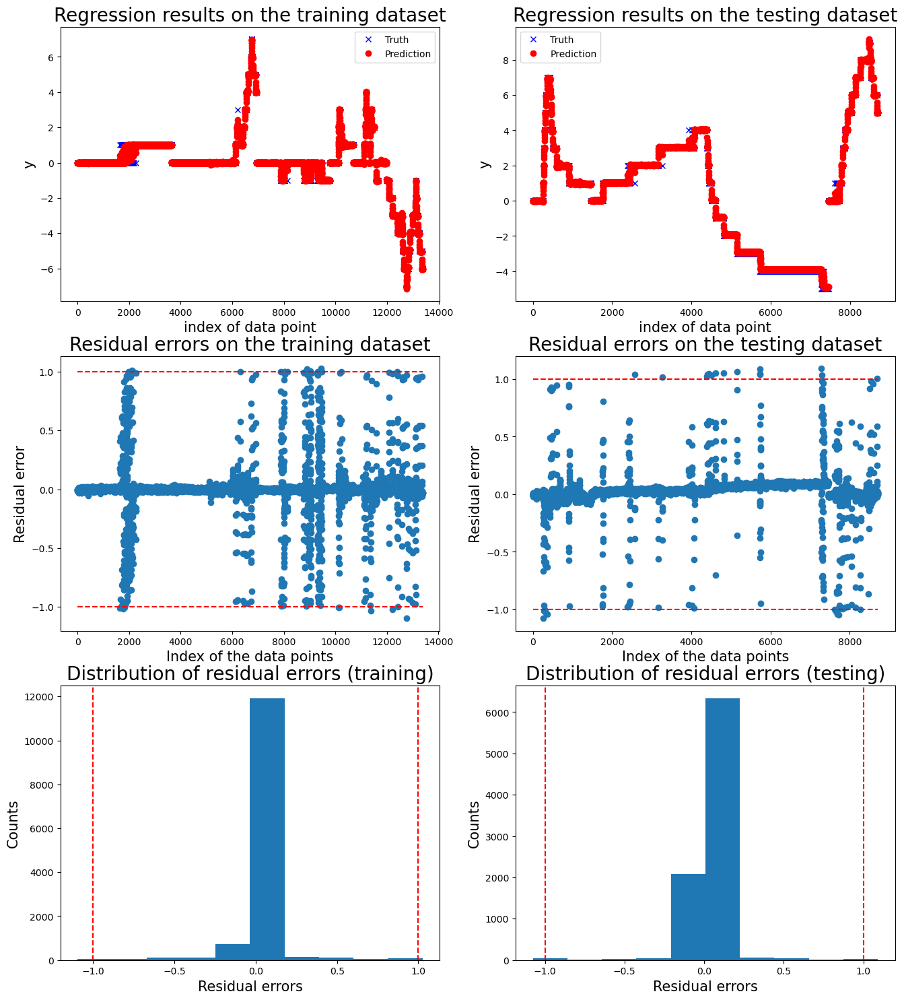


 New run:

training performance, max error is: 1.1458306527036655
training performance, mean root square error is: 0.1372379995189419
training performance, residual error > 1: 0.10325245224574084%

 New run:

testing performance, max error is: 1.0539324321832417
testing performance, mean root square error is: 0.14622993062063394
testing performance, residual error > 1: 0.5148005148005148%


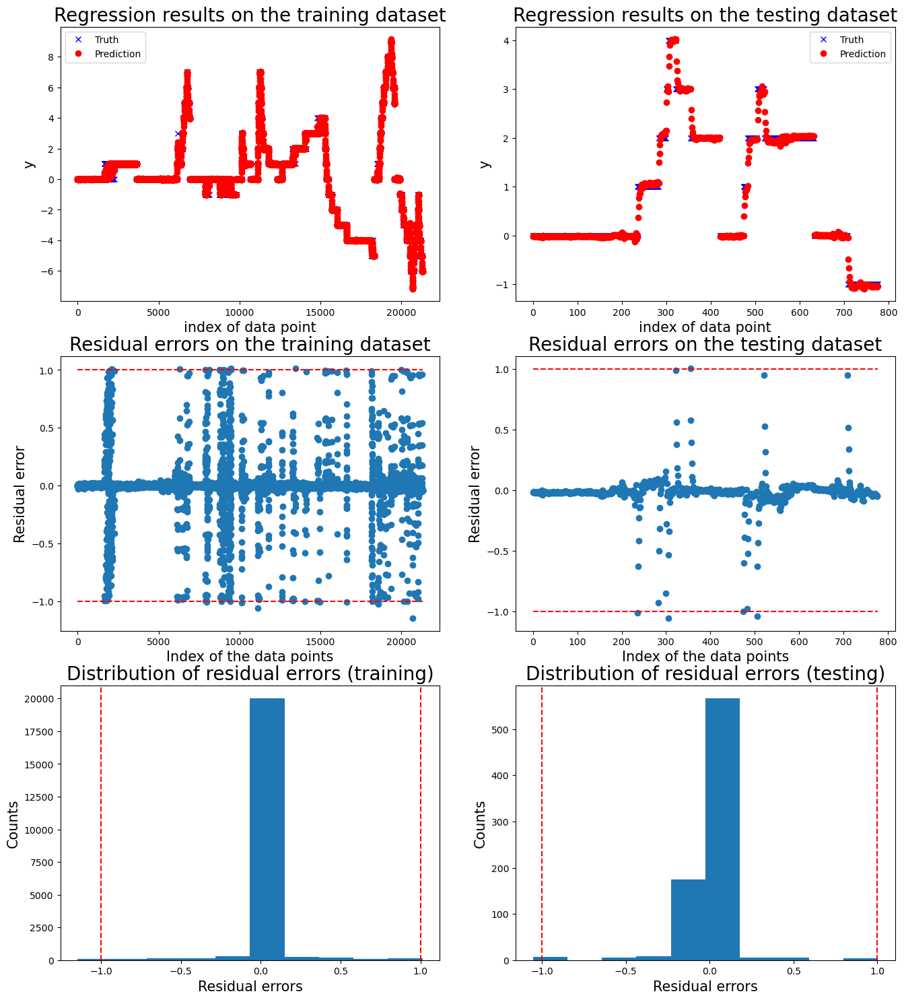


 New run:

training performance, max error is: 1.0618263917562438
training performance, mean root square error is: 0.13649232628621888
training performance, residual error > 1: 0.14245014245014245%

 New run:

testing performance, max error is: 1.2220902844363266
testing performance, mean root square error is: 0.15323047609075344
testing performance, residual error > 1: 0.4055619930475087%


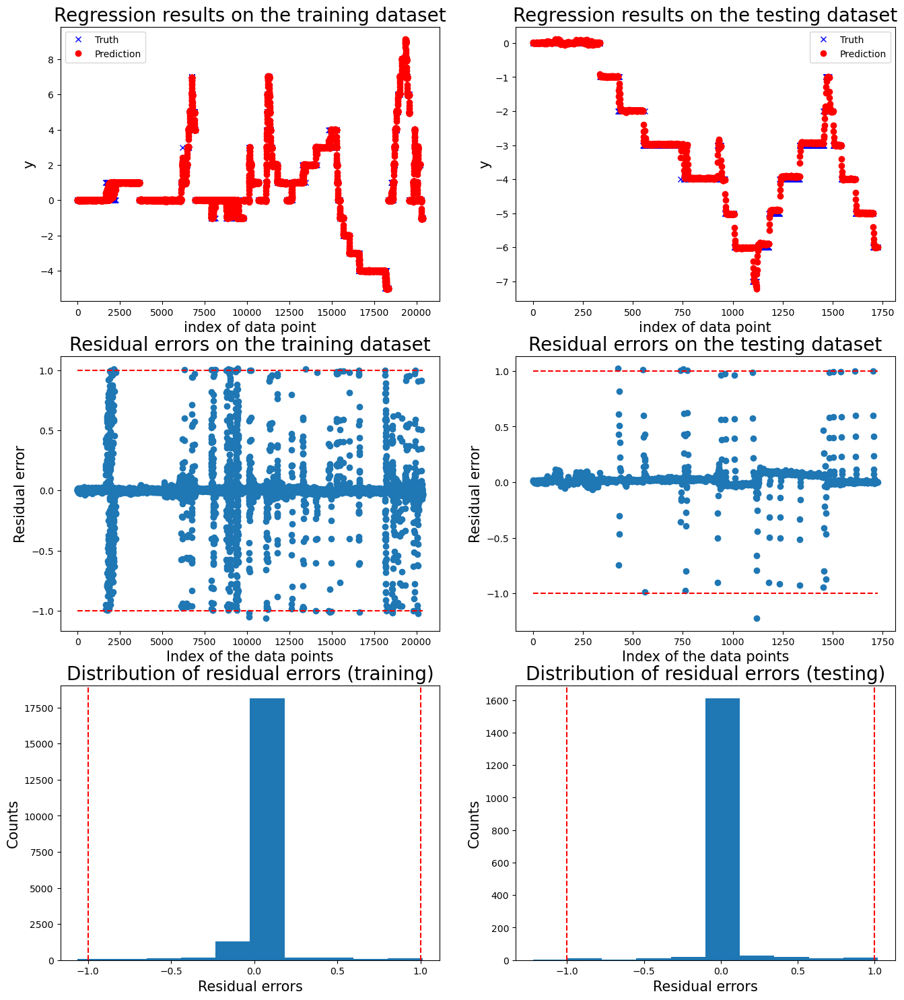

   Max error      RMSE  Exceed boundary rate
0   1.039210  0.163879              0.003168
1   1.038467  0.095261              0.002750
2   1.090269  0.130759              0.003216
3   1.053932  0.146230              0.005148
4   1.222090  0.153230              0.004056


Mean performance metric and standard error:
Max error: 1.0888 +- 0.0774
RMSE: 0.1379 +- 0.0267
Exceed boundary rate: 0.0037 +- 0.0010




In [33]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet


# Define the steps of the pipeline
steps = [
    ('standardizer', StandardScaler()),  # Step 1: StandardScaler
    ('regressor', Ridge())    # Step 2: Linear Regression
]

# Create the pipeline
mdl_linear_regreession = Pipeline(steps)

from utility import run_cv_one_motor

feature_list_all = ['time', 'data_motor_1_position', 'data_motor_1_temperature', 'data_motor_1_voltage',
                    'data_motor_2_position', 'data_motor_2_temperature', 'data_motor_2_voltage',
                    'data_motor_3_position', 'data_motor_3_temperature', 'data_motor_3_voltage',
                    'data_motor_4_position', 'data_motor_4_temperature', 'data_motor_4_voltage',
                    'data_motor_5_position', 'data_motor_5_temperature', 'data_motor_5_voltage',
                    'data_motor_6_position', 'data_motor_6_temperature', 'data_motor_6_voltage']

threshold = 1
window_size = 10
sample_step = 1

df_perf = run_cv_one_motor(motor_idx=6, df_data=df_data_rem_seq, mdl=mdl_linear_regreession, 
            feature_list=feature_list_all, n_fold=5, 
            threshold=threshold, window_size=window_size, sample_step=sample_step, mdl_type='reg')

### remove seq to seq and change model to NN

Model for motor 6:

 New run:

training performance, max error is: 1.1332146251593853
training performance, mean root square error is: 0.12546237420480386
training performance, residual error > 1: 0.1951219512195122%

 New run:

testing performance, max error is: 1.1426764903826143
testing performance, mean root square error is: 0.1851495040434601
testing performance, residual error > 1: 0.2964022894521668%


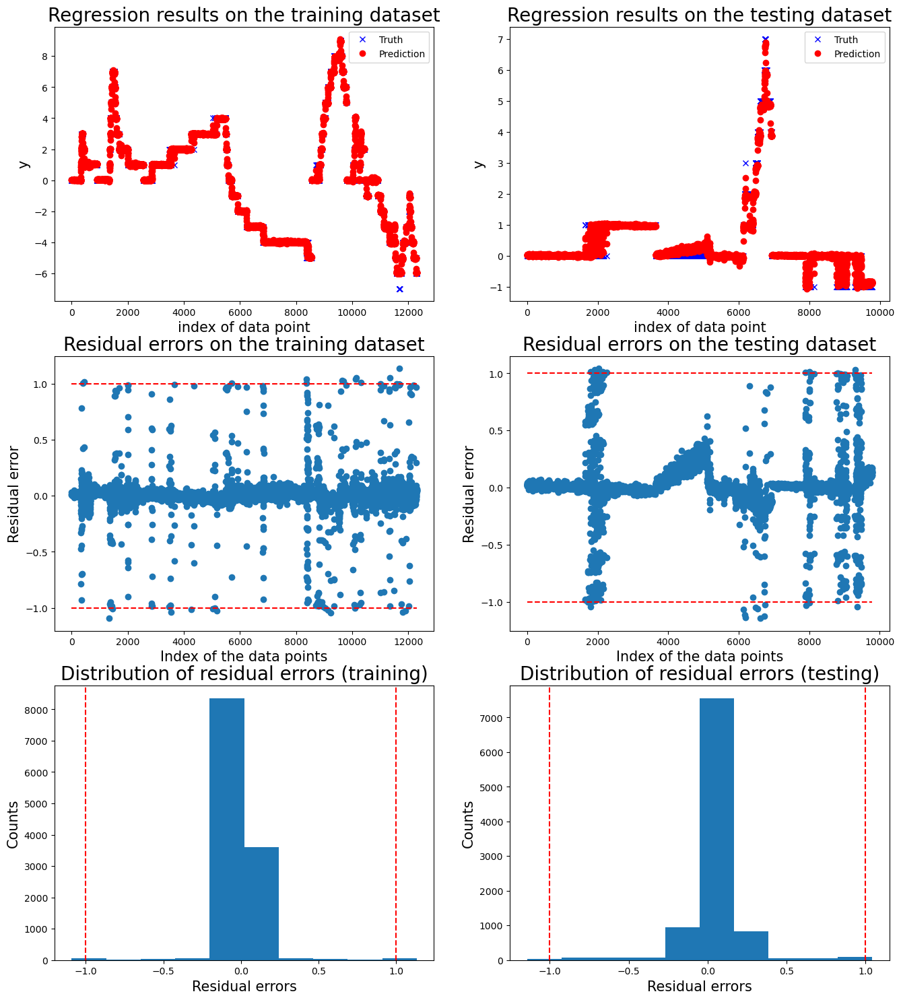


 New run:

training performance, max error is: 1.103788021031833
training performance, mean root square error is: 0.14326689220788108
training performance, residual error > 1: 0.24293812223121994%

 New run:

testing performance, max error is: 2.6546617232115493
testing performance, mean root square error is: 0.23286599414597675
testing performance, residual error > 1: 1.2832263978001834%


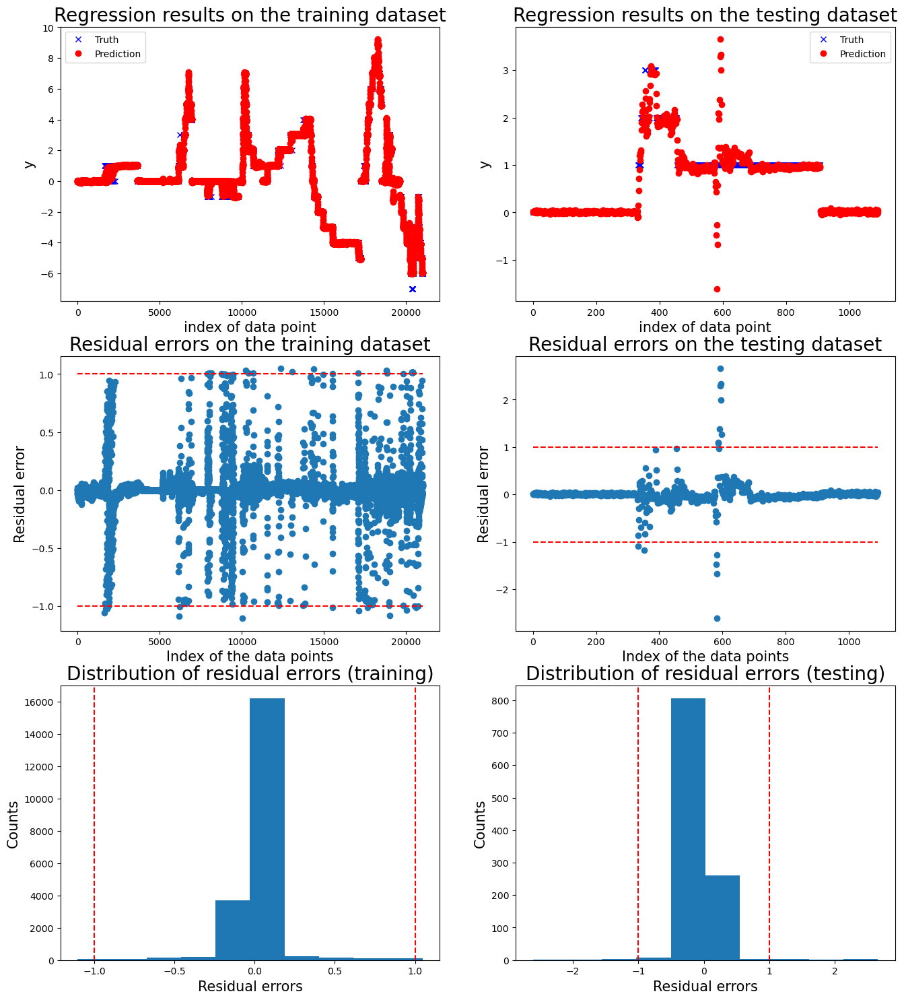


 New run:

training performance, max error is: 1.042733144001661
training performance, mean root square error is: 0.15041731299822048
training performance, residual error > 1: 0.09717446554043953%

 New run:

testing performance, max error is: 3.1112323237682786
testing performance, mean root square error is: 0.7421599718823173
testing performance, residual error > 1: 26.93544681828624%


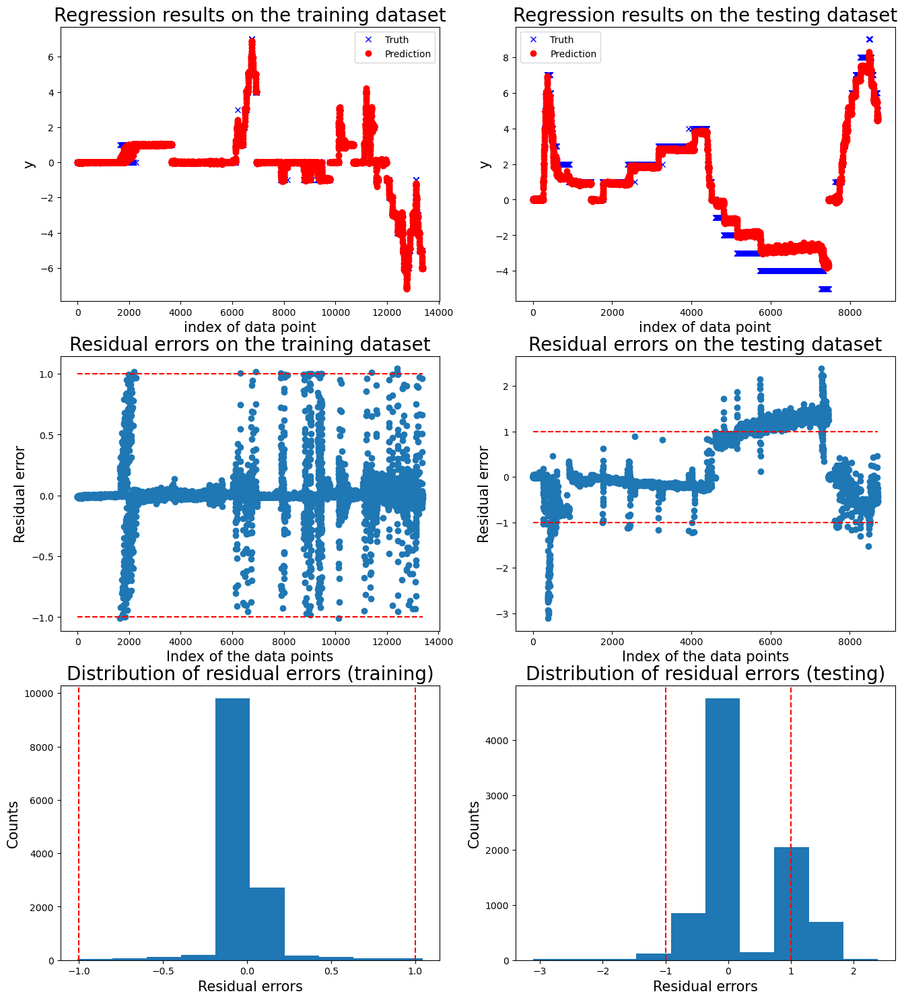


 New run:

training performance, max error is: 1.1110494928613623
training performance, mean root square error is: 0.14085822525810648
training performance, residual error > 1: 0.1267189186652274%

 New run:

testing performance, max error is: 1.5321140758812979
testing performance, mean root square error is: 0.4550369777358459
testing performance, residual error > 1: 8.494208494208493%


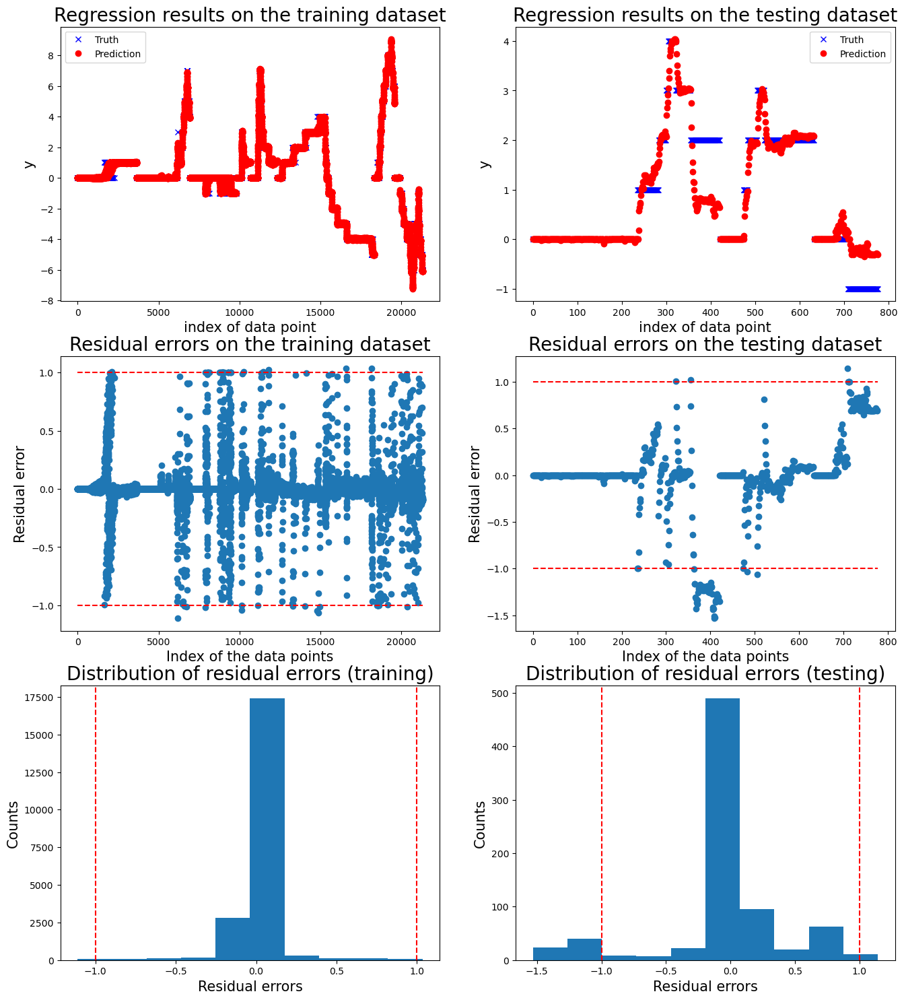


 New run:

training performance, max error is: 1.0655386579785127
training performance, mean root square error is: 0.1403702150304834
training performance, residual error > 1: 0.08841732979664013%

 New run:

testing performance, max error is: 7.005551924877487
testing performance, mean root square error is: 2.394456617204253
testing performance, residual error > 1: 61.12398609501738%


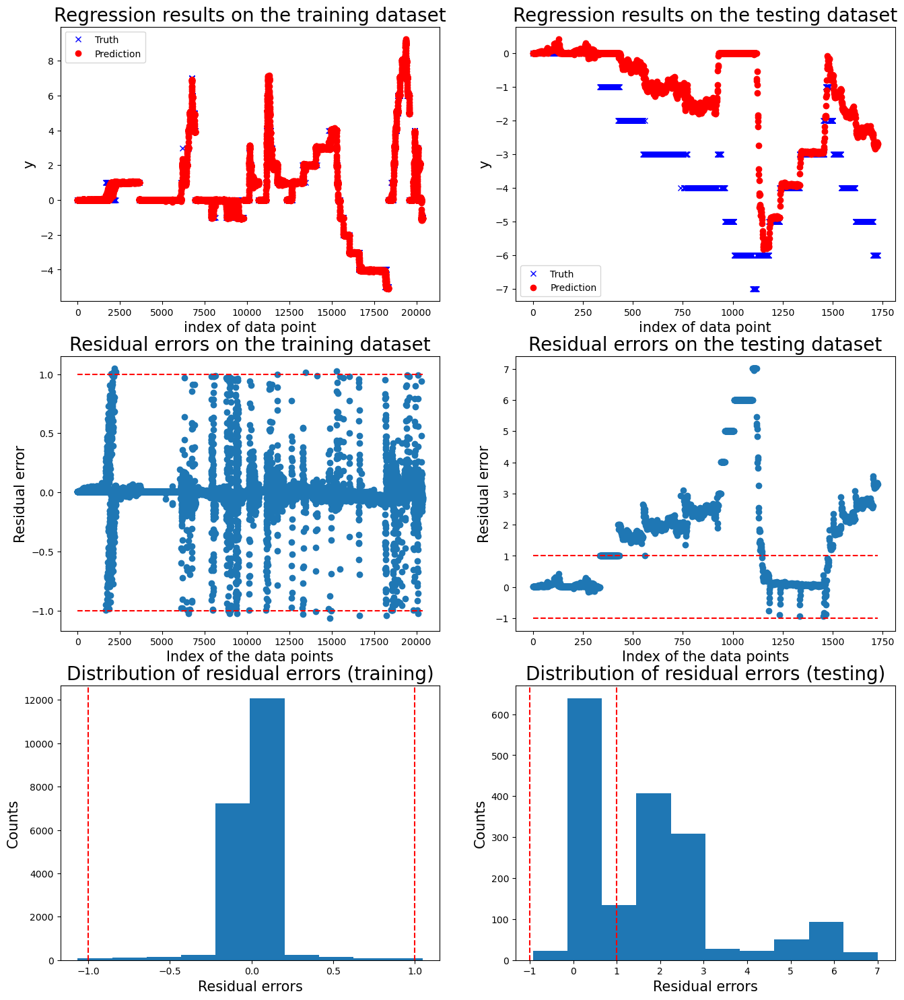

   Max error      RMSE  Exceed boundary rate
0   1.142676  0.185150              0.002964
1   2.654662  0.232866              0.012832
2   3.111232  0.742160              0.269354
3   1.532114  0.455037              0.084942
4   7.005552  2.394457              0.611240


Mean performance metric and standard error:
Max error: 3.0892 +- 2.3313
RMSE: 0.8019 +- 0.9171
Exceed boundary rate: 0.1963 +- 0.2554




In [35]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.neural_network import MLPRegressor


# Define the steps of the pipeline
steps = [
    ('standardizer', StandardScaler()),  # Step 1: StandardScaler
    ('regressor', MLPRegressor(hidden_layer_sizes=(3, 5, 3), max_iter=1000, learning_rate='adaptive'))    # Step 2: MLPRegressor
]

# Create the pipeline
mdl_linear_regreession = Pipeline(steps)

from utility import run_cv_one_motor

feature_list_all = ['time', 'data_motor_1_position', 'data_motor_1_temperature', 'data_motor_1_voltage',
                    'data_motor_2_position', 'data_motor_2_temperature', 'data_motor_2_voltage',
                    'data_motor_3_position', 'data_motor_3_temperature', 'data_motor_3_voltage',
                    'data_motor_4_position', 'data_motor_4_temperature', 'data_motor_4_voltage',
                    'data_motor_5_position', 'data_motor_5_temperature', 'data_motor_5_voltage',
                    'data_motor_6_position', 'data_motor_6_temperature', 'data_motor_6_voltage']

threshold = 1
window_size = 10
sample_step = 1

df_perf = run_cv_one_motor(motor_idx=6, df_data=df_data_rem_seq, mdl=mdl_linear_regreession, 
            feature_list=feature_list_all, n_fold=5, 
            threshold=threshold, window_size=window_size, sample_step=sample_step, mdl_type='reg')

**Summary of the results - Sliding window**

Please add a table in the end, summarying the results from all the models. Please write a few texts to explain what is the best model you got (including the features and preprocessing you did), its performance, and how could you further improve it.

| Model   (also report parameters like window_size, sample_step, prediction_lead_time, etc.) | Max error | MRSE | Exceed boundary rate |
|---------|----------|-----------|--------|
| Linear regression |   1.0662 +- 0.0486  |   0.1367 +- 0.0265   |  0.0031 +- 0.0019 | 
| Lr w smoothing |   1.0708 +- 0.0438  |   0.1475 +- 0.0396   |  0.0041 +- 0.0020 | 
| Lr w/o seq to seq var |   1.0564 +- 0.0249  |   0.1379 +- 0.0267   |  0.0034 +- 0.0012 | 
| Ridge w/o seq to seq var |   1.0888 +- 0.0774  |   0.1379 +- 0.0267   |  0.0037 +- 0.0010 | 
| Mlp small |   3.0892 +- 2.3313  |   0.8019 +- 0.9171   |  0.1963 +- 0.2554 | 


By including features in the past for the prediction, the models perform much better.
The best performance has been archived with Linear regression trained on data without sequence to sequence variability.

# Task 2 Fault detection based on regression model

In this exercise, we use the dataset that contains the failure of motor 6 to test the fault detection model based on the regression model trained before. 

[This notebook](demo_FaultDetectReg.ipynb) presents a demonstration of how to use the provided supporting function to develop fault detection model based on the regression model. Please have a look at this notebook, and try to improve the performance of the baseline model.

Model for motor 6:


100%|██████████| 1/1 [00:02<00:00,  2.55s/it]



 New run:

testing performance, max error is: 2.698146215715863
testing performance, mean root square error is: 0.5500023880132234
testing performance, residual error > 1.4952410223515307: 6.036429324100557%

 New run:

testing performance, accuracy is: 0.9637212102965528
testing performance, precision is: 0.9457547169811321
testing performance, recall: 0.6478190630048465
testing performance, F1: 0.7689357622243529




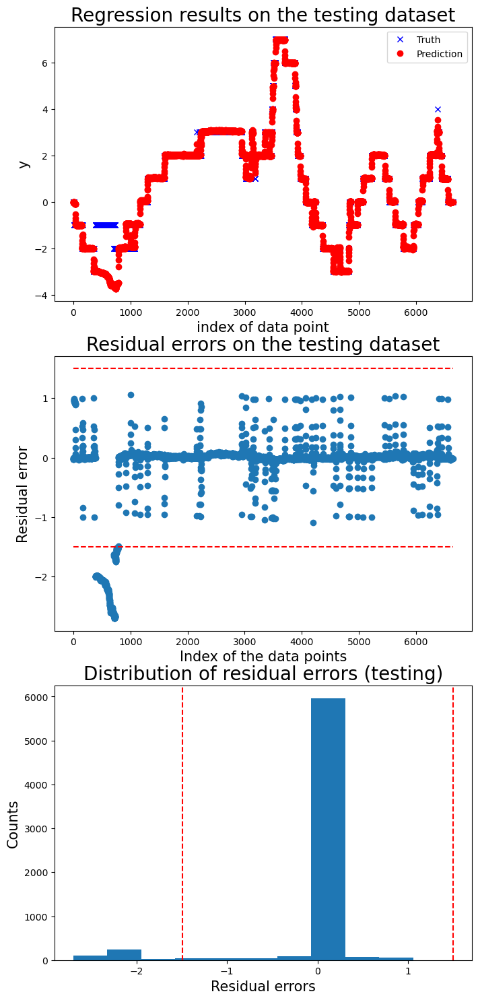

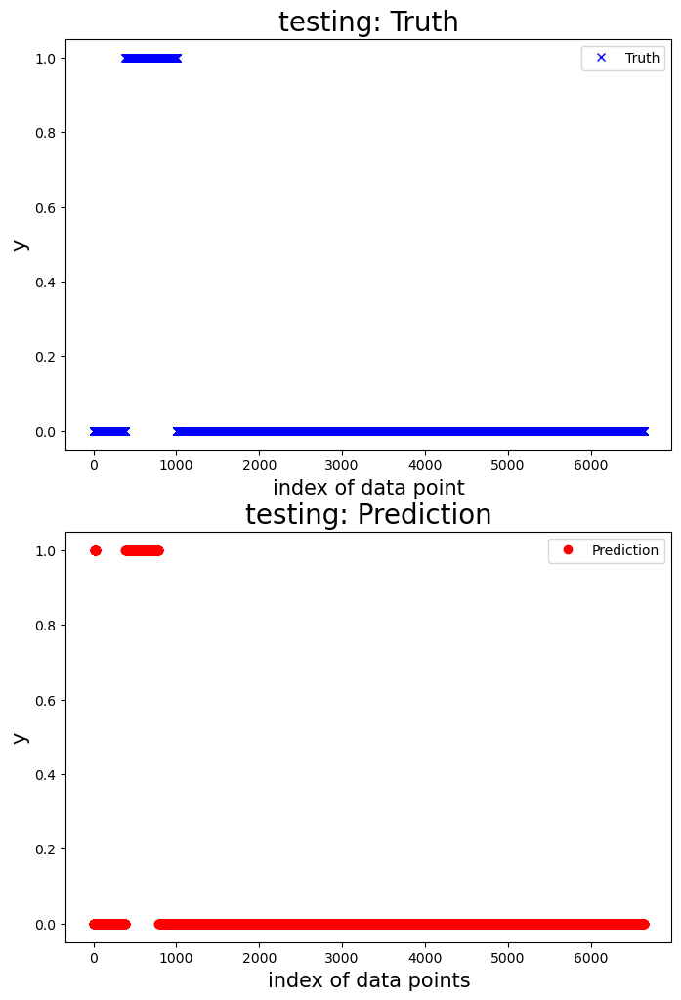

100%|██████████| 1/1 [00:00<00:00, 14.39it/s]



 New run:

testing performance, max error is: 3.9053297908316456
testing performance, mean root square error is: 1.5449701462054437
testing performance, residual error > 0.9: 42.792792792792795%

 New run:

testing performance, accuracy is: 0.8693693693693694
testing performance, precision is: 0.7789473684210526
testing performance, recall: 0.9024390243902439
testing performance, F1: 0.8361581920903954




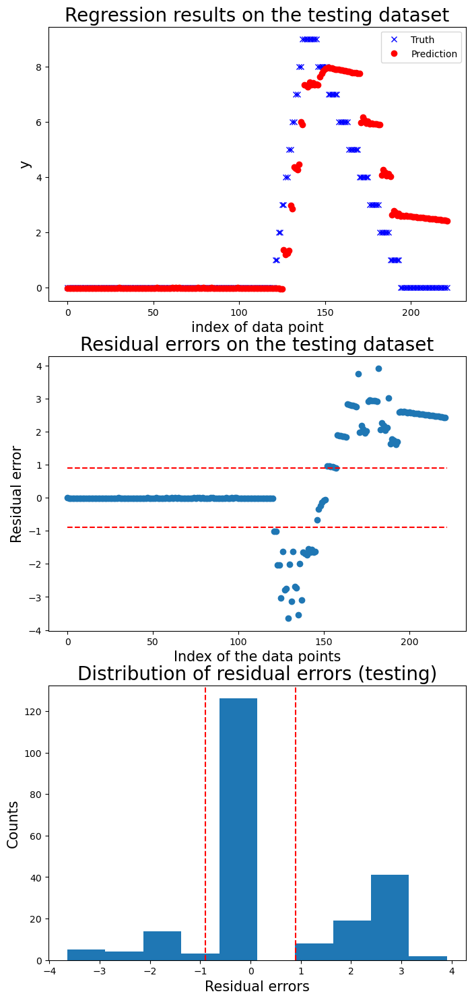

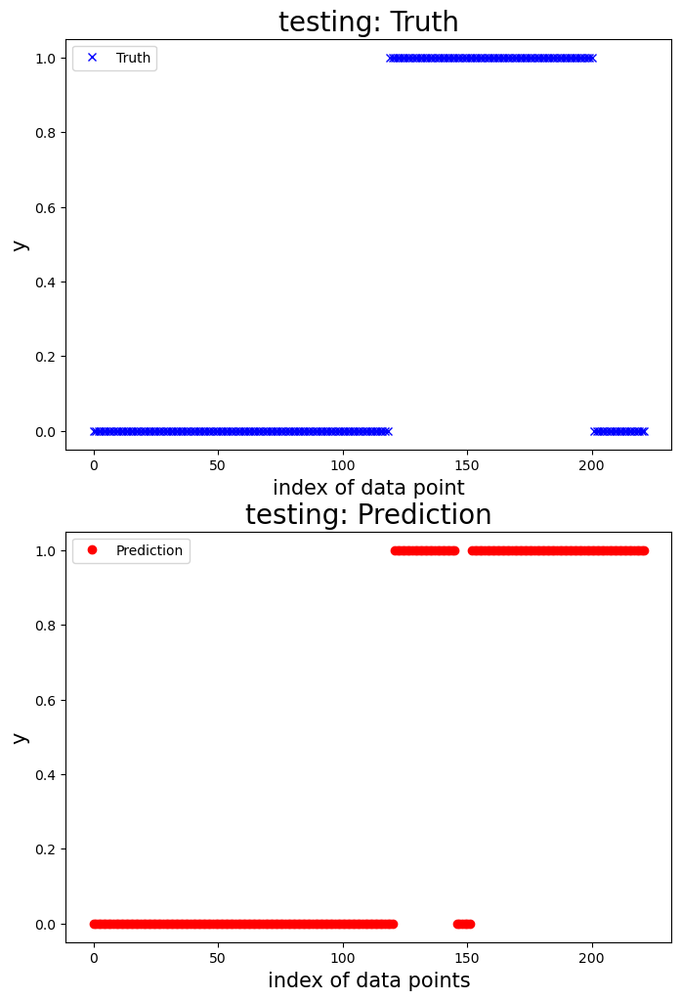

100%|██████████| 1/1 [00:00<00:00,  6.03it/s]



 New run:

testing performance, max error is: 3.032328598405327
testing performance, mean root square error is: 0.5470881791963902
testing performance, residual error > 0.9: 19.419237749546276%

 New run:

testing performance, accuracy is: 0.8838475499092558
testing performance, precision is: 0.8037383177570093
testing performance, recall: 0.6666666666666666
testing performance, F1: 0.7288135593220338




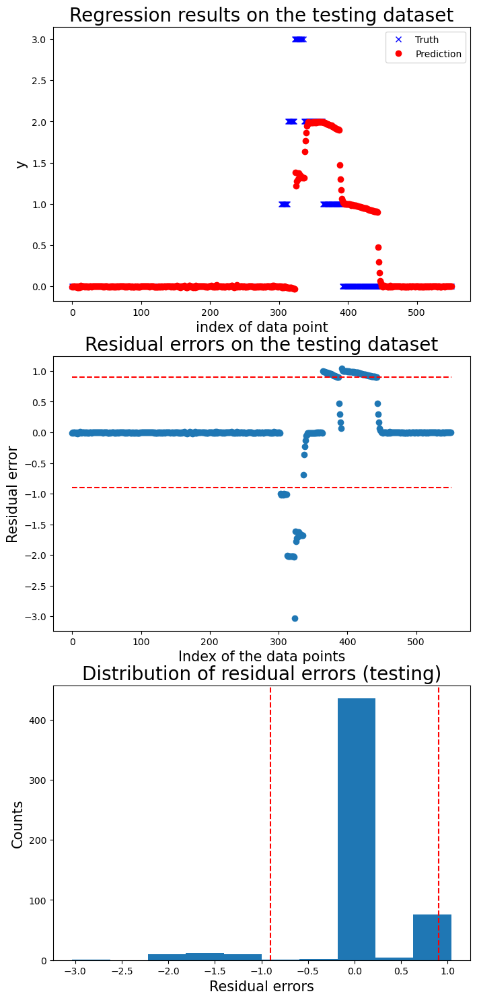

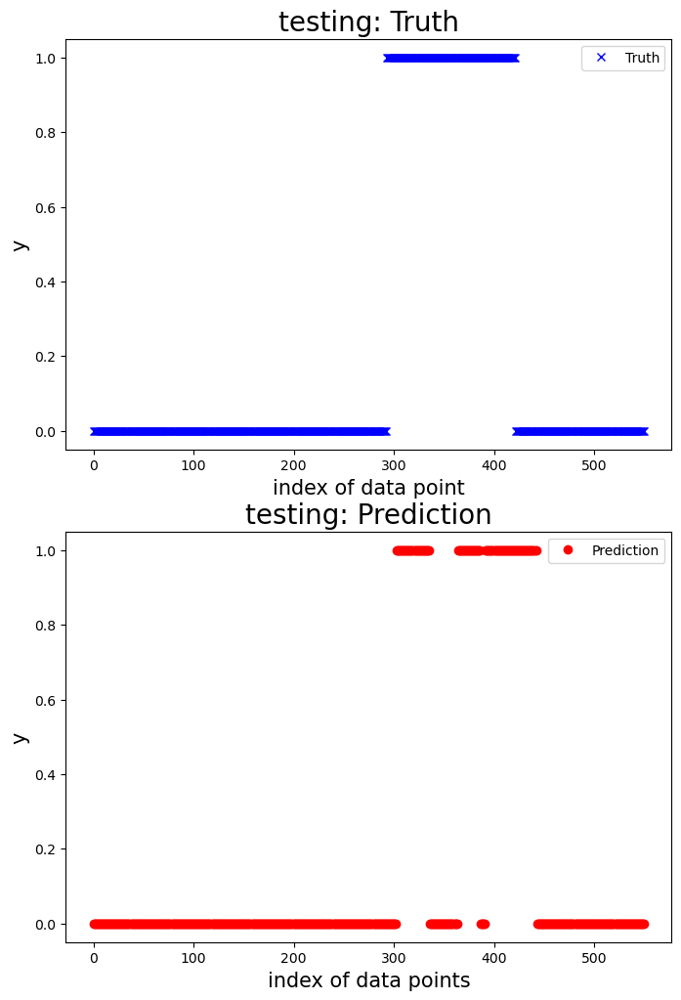

100%|██████████| 1/1 [00:00<00:00,  3.08it/s]



 New run:

testing performance, max error is: 2.039224627693247
testing performance, mean root square error is: 0.24123215366432077
testing performance, residual error > 0.9: 3.3816425120772946%

 New run:

testing performance, accuracy is: 0.9729468599033816
testing performance, precision is: 1.0
testing performance, recall: 0.5555555555555556
testing performance, F1: 0.7142857142857143




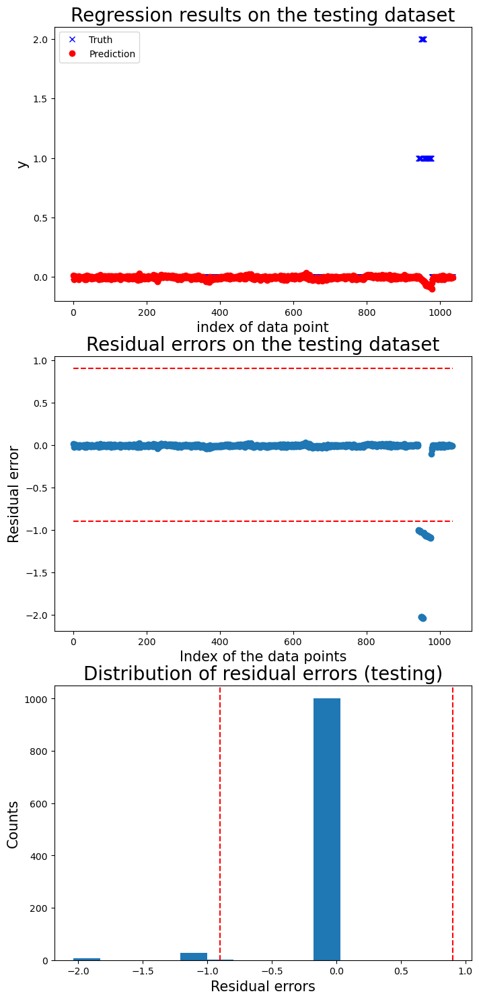

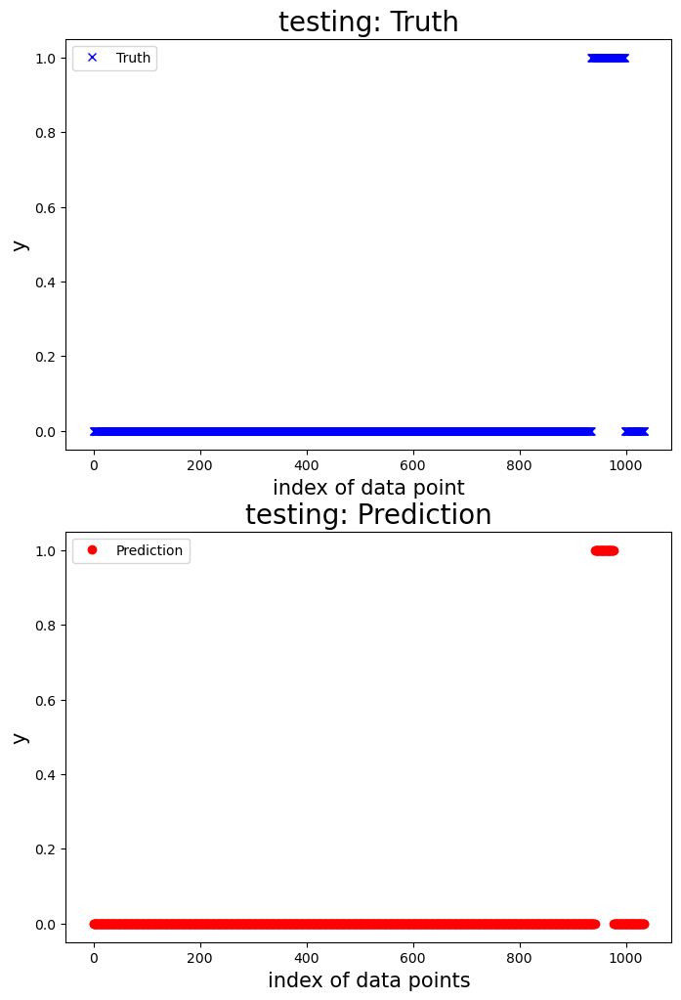

100%|██████████| 1/1 [00:00<00:00,  2.83it/s]



 New run:

testing performance, max error is: 3.964721673370696
testing performance, mean root square error is: 1.2247309840339684
testing performance, residual error > 0.9: 43.859649122807014%

 New run:

testing performance, accuracy is: 0.8061403508771929
testing performance, precision is: 0.626
testing performance, recall: 0.9020172910662824
testing performance, F1: 0.7390791027154664




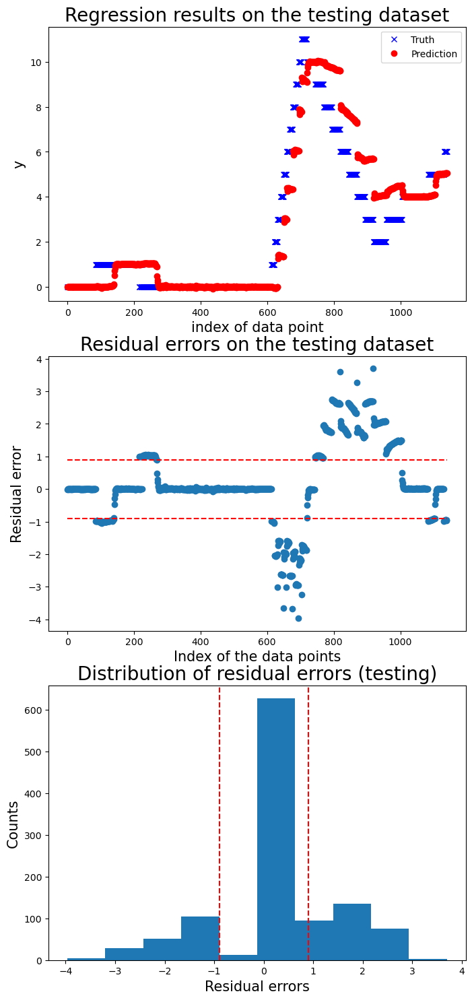

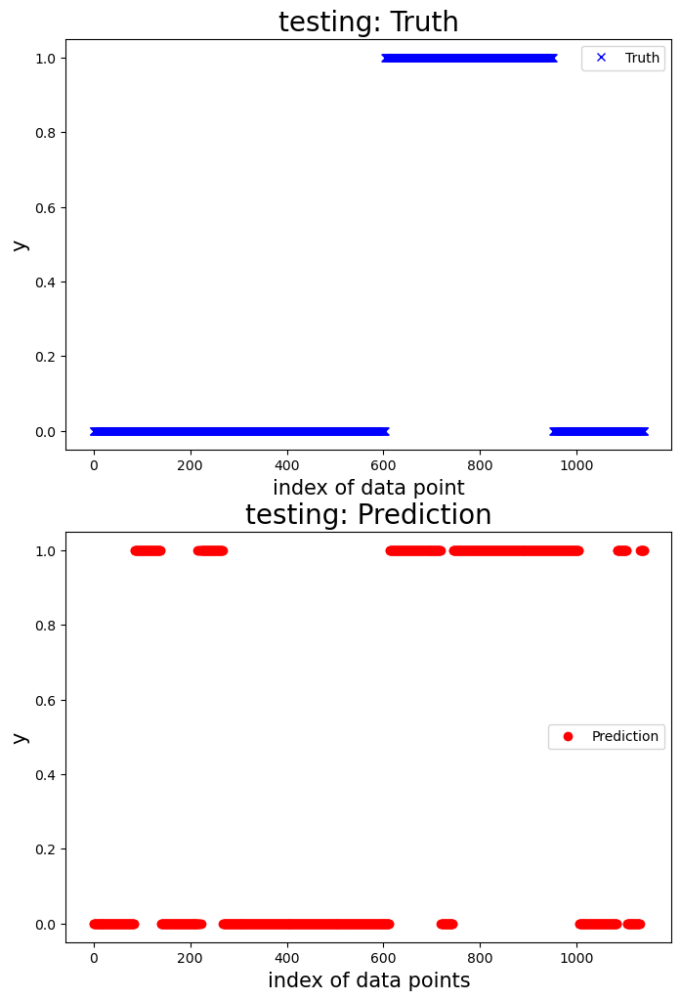

100%|██████████| 1/1 [00:00<00:00,  5.31it/s]



 New run:

testing performance, max error is: 3.988695590504797
testing performance, mean root square error is: 1.8337589561880299
testing performance, residual error > 0.9: 67.45762711864407%

 New run:

testing performance, accuracy is: 0.7966101694915254
testing performance, precision is: 0.9522613065326633
testing performance, recall: 0.7895833333333333
testing performance, F1: 0.8633257403189066




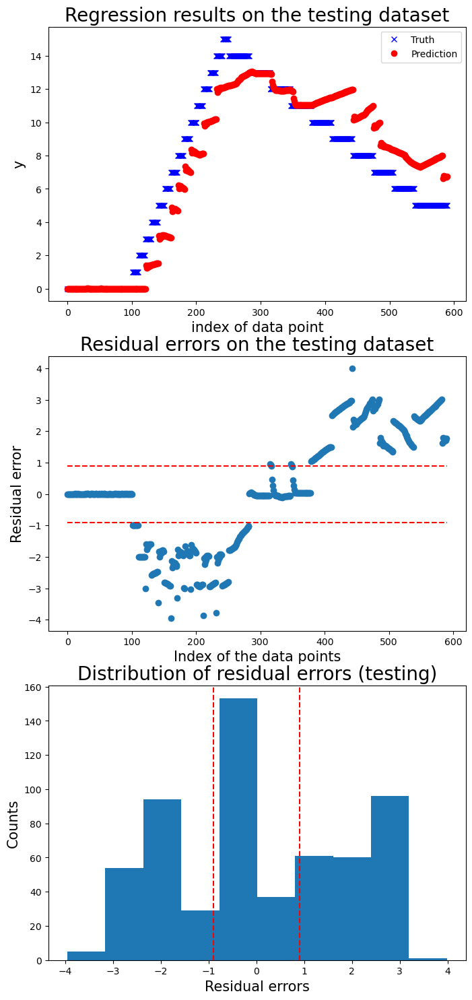

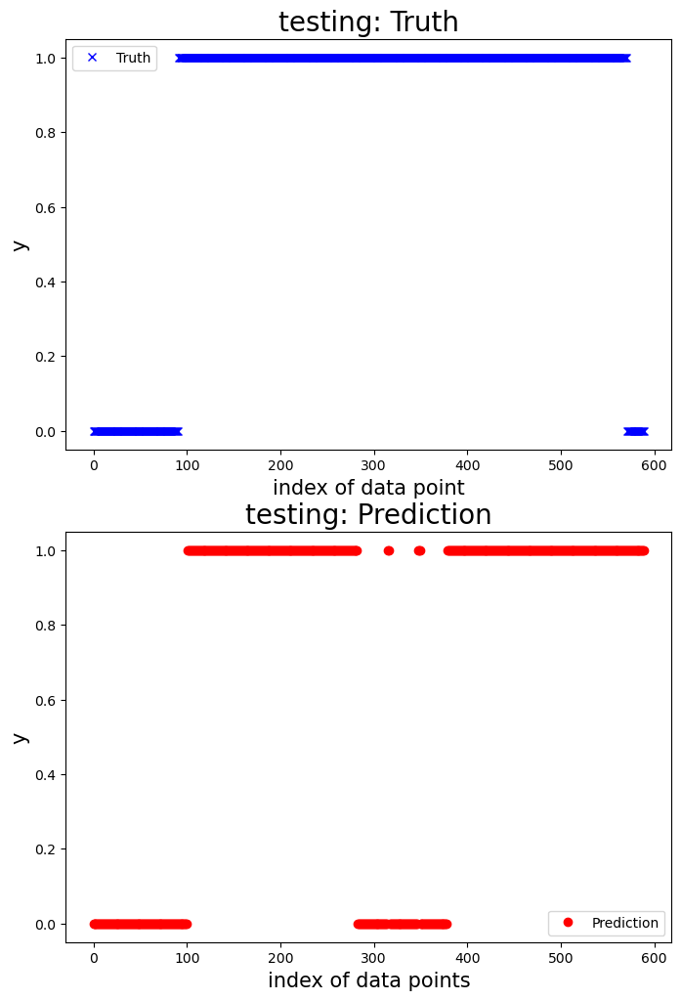

100%|██████████| 1/1 [00:00<00:00,  4.69it/s]



 New run:

testing performance, max error is: 2.967268776111877
testing performance, mean root square error is: 1.1767111896265854
testing performance, residual error > 1.4018126052786402: 19.140625%

 New run:

testing performance, accuracy is: 0.5234375
testing performance, precision is: 0.15
testing performance, recall: 0.15566037735849056
testing performance, F1: 0.15277777777777776




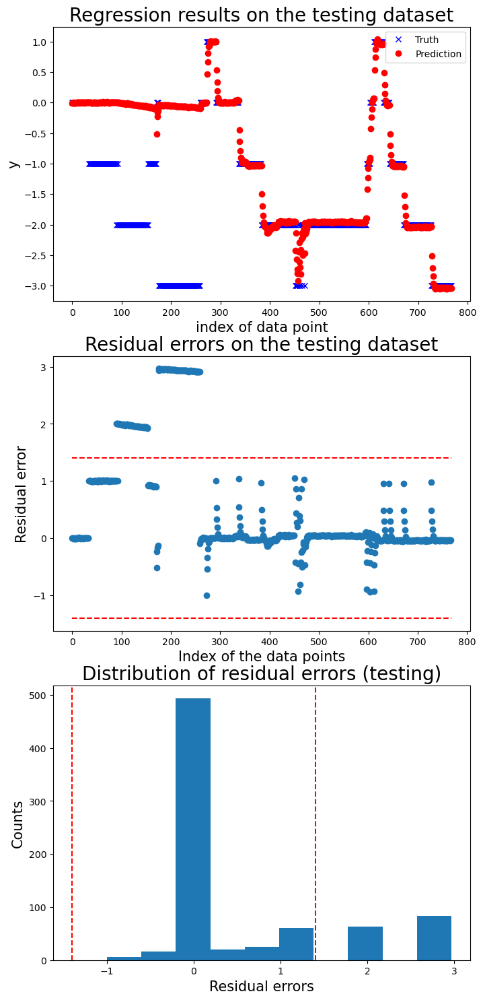

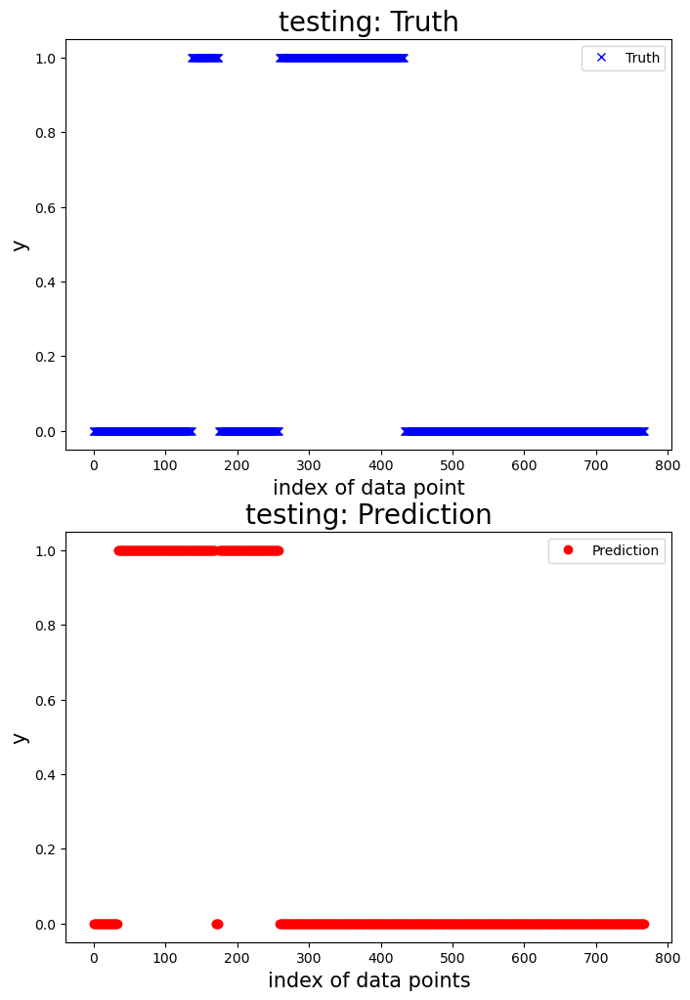

   Accuracy  Precision    Recall  F1 score
0  0.963721   0.945755  0.647819  0.768936
1  0.869369   0.778947  0.902439  0.836158
2  0.883848   0.803738  0.666667  0.728814
3  0.972947   1.000000  0.555556  0.714286
4  0.806140   0.626000  0.902017  0.739079
5  0.796610   0.952261  0.789583  0.863326
6  0.523438   0.150000  0.155660  0.152778


Mean performance metric and standard error:
Accuracy: 0.8309 +- 0.1519
Precision: 0.7510 +- 0.2946
Recall: 0.6600 +- 0.2581
F1 score: 0.6862 +- 0.2417




In [21]:
import numpy as np
import pandas as pd
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from utility import read_all_test_data_from_path, extract_selected_feature, prepare_sliding_window, FaultDetectReg


def remove_outliers(df: pd.DataFrame):
    ''' # Description
    Remove outliers from the dataframe based on defined valid ranges. 
    Define a valid range of temperature and voltage. 
    Use ffil function to replace the invalid measurement with the previous value.
    '''
    df['temperature'] = df['temperature'].where(df['temperature'] <= 100, np.nan)
    df['temperature'] = df['temperature'].where(df['temperature'] >= 0, np.nan)
    df['temperature'] = df['temperature'].ffill()
    df['temperature'] = df['temperature'] - df['temperature'].iloc[0]

    df['voltage'] = df['voltage'].where(df['voltage'] >= 6000, np.nan)
    df['voltage'] = df['voltage'].where(df['voltage'] <= 9000, np.nan)
    df['voltage'] = df['voltage'].ffill()
    df['voltage'] = df['voltage'] - df['voltage'].iloc[0]

    df['position'] = df['position'].where(df['position'] >= 0, np.nan)
    df['position'] = df['position'].where(df['position'] <= 1000, np.nan)
    df['position'] = df['position'].ffill()
    df['position'] = df['position'] - df['position'].iloc[0]


# Read data.
base_dictionary = '../../dataset/training_data/'
df_data = read_all_test_data_from_path(base_dictionary, remove_outliers, is_plot=False)

# Pre-train the model.
# Get all the normal data.
normal_test_id = ['20240105_164214', 
    '20240105_165300', 
    '20240105_165972', 
    '20240320_152031', 
    '20240320_153841', 
    '20240320_155664', 
    '20240321_122650', 
    '20240325_135213',
    '20240325_152902', 
    '20240426_141190', 
    '20240426_141532', 
    '20240426_141602', 
    '20240426_141726', 
    '20240426_141938', 
    '20240426_141980', 
    '20240503_164435']

df_tr = df_data[df_data['test_condition'].isin(normal_test_id)]

feature_list_all = ['data_motor_1_position', 'data_motor_1_temperature', 'data_motor_1_voltage',
                'data_motor_2_position', 'data_motor_2_temperature', 'data_motor_2_voltage',
                'data_motor_3_position', 'data_motor_3_temperature', 'data_motor_3_voltage',
                'data_motor_4_position', 'data_motor_4_temperature', 'data_motor_4_voltage',
                'data_motor_5_position', 'data_motor_5_temperature', 'data_motor_5_voltage',
                'data_motor_6_position', 'data_motor_6_temperature', 'data_motor_6_voltage']


# Prepare feature and response of the training dataset.
x_tr_org, y_temp_tr_org = extract_selected_feature(df_data=df_tr, feature_list=feature_list_all, motor_idx=6, mdl_type='reg')

# Enrich the features based on the sliding window.
window_size = 10
sample_step = 1
prediction_lead_time = 1 
threshold = .9
abnormal_limit = 3

x_tr, y_temp_tr = prepare_sliding_window(df_x=x_tr_org, y=y_temp_tr_org, window_size=window_size, sample_step=sample_step, prediction_lead_time=prediction_lead_time, mdl_type='reg')

# Define the steps of the pipeline
steps = [
    ('standardizer', StandardScaler()),  # Step 1: StandardScaler
    ('regressor', LinearRegression())    # Step 2: Linear Regression
]

# Create the pipeline
mdl_linear_regreession = Pipeline(steps)
# Fit the model
mdl = mdl_linear_regreession.fit(x_tr, y_temp_tr)

# Test data.
test_id = [
    '20240325_155003',
    '20240425_093699',
    '20240425_094425',
    '20240426_140055',
    '20240503_163963',
    '20240503_164675',
    '20240503_165189'
]
df_test = df_data[df_data['test_condition'].isin(test_id)]

# Define the fault detector.
detector_reg = FaultDetectReg(reg_mdl=mdl, threshold=threshold, abnormal_limit=abnormal_limit, window_size=window_size, sample_step=sample_step, pred_lead_time=prediction_lead_time)

# # Run cross validation
n_fold = 7
_, y_label_test_org = extract_selected_feature(df_data=df_test, feature_list=feature_list_all, motor_idx=6, mdl_type='clf')
x_test_org, y_temp_test_org = extract_selected_feature(df_data=df_test, feature_list=feature_list_all, motor_idx=6, mdl_type='reg')

motor_idx = 6
print(f'Model for motor {motor_idx}:')
# Run cross validation.
df_perf = detector_reg.run_cross_val(df_x=x_test_org, y_label=y_label_test_org, y_response=y_temp_test_org, 
                                        n_fold=n_fold)
print(df_perf)
print('\n')
# Print the mean performance and standard error.
print('Mean performance metric and standard error:')
for name, metric, error in zip(df_perf.columns, df_perf.mean(), df_perf.std()):
    print(f'{name}: {metric:.4f} +- {error:.4f}') 
print('\n')


Model for motor 6:


100%|██████████| 1/1 [00:02<00:00,  2.84s/it]



 New run:

testing performance, max error is: 2.698146215715863
testing performance, mean root square error is: 0.5500023880132234
testing performance, residual error > 1.4952410223515307: 6.036429324100557%

 New run:

testing performance, accuracy is: 0.9637212102965528
testing performance, precision is: 0.9457547169811321
testing performance, recall: 0.6478190630048465
testing performance, F1: 0.7689357622243529




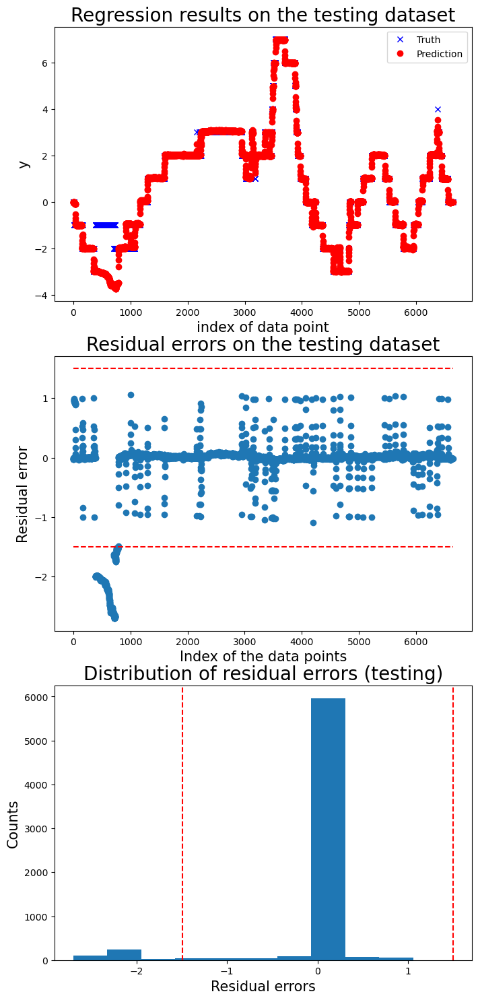

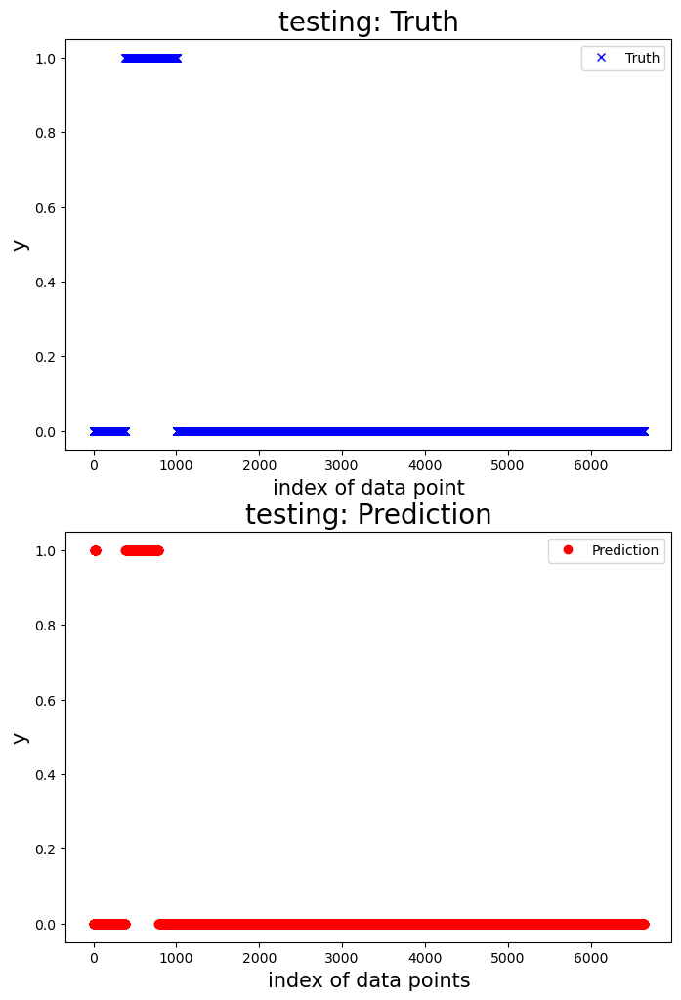

100%|██████████| 1/1 [00:00<00:00, 14.22it/s]



 New run:

testing performance, max error is: 5.7261340216570265
testing performance, mean root square error is: 2.3722526401287616
testing performance, residual error > 0.9: 42.792792792792795%

 New run:

testing performance, accuracy is: 0.8693693693693694
testing performance, precision is: 0.7789473684210526
testing performance, recall: 0.9024390243902439
testing performance, F1: 0.8361581920903954




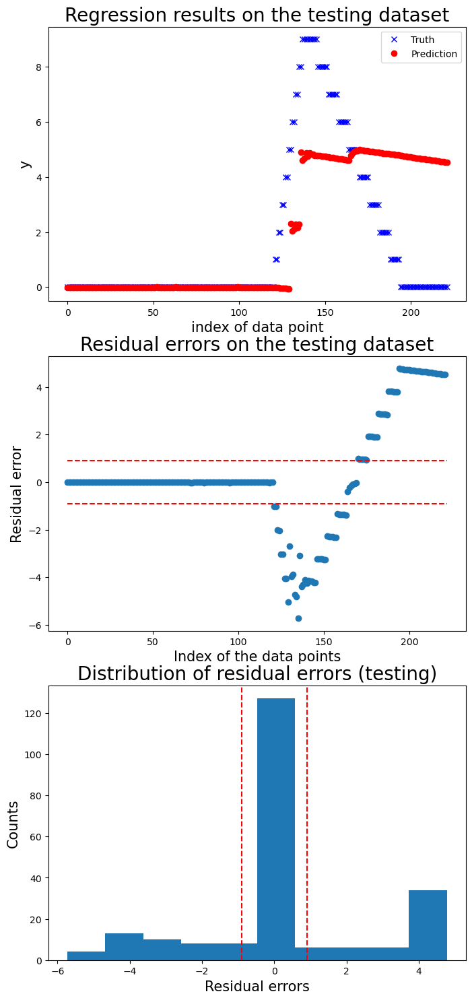

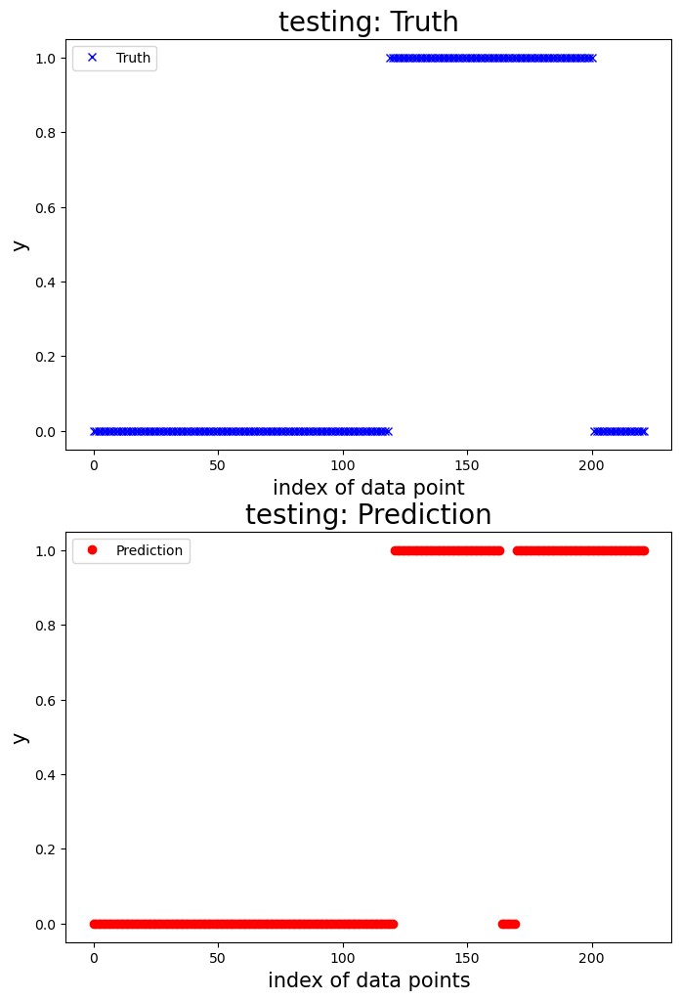

100%|██████████| 1/1 [00:00<00:00,  6.09it/s]



 New run:

testing performance, max error is: 3.065105373543002
testing performance, mean root square error is: 0.7748829508617847
testing performance, residual error > 0.9: 16.152450090744104%

 New run:

testing performance, accuracy is: 0.9274047186932849
testing performance, precision is: 1.0
testing performance, recall: 0.689922480620155
testing performance, F1: 0.81651376146789




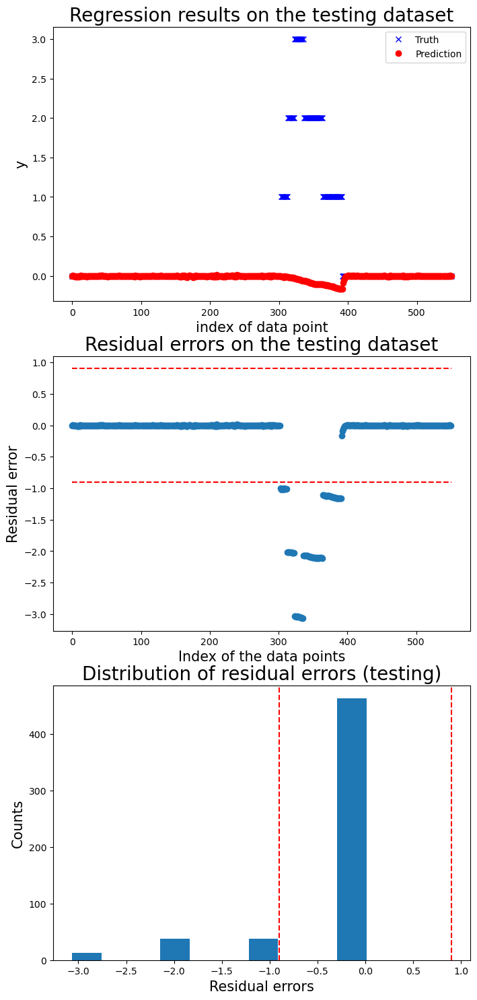

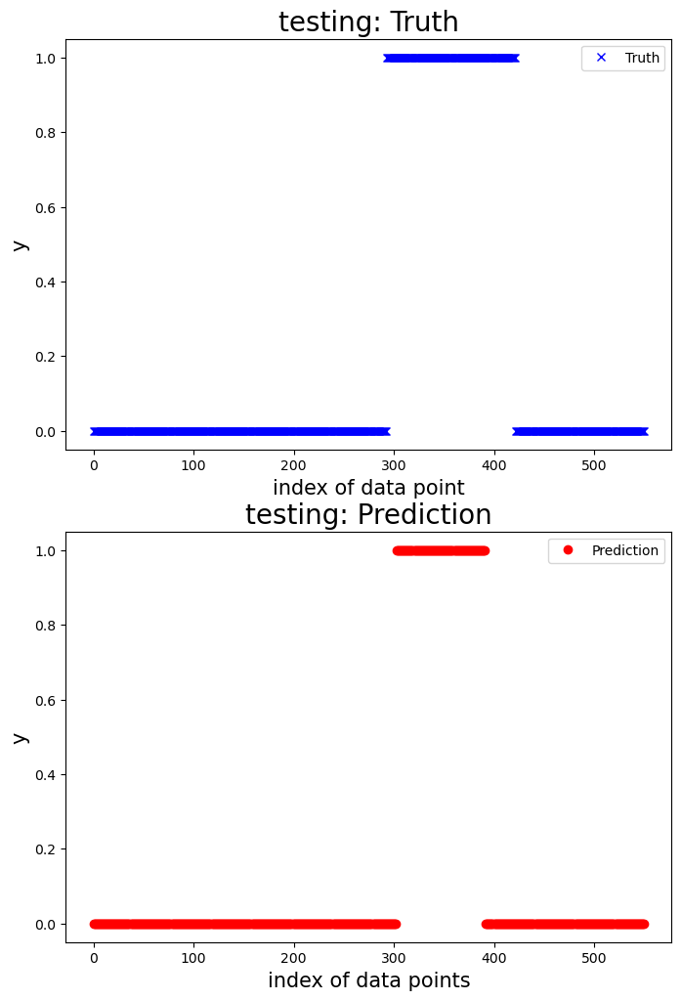

100%|██████████| 1/1 [00:00<00:00,  3.24it/s]



 New run:

testing performance, max error is: 2.039224627693247
testing performance, mean root square error is: 0.24123215366432077
testing performance, residual error > 0.9: 3.3816425120772946%

 New run:

testing performance, accuracy is: 0.9729468599033816
testing performance, precision is: 1.0
testing performance, recall: 0.5555555555555556
testing performance, F1: 0.7142857142857143




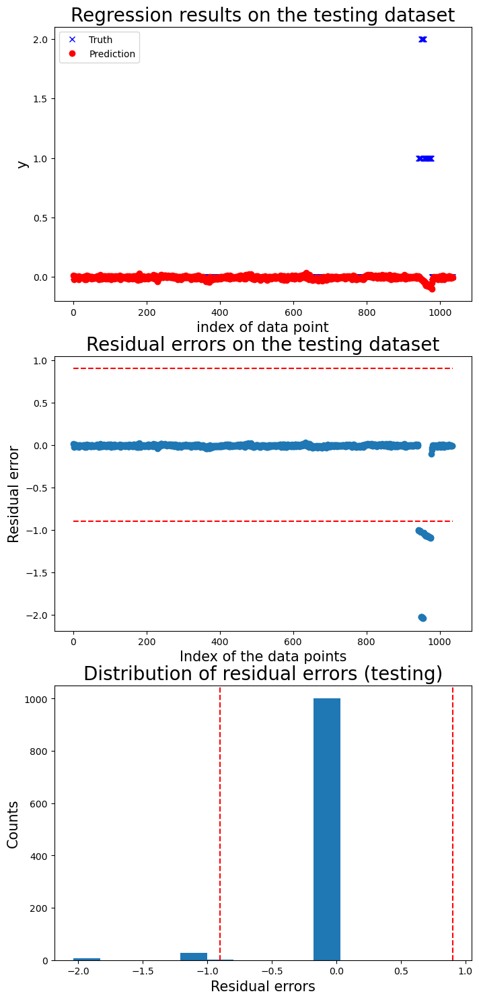

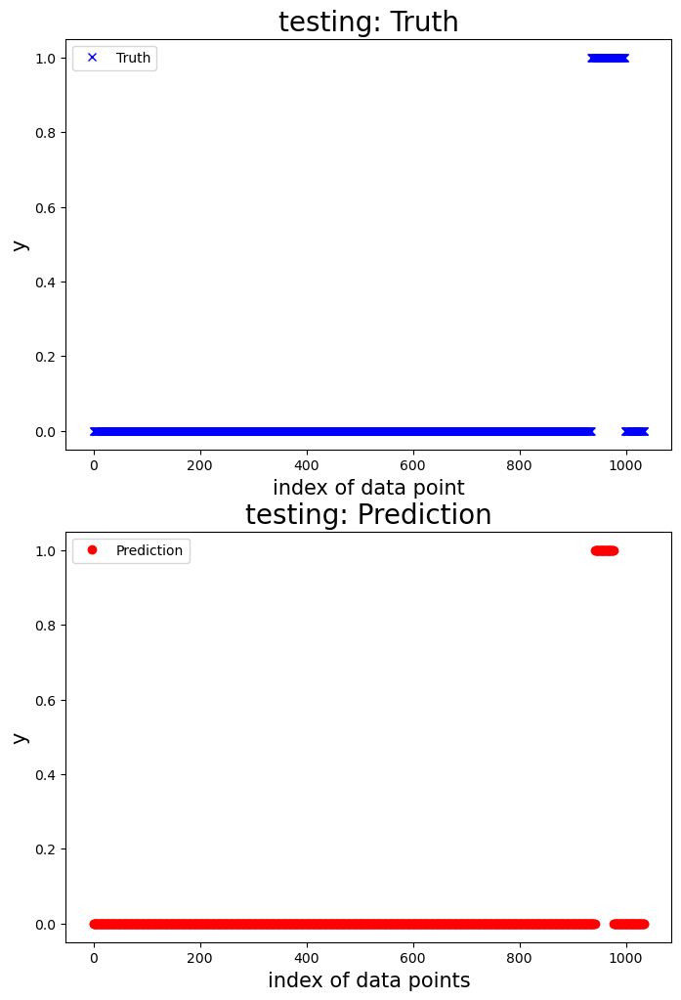

100%|██████████| 1/1 [00:00<00:00,  2.94it/s]



 New run:

testing performance, max error is: 5.753135271025576
testing performance, mean root square error is: 1.359731659454743
testing performance, residual error > 0.9: 40.26315789473684%

 New run:

testing performance, accuracy is: 0.7701754385964912
testing performance, precision is: 0.5925925925925926
testing performance, recall: 0.7838616714697406
testing performance, F1: 0.674937965260546




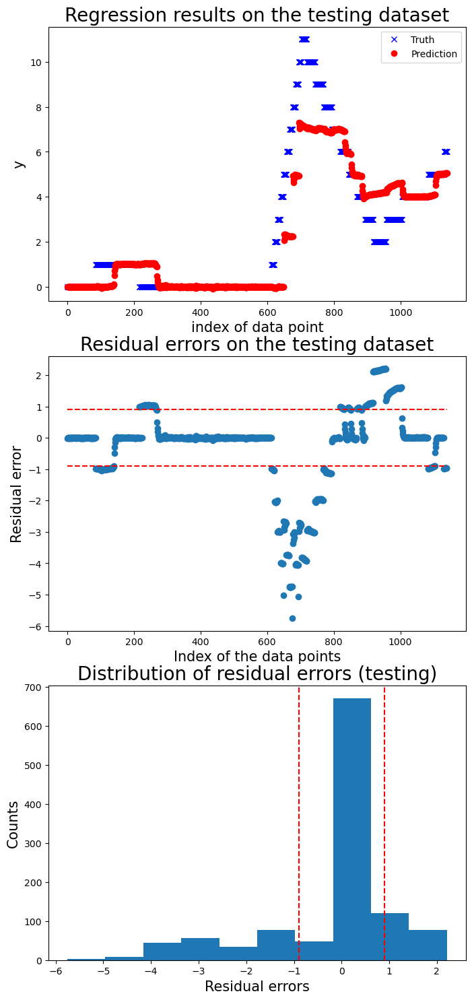

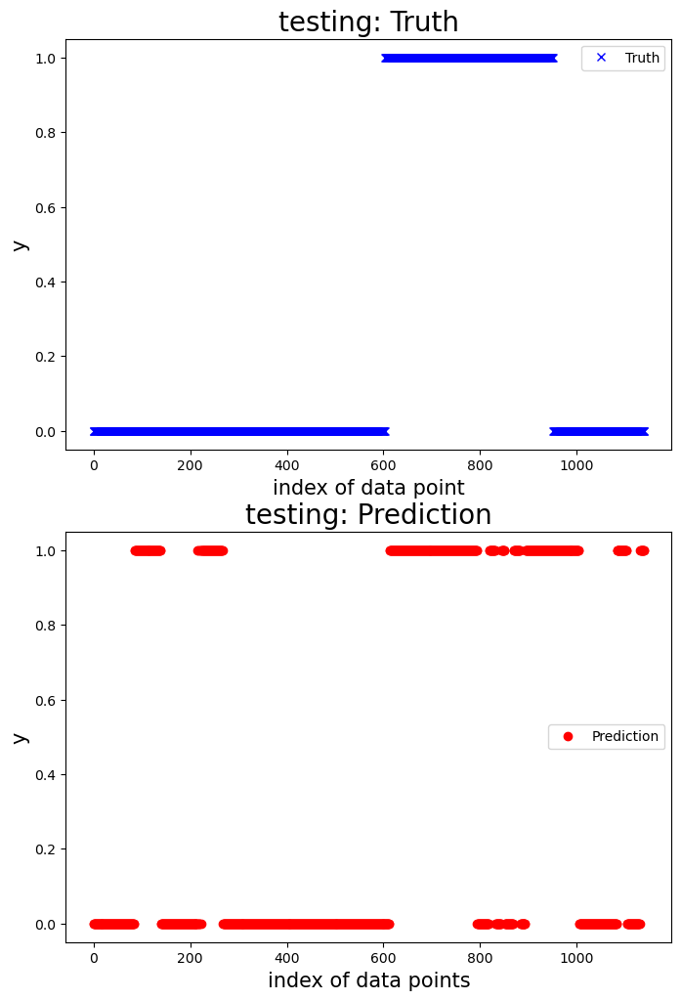

100%|██████████| 1/1 [00:00<00:00,  5.31it/s]



 New run:

testing performance, max error is: 5.837476608168334
testing performance, mean root square error is: 2.8335348846366446
testing performance, residual error > 0.9: 67.45762711864407%

 New run:

testing performance, accuracy is: 0.7966101694915254
testing performance, precision is: 0.9522613065326633
testing performance, recall: 0.7895833333333333
testing performance, F1: 0.8633257403189066




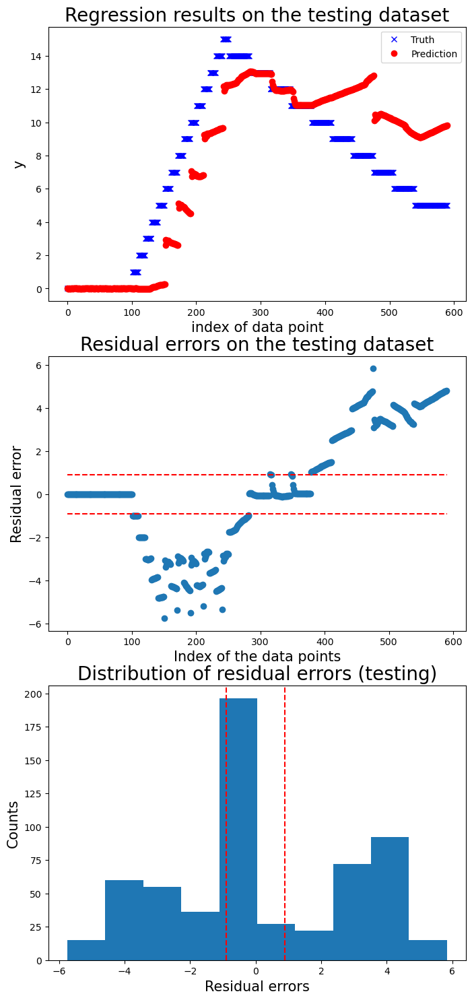

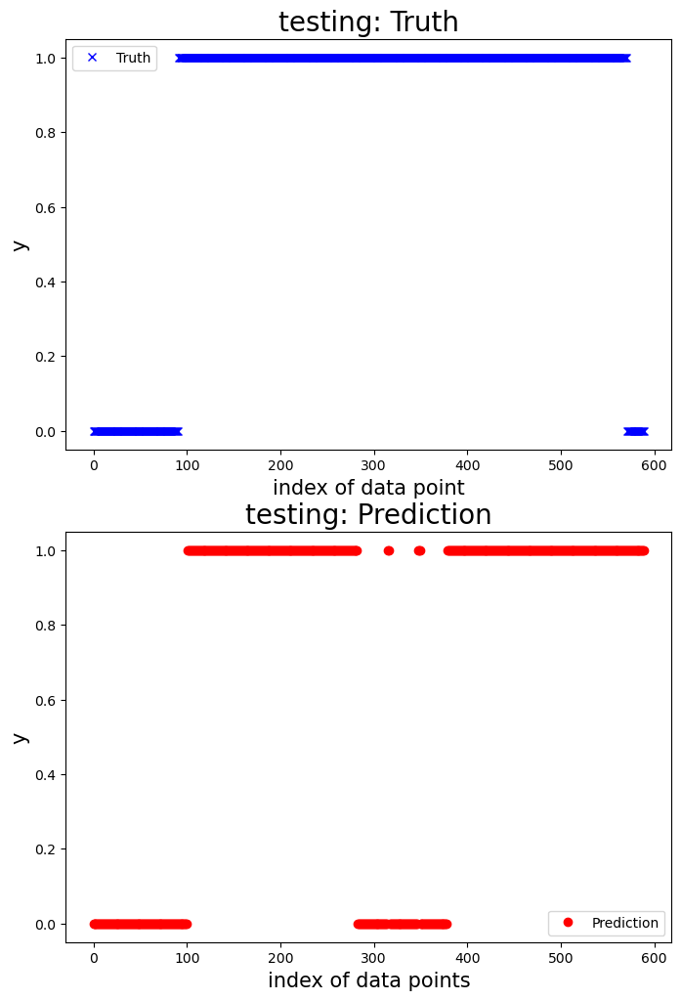

100%|██████████| 1/1 [00:00<00:00,  4.40it/s]



 New run:

testing performance, max error is: 2.967268776111877
testing performance, mean root square error is: 1.1767111896265854
testing performance, residual error > 1.4018126052786402: 19.140625%

 New run:

testing performance, accuracy is: 0.5234375
testing performance, precision is: 0.15
testing performance, recall: 0.15566037735849056
testing performance, F1: 0.15277777777777776




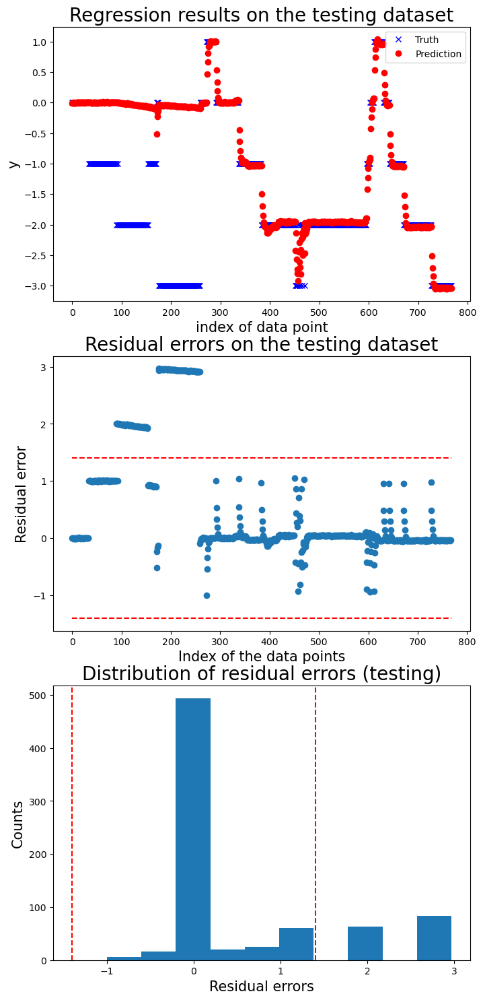

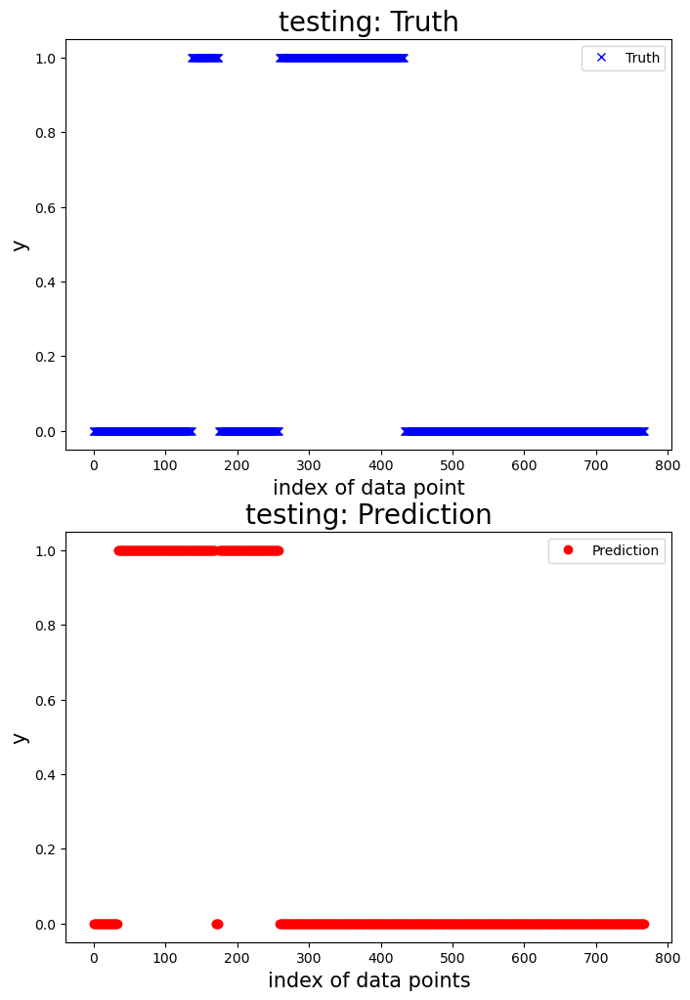

   Accuracy  Precision    Recall  F1 score
0  0.963721   0.945755  0.647819  0.768936
1  0.869369   0.778947  0.902439  0.836158
2  0.927405   1.000000  0.689922  0.816514
3  0.972947   1.000000  0.555556  0.714286
4  0.770175   0.592593  0.783862  0.674938
5  0.796610   0.952261  0.789583  0.863326
6  0.523438   0.150000  0.155660  0.152778


Mean performance metric and standard error:
Accuracy: 0.8320 +- 0.1571
Precision: 0.7742 +- 0.3124
Recall: 0.6464 +- 0.2436
F1 score: 0.6896 +- 0.2460




In [22]:
# Enrich the features based on the sliding window.
window_size = 10
sample_step = 1
prediction_lead_time = 1 
threshold = .9
abnormal_limit = 5

x_tr, y_temp_tr = prepare_sliding_window(df_x=x_tr_org, y=y_temp_tr_org, window_size=window_size, sample_step=sample_step, prediction_lead_time=prediction_lead_time, mdl_type='reg')

# Define the steps of the pipeline
steps = [
    ('standardizer', StandardScaler()),  # Step 1: StandardScaler
    ('regressor', LinearRegression())    # Step 2: Linear Regression
]

# Create the pipeline
mdl_linear_regreession = Pipeline(steps)
# Fit the model
mdl = mdl_linear_regreession.fit(x_tr, y_temp_tr)

# Test data.
test_id = [
    '20240325_155003',
    '20240425_093699',
    '20240425_094425',
    '20240426_140055',
    '20240503_163963',
    '20240503_164675',
    '20240503_165189'
]
df_test = df_data[df_data['test_condition'].isin(test_id)]

# Define the fault detector.
detector_reg = FaultDetectReg(reg_mdl=mdl, threshold=threshold, abnormal_limit=abnormal_limit, window_size=window_size, sample_step=sample_step, pred_lead_time=prediction_lead_time)

# # Run cross validation
n_fold = 7
_, y_label_test_org = extract_selected_feature(df_data=df_test, feature_list=feature_list_all, motor_idx=6, mdl_type='clf')
x_test_org, y_temp_test_org = extract_selected_feature(df_data=df_test, feature_list=feature_list_all, motor_idx=6, mdl_type='reg')

motor_idx = 6
print(f'Model for motor {motor_idx}:')
# Run cross validation.
df_perf = detector_reg.run_cross_val(df_x=x_test_org, y_label=y_label_test_org, y_response=y_temp_test_org, 
                                        n_fold=n_fold)
print(df_perf)
print('\n')
# Print the mean performance and standard error.
print('Mean performance metric and standard error:')
for name, metric, error in zip(df_perf.columns, df_perf.mean(), df_perf.std()):
    print(f'{name}: {metric:.4f} +- {error:.4f}') 
print('\n')


Model for motor 6:


100%|██████████| 1/1 [00:02<00:00,  2.61s/it]



 New run:

testing performance, max error is: 2.698146215715863
testing performance, mean root square error is: 0.5500023880132234
testing performance, residual error > 1.4952410223515307: 6.036429324100557%

 New run:

testing performance, accuracy is: 0.9637212102965528
testing performance, precision is: 0.9457547169811321
testing performance, recall: 0.6478190630048465
testing performance, F1: 0.7689357622243529




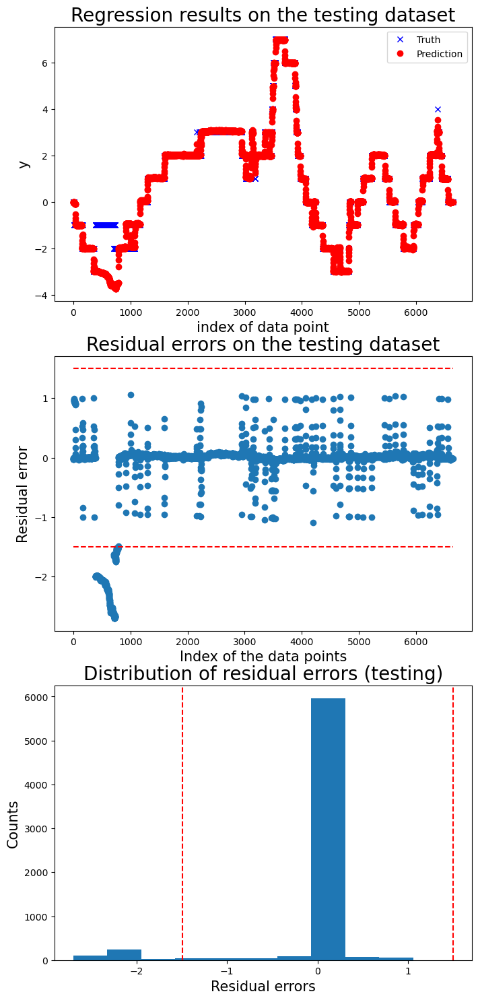

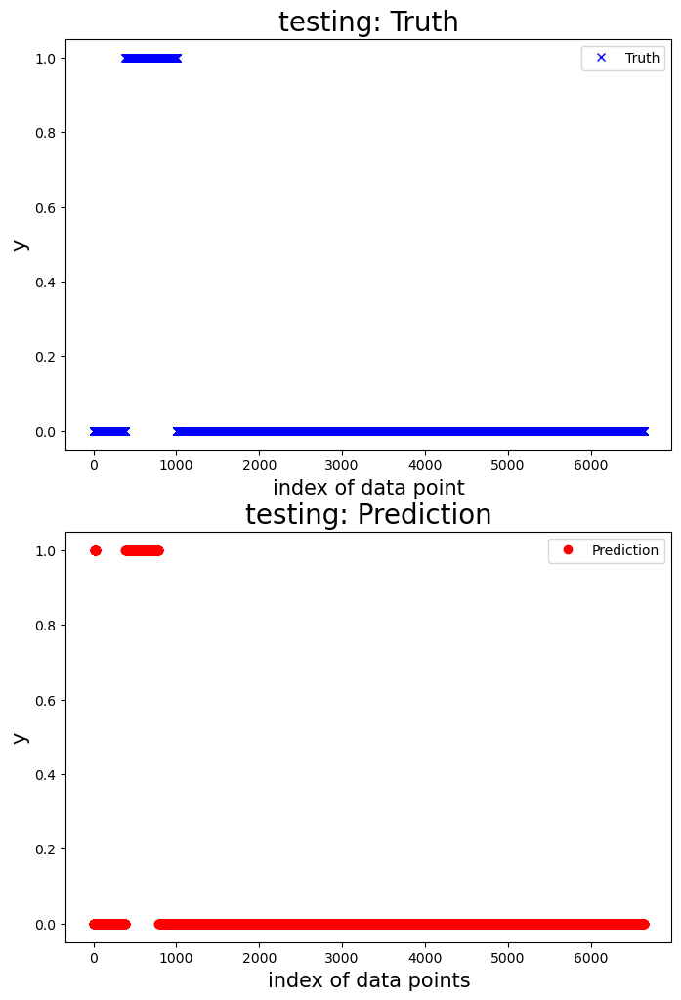

100%|██████████| 1/1 [00:00<00:00, 14.15it/s]



 New run:

testing performance, max error is: 9.125757473894284
testing performance, mean root square error is: 3.343782567803557
testing performance, residual error > 0.9: 32.88288288288289%

 New run:

testing performance, accuracy is: 0.9594594594594594
testing performance, precision is: 1.0
testing performance, recall: 0.8902439024390244
testing performance, F1: 0.9419354838709678




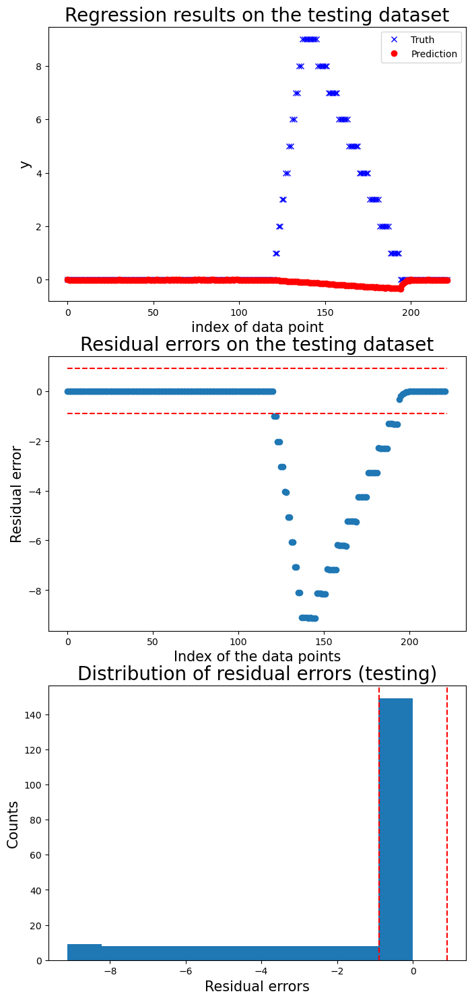

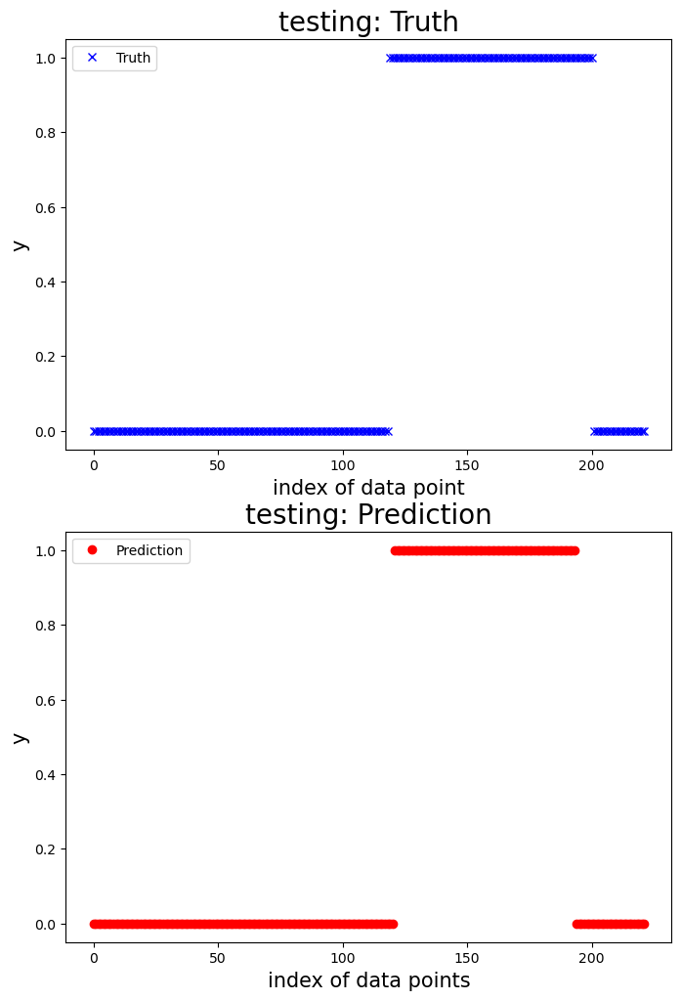

100%|██████████| 1/1 [00:00<00:00,  5.72it/s]



 New run:

testing performance, max error is: 3.065105373543002
testing performance, mean root square error is: 0.7748829508617847
testing performance, residual error > 0.9: 16.152450090744104%

 New run:

testing performance, accuracy is: 0.9274047186932849
testing performance, precision is: 1.0
testing performance, recall: 0.689922480620155
testing performance, F1: 0.81651376146789




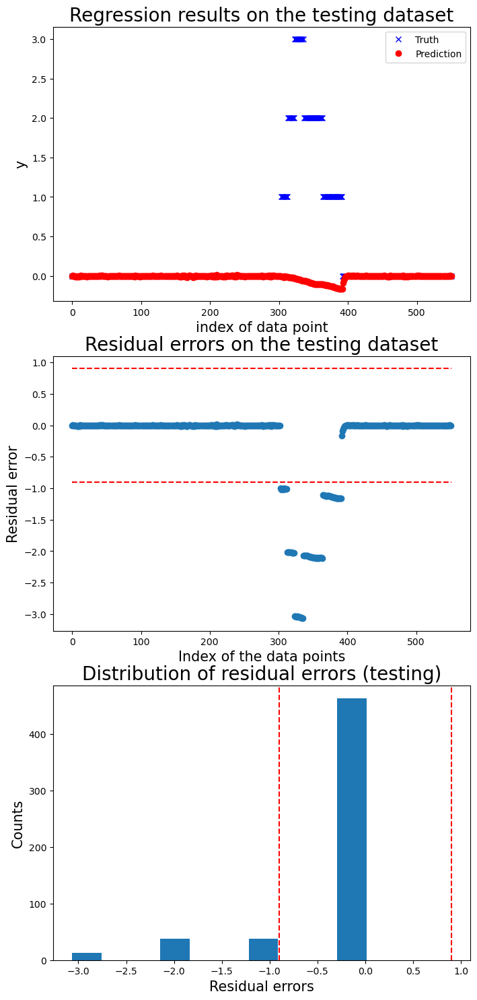

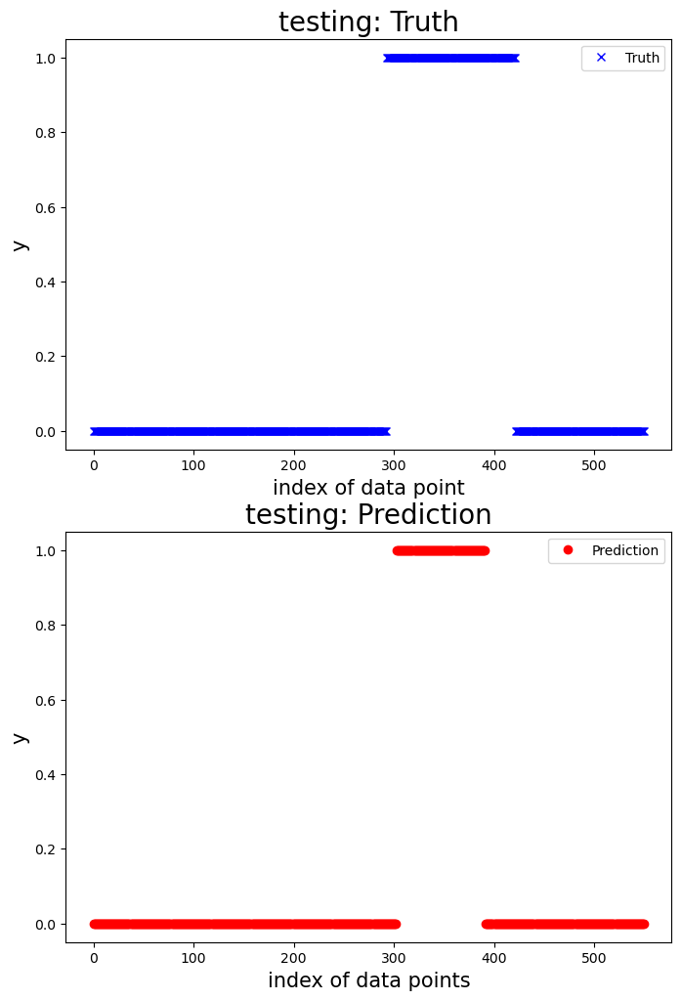

100%|██████████| 1/1 [00:00<00:00,  3.21it/s]



 New run:

testing performance, max error is: 2.039224627693247
testing performance, mean root square error is: 0.24123215366432077
testing performance, residual error > 0.9: 3.3816425120772946%

 New run:

testing performance, accuracy is: 0.9729468599033816
testing performance, precision is: 1.0
testing performance, recall: 0.5555555555555556
testing performance, F1: 0.7142857142857143




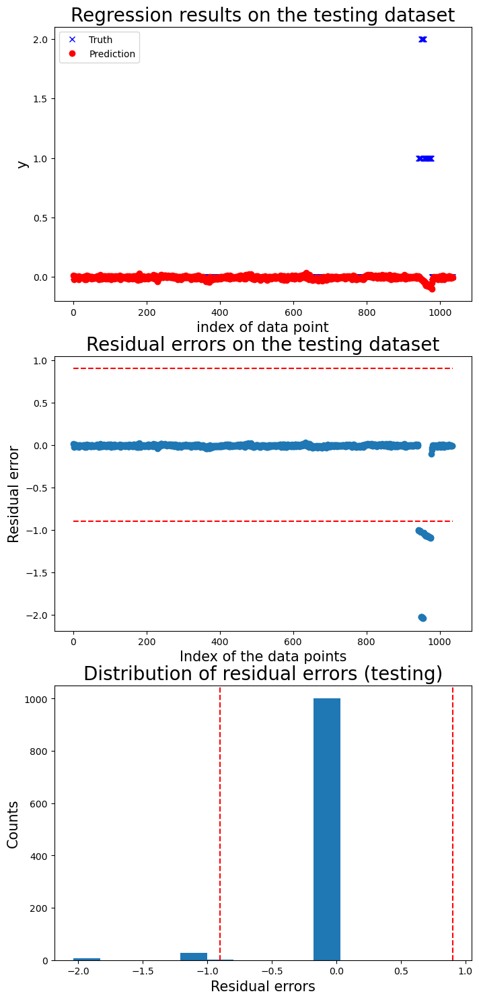

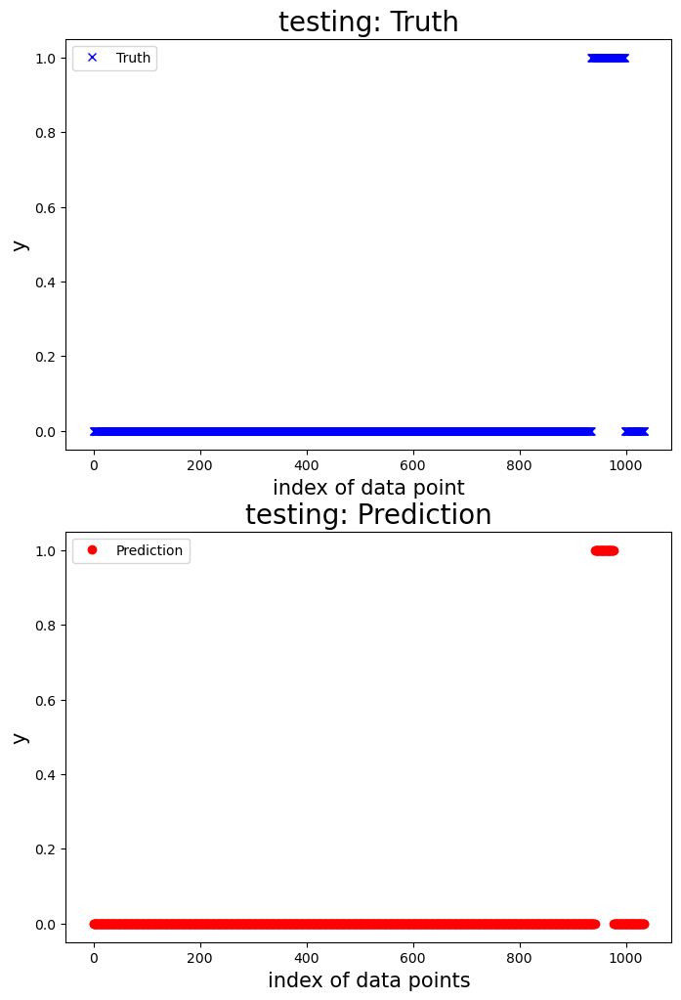

100%|██████████| 1/1 [00:00<00:00,  2.76it/s]



 New run:

testing performance, max error is: 10.91071713469283
testing performance, mean root square error is: 2.281729357165855
testing performance, residual error > 0.9: 42.89473684210526%

 New run:

testing performance, accuracy is: 0.7964912280701755
testing performance, precision is: 0.6175869120654397
testing performance, recall: 0.8703170028818443
testing performance, F1: 0.722488038277512




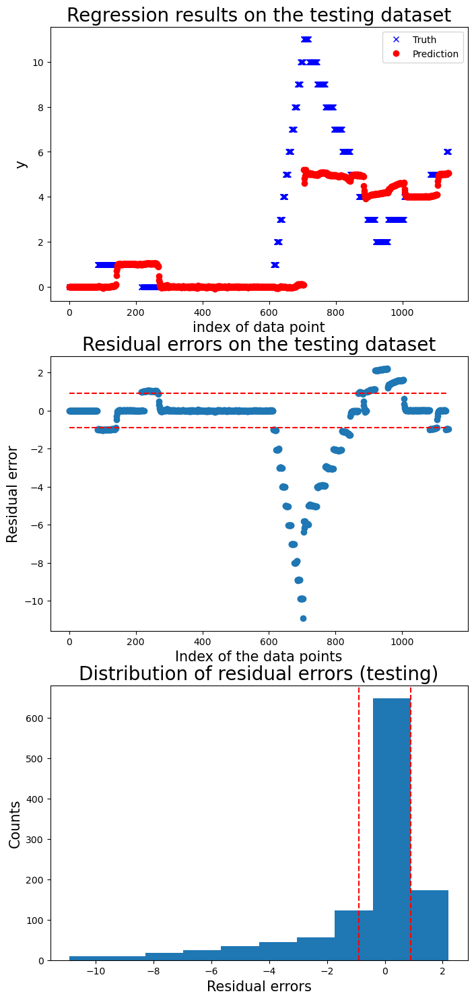

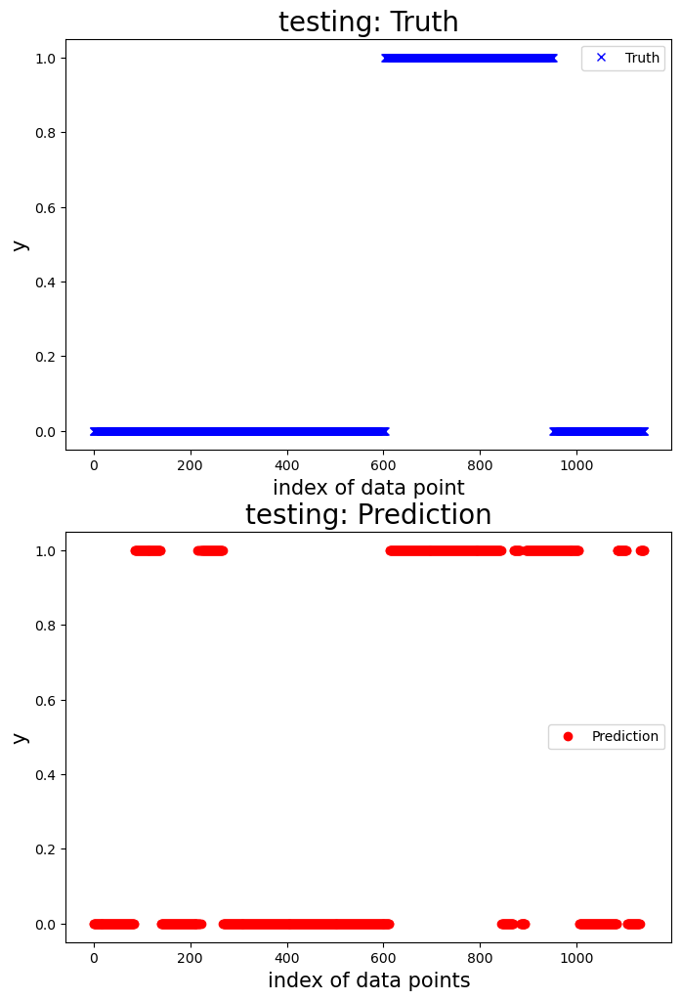

100%|██████████| 1/1 [00:00<00:00,  5.86it/s]



 New run:

testing performance, max error is: 10.489702818711097
testing performance, mean root square error is: 4.266272425324209
testing performance, residual error > 0.9: 77.45762711864407%

 New run:

testing performance, accuracy is: 0.8966101694915254
testing performance, precision is: 0.9584245076586433
testing performance, recall: 0.9125
testing performance, F1: 0.9348986125933831




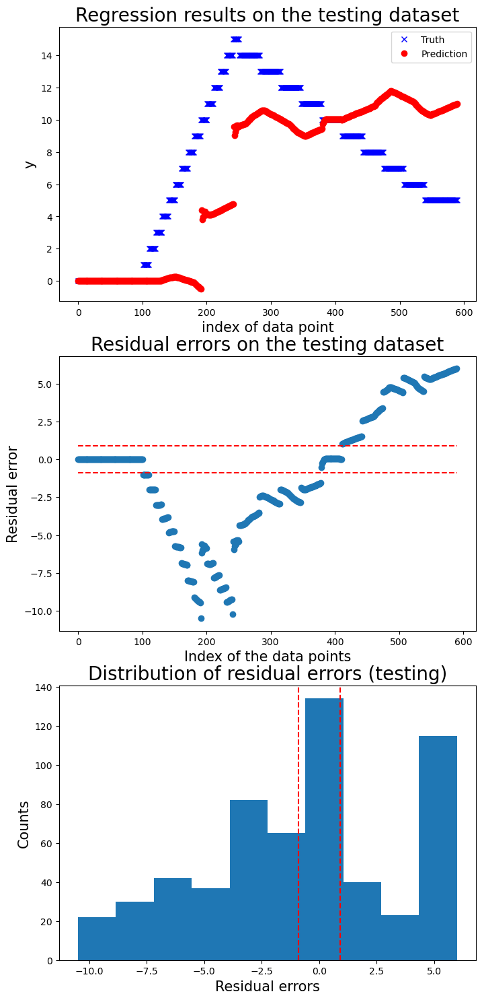

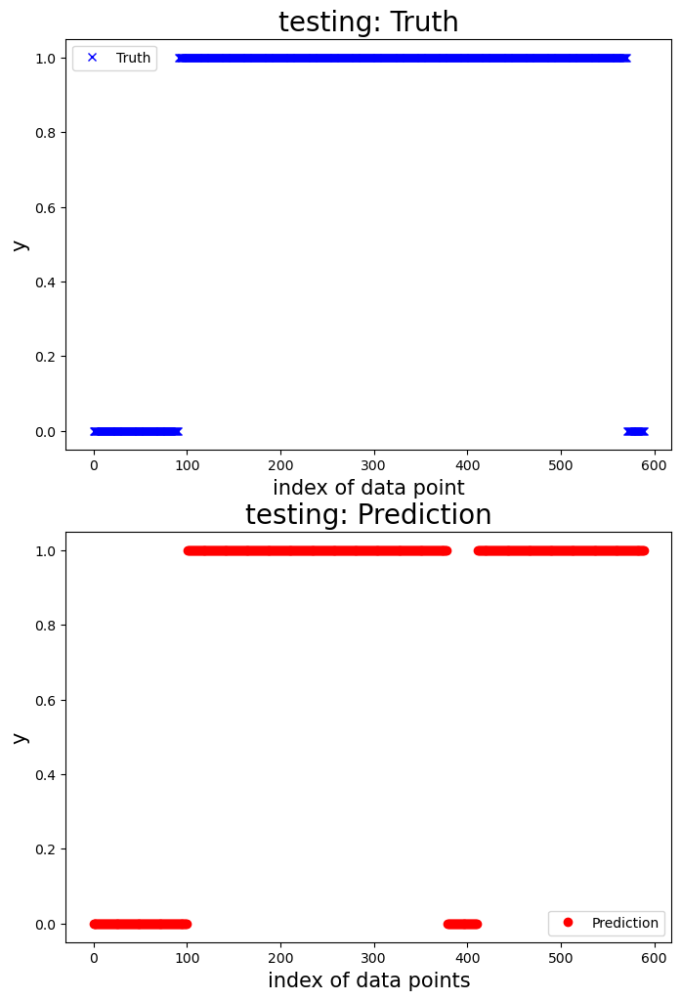

100%|██████████| 1/1 [00:00<00:00,  4.42it/s]



 New run:

testing performance, max error is: 2.967268776111877
testing performance, mean root square error is: 1.1767111896265854
testing performance, residual error > 1.4018126052786402: 19.140625%

 New run:

testing performance, accuracy is: 0.5234375
testing performance, precision is: 0.15
testing performance, recall: 0.15566037735849056
testing performance, F1: 0.15277777777777776




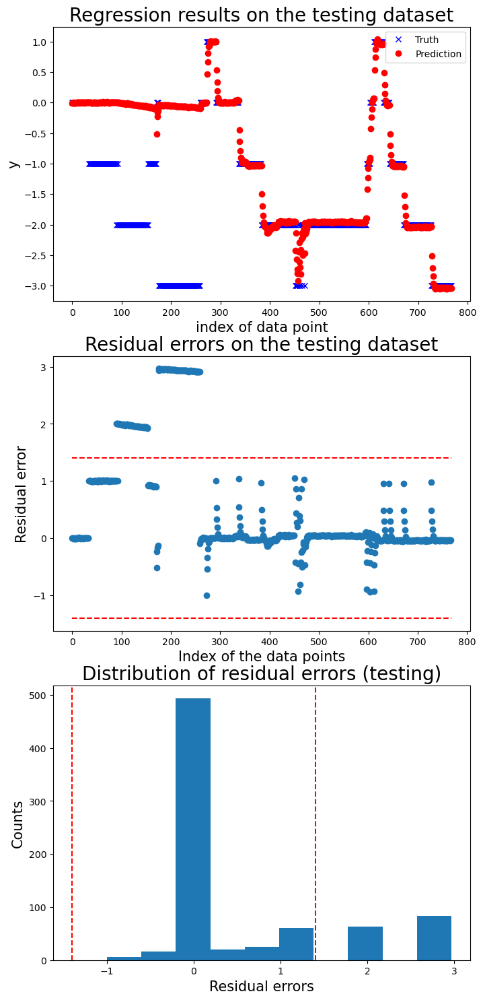

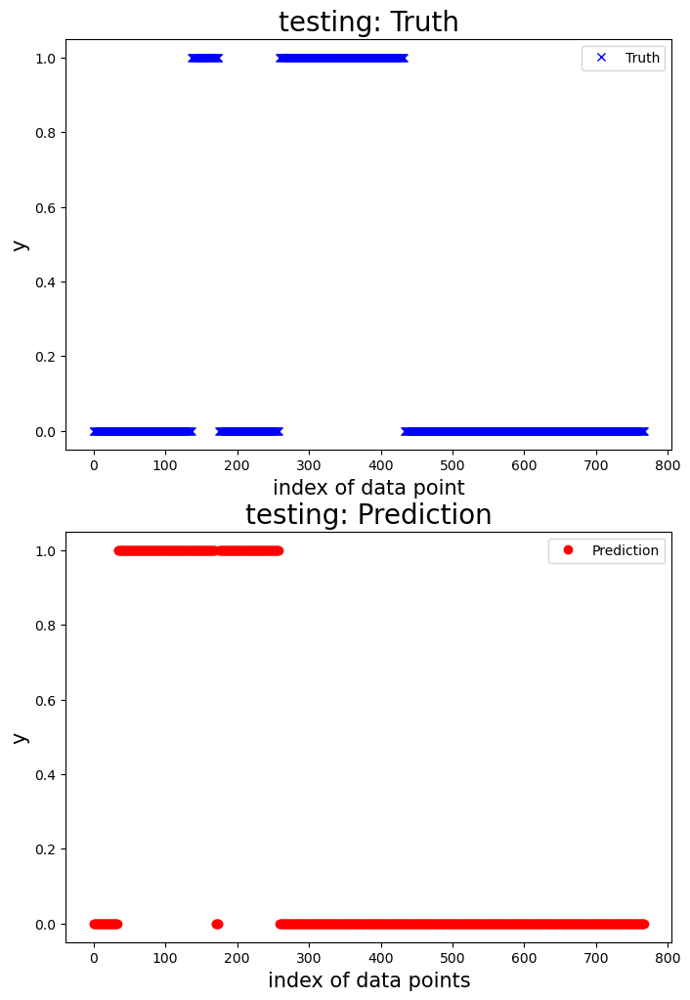

   Accuracy  Precision    Recall  F1 score
0  0.963721   0.945755  0.647819  0.768936
1  0.959459   1.000000  0.890244  0.941935
2  0.927405   1.000000  0.689922  0.816514
3  0.972947   1.000000  0.555556  0.714286
4  0.796491   0.617587  0.870317  0.722488
5  0.896610   0.958425  0.912500  0.934899
6  0.523438   0.150000  0.155660  0.152778


Mean performance metric and standard error:
Accuracy: 0.8629 +- 0.1615
Precision: 0.8103 +- 0.3218
Recall: 0.6746 +- 0.2664
F1 score: 0.7217 +- 0.2674




In [24]:
# Enrich the features based on the sliding window.
window_size = 10
sample_step = 1
prediction_lead_time = 1 
threshold = .9
abnormal_limit = 10

x_tr, y_temp_tr = prepare_sliding_window(df_x=x_tr_org, y=y_temp_tr_org, window_size=window_size, sample_step=sample_step, prediction_lead_time=prediction_lead_time, mdl_type='reg')

# Define the steps of the pipeline
steps = [
    ('standardizer', StandardScaler()),  # Step 1: StandardScaler
    ('regressor', LinearRegression())    # Step 2: Linear Regression
]

# Create the pipeline
mdl_linear_regreession = Pipeline(steps)
# Fit the model
mdl = mdl_linear_regreession.fit(x_tr, y_temp_tr)

# Test data.
test_id = [
    '20240325_155003',
    '20240425_093699',
    '20240425_094425',
    '20240426_140055',
    '20240503_163963',
    '20240503_164675',
    '20240503_165189'
]
df_test = df_data[df_data['test_condition'].isin(test_id)]

# Define the fault detector.
detector_reg = FaultDetectReg(reg_mdl=mdl, threshold=threshold, abnormal_limit=abnormal_limit, window_size=window_size, sample_step=sample_step, pred_lead_time=prediction_lead_time)

# # Run cross validation
n_fold = 7
_, y_label_test_org = extract_selected_feature(df_data=df_test, feature_list=feature_list_all, motor_idx=6, mdl_type='clf')
x_test_org, y_temp_test_org = extract_selected_feature(df_data=df_test, feature_list=feature_list_all, motor_idx=6, mdl_type='reg')

motor_idx = 6
print(f'Model for motor {motor_idx}:')
# Run cross validation.
df_perf = detector_reg.run_cross_val(df_x=x_test_org, y_label=y_label_test_org, y_response=y_temp_test_org, 
                                        n_fold=n_fold)
print(df_perf)
print('\n')
# Print the mean performance and standard error.
print('Mean performance metric and standard error:')
for name, metric, error in zip(df_perf.columns, df_perf.mean(), df_perf.std()):
    print(f'{name}: {metric:.4f} +- {error:.4f}') 
print('\n')


/Users/longzhou/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.937e+01, tolerance: 1.706e+01
  model = cd_fast.enet_coordinate_descent(


Model for motor 6:


100%|██████████| 1/1 [00:02<00:00,  2.54s/it]



 New run:

testing performance, max error is: 3.67949086140637
testing performance, mean root square error is: 0.9224243998331281
testing performance, residual error > 1.481283743411502: 16.49329112015679%

 New run:

testing performance, accuracy is: 0.9193426805367104
testing performance, precision is: 0.5363951473136915
testing performance, recall: 1.0
testing performance, F1: 0.6982515510434292




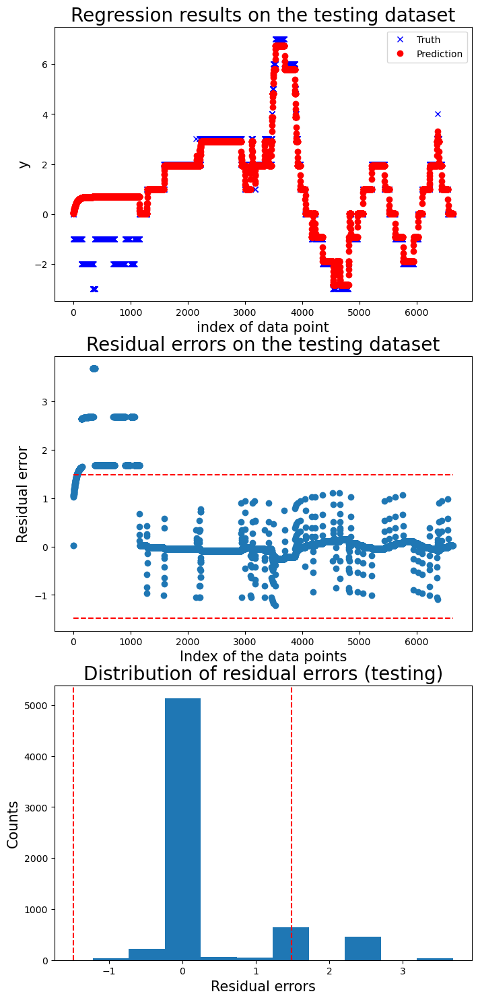

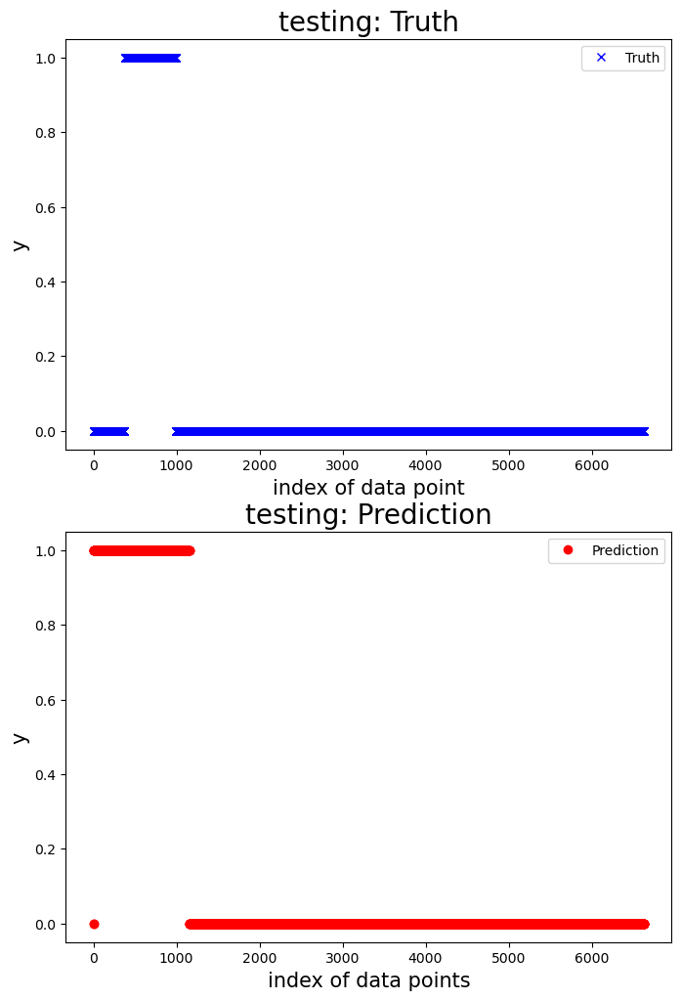

100%|██████████| 1/1 [00:00<00:00, 14.52it/s]



 New run:

testing performance, max error is: 5.856949918373356
testing performance, mean root square error is: 1.751516854414032
testing performance, residual error > 0.9826002878452887: 29.71698113207547%

 New run:

testing performance, accuracy is: 0.8349056603773585
testing performance, precision is: 0.7764705882352941
testing performance, recall: 0.8048780487804879
testing performance, F1: 0.7904191616766466




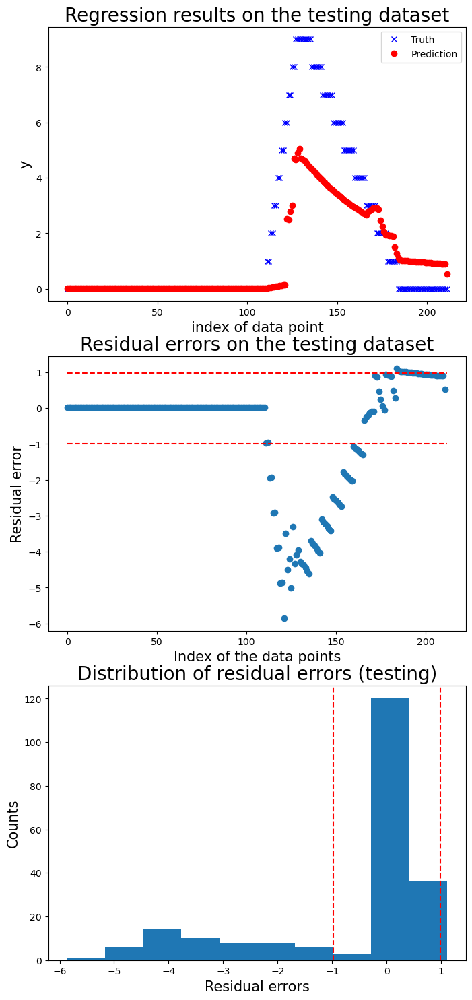

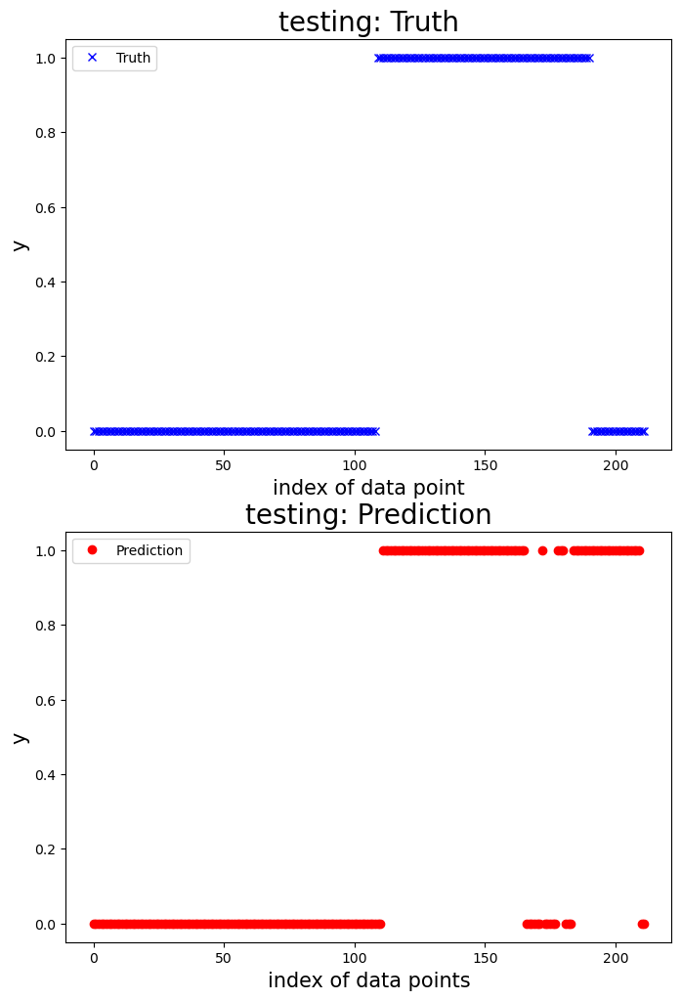

100%|██████████| 1/1 [00:00<00:00,  6.00it/s]



 New run:

testing performance, max error is: 2.157676571108355
testing performance, mean root square error is: 0.5005473152743425
testing performance, residual error > 0.9: 13.863216266173753%

 New run:

testing performance, accuracy is: 0.9001848428835489
testing performance, precision is: 1.0
testing performance, recall: 0.5813953488372093
testing performance, F1: 0.7352941176470588




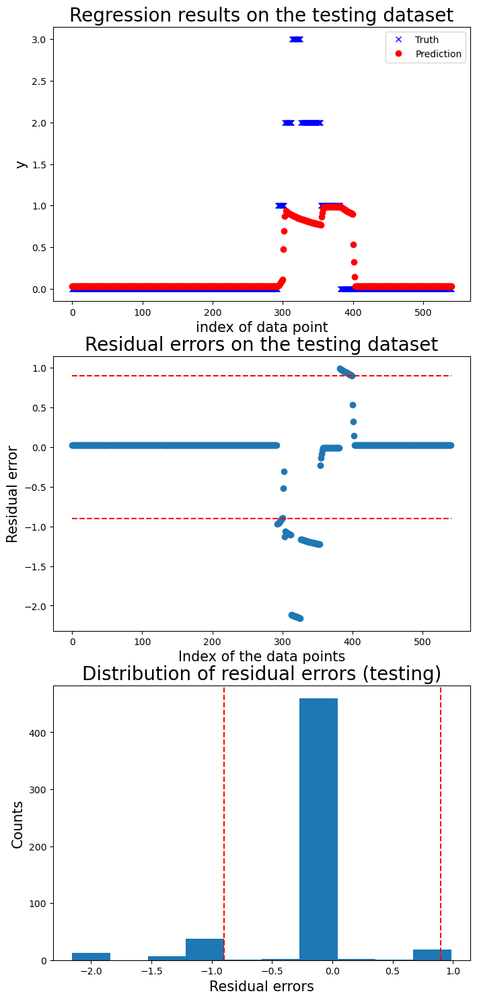

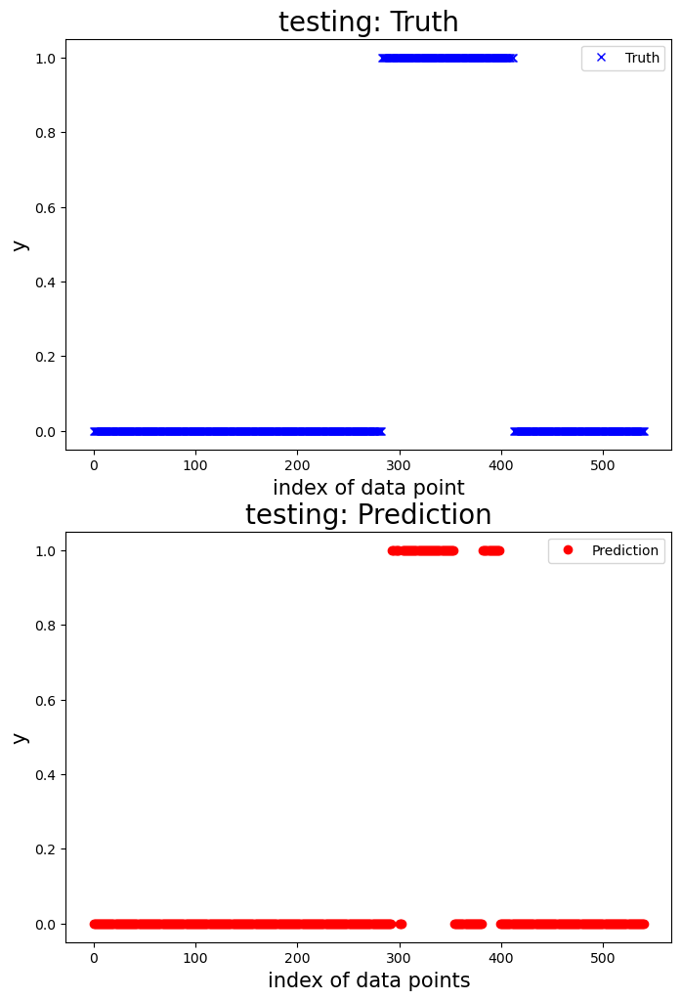

100%|██████████| 1/1 [00:00<00:00,  2.77it/s]



 New run:

testing performance, max error is: 1.8901710898743427
testing performance, mean root square error is: 0.21732632833878587
testing performance, residual error > 0.9: 3.024390243902439%

 New run:

testing performance, accuracy is: 0.968780487804878
testing performance, precision is: 1.0
testing performance, recall: 0.49206349206349204
testing performance, F1: 0.6595744680851063




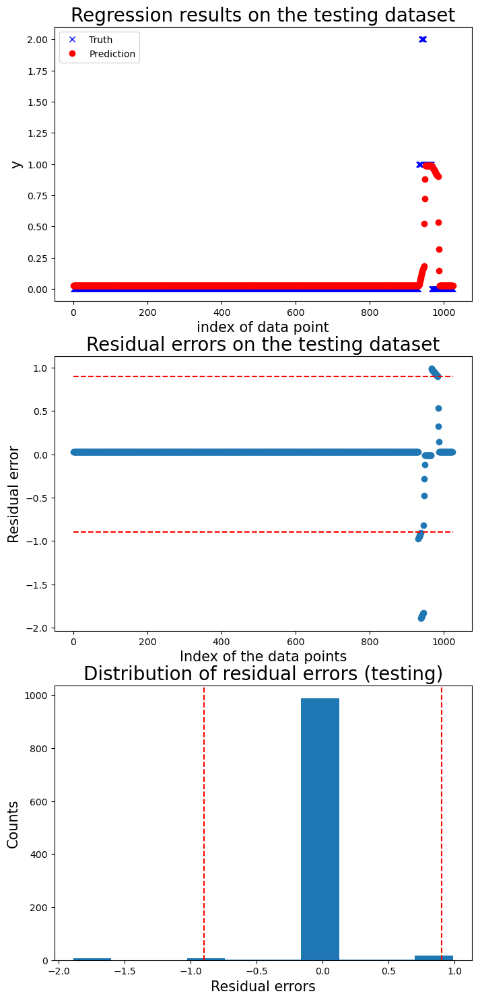

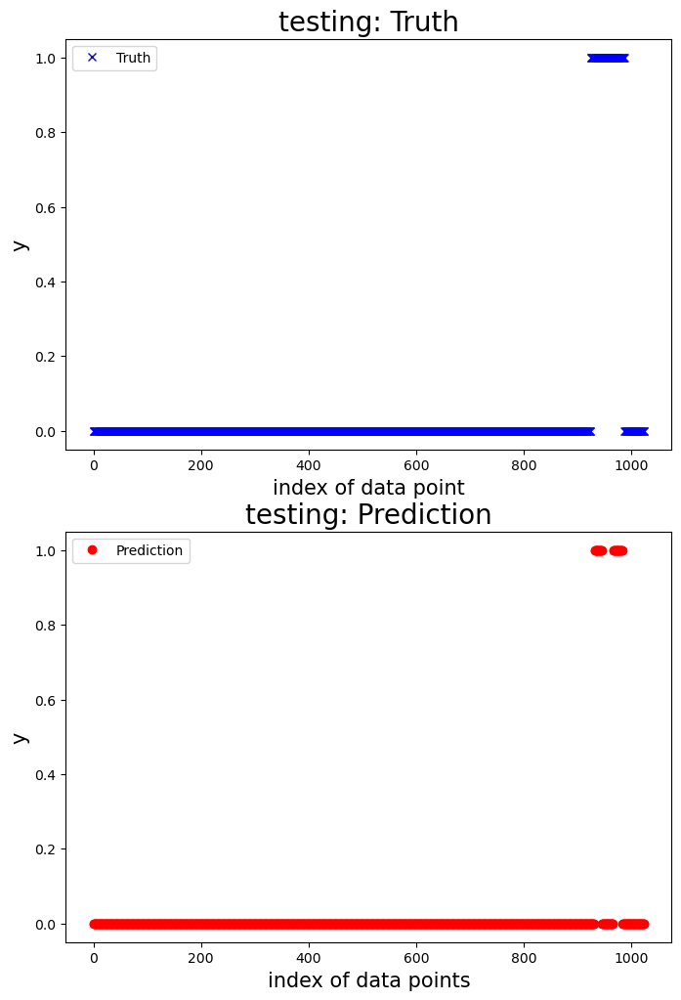

100%|██████████| 1/1 [00:00<00:00,  2.88it/s]



 New run:

testing performance, max error is: 5.8180398853452955
testing performance, mean root square error is: 2.2816132992765623
testing performance, residual error > 0.9: 48.93805309734513%

 New run:

testing performance, accuracy is: 0.7982300884955752
testing performance, precision is: 0.6075949367088608
testing performance, recall: 0.968299711815562
testing performance, F1: 0.7466666666666666




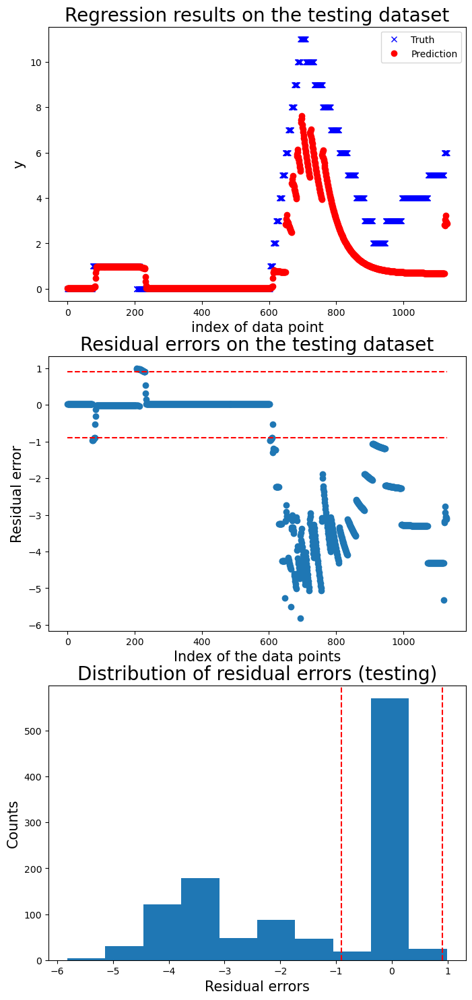

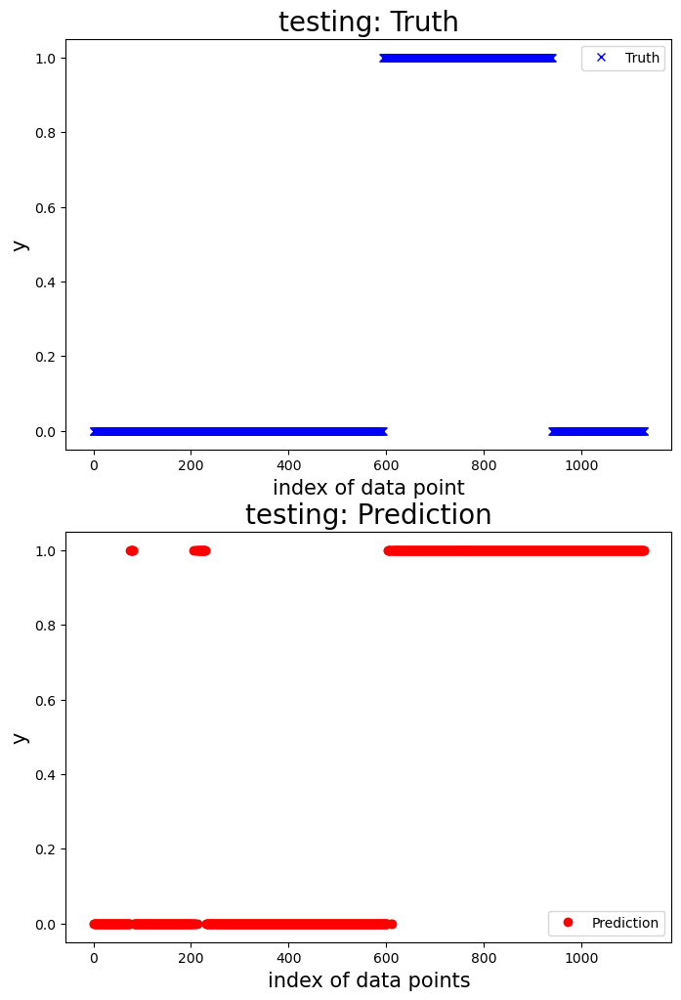

100%|██████████| 1/1 [00:00<00:00,  5.74it/s]



 New run:

testing performance, max error is: 5.919528668559457
testing performance, mean root square error is: 3.4814421015596704
testing performance, residual error > 0.9: 83.79310344827586%

 New run:

testing performance, accuracy is: 0.9448275862068966
testing performance, precision is: 0.9609053497942387
testing performance, recall: 0.9729166666666667
testing performance, F1: 0.9668737060041408




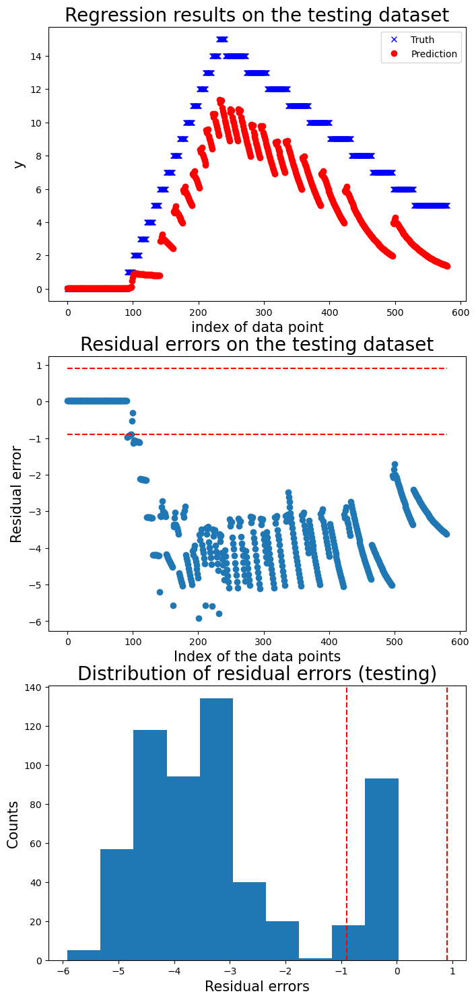

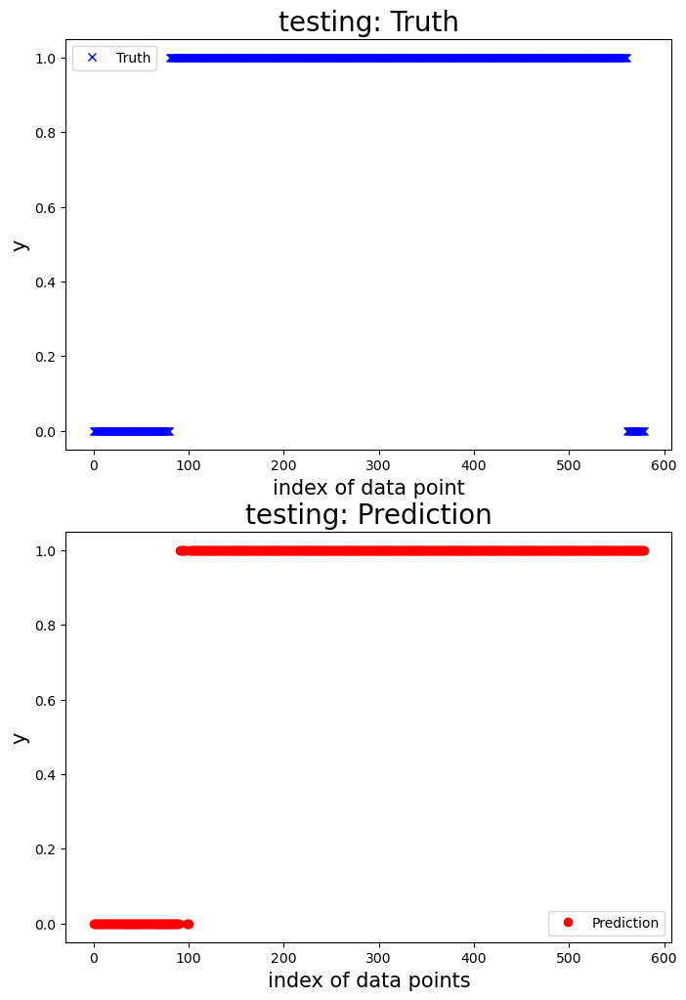

100%|██████████| 1/1 [00:00<00:00,  4.22it/s]



 New run:

testing performance, max error is: 3.5552242037702873
testing performance, mean root square error is: 1.4219843394330978
testing performance, residual error > 1.4454677245993615: 22.295514511873353%

 New run:

testing performance, accuracy is: 0.5184696569920845
testing performance, precision is: 0.15384615384615385
testing performance, recall: 0.16037735849056603
testing performance, F1: 0.15704387990762125




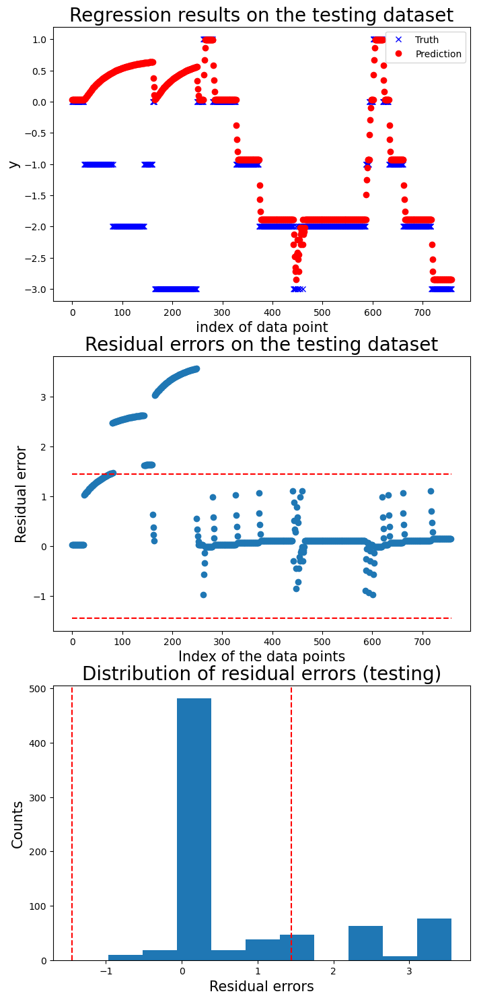

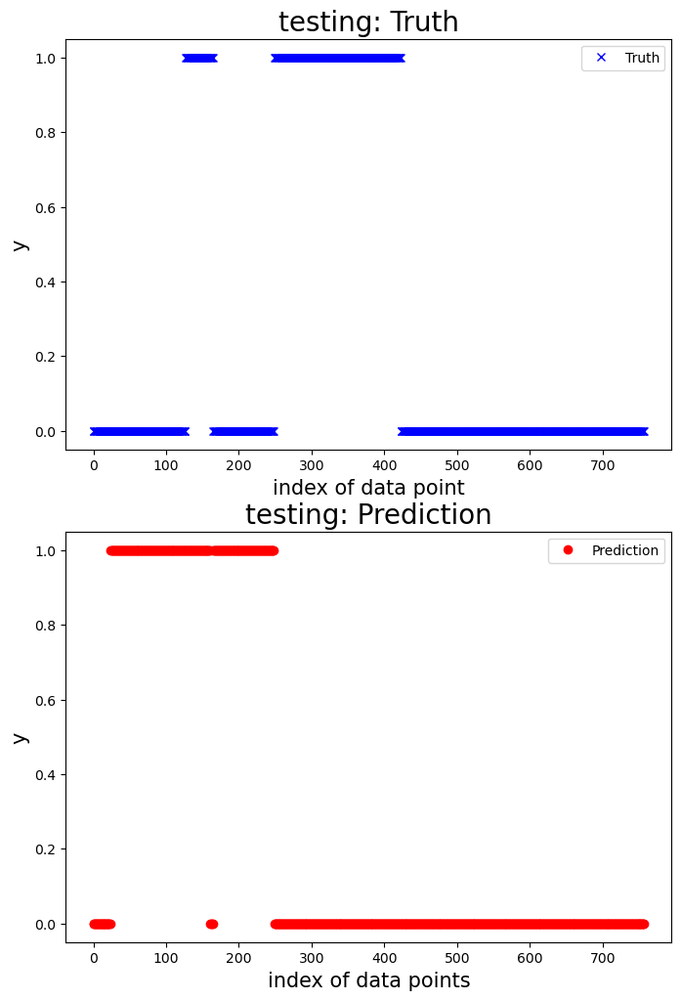

   Accuracy  Precision    Recall  F1 score
0  0.919343   0.536395  1.000000  0.698252
1  0.834906   0.776471  0.804878  0.790419
2  0.900185   1.000000  0.581395  0.735294
3  0.968780   1.000000  0.492063  0.659574
4  0.798230   0.607595  0.968300  0.746667
5  0.944828   0.960905  0.972917  0.966874
6  0.518470   0.153846  0.160377  0.157044


Mean performance metric and standard error:
Accuracy: 0.8407 +- 0.1542
Precision: 0.7193 +- 0.3122
Recall: 0.7114 +- 0.3149
F1 score: 0.6792 +- 0.2504




In [29]:
# Enrich the features based on the sliding window.
window_size = 20
sample_step = 1
prediction_lead_time = 1 
threshold = .9
abnormal_limit = 5

x_tr, y_temp_tr = prepare_sliding_window(df_x=x_tr_org, y=y_temp_tr_org, window_size=window_size, sample_step=sample_step, prediction_lead_time=prediction_lead_time, mdl_type='reg')

# Define the steps of the pipeline
steps = [
    ('standardizer', StandardScaler()),  # Step 1: StandardScaler
    ('regressor', Lasso(alpha=0.1))    # Step 2: Linear Regression
]

# Create the pipeline
mdl_linear_regreession = Pipeline(steps)
# Fit the model
mdl = mdl_linear_regreession.fit(x_tr, y_temp_tr)

# Test data.
test_id = [
    '20240325_155003',
    '20240425_093699',
    '20240425_094425',
    '20240426_140055',
    '20240503_163963',
    '20240503_164675',
    '20240503_165189'
]
df_test = df_data[df_data['test_condition'].isin(test_id)]

# Define the fault detector.
detector_reg = FaultDetectReg(reg_mdl=mdl, threshold=threshold, abnormal_limit=abnormal_limit, window_size=window_size, sample_step=sample_step, pred_lead_time=prediction_lead_time)

# # Run cross validation
n_fold = 7
_, y_label_test_org = extract_selected_feature(df_data=df_test, feature_list=feature_list_all, motor_idx=6, mdl_type='clf')
x_test_org, y_temp_test_org = extract_selected_feature(df_data=df_test, feature_list=feature_list_all, motor_idx=6, mdl_type='reg')

motor_idx = 6
print(f'Model for motor {motor_idx}:')
# Run cross validation.
df_perf = detector_reg.run_cross_val(df_x=x_test_org, y_label=y_label_test_org, y_response=y_temp_test_org, 
                                        n_fold=n_fold)
print(df_perf)
print('\n')
# Print the mean performance and standard error.
print('Mean performance metric and standard error:')
for name, metric, error in zip(df_perf.columns, df_perf.mean(), df_perf.std()):
    print(f'{name}: {metric:.4f} +- {error:.4f}') 
print('\n')


## Summary of the results

Please add a table in the end, summarying the results from all the models (including the unsupervised learning models). Please write a few texts to explain what is the best model you got (including key parameters like threshold, window_size, sample_step, prediction_lead_time, etc), its performance, and how could you further improve it.

| Model   | Accuracy | Precision | Recall | F1   |
|---------|----------|-----------|--------|------|
| Linear regression, window = 10, abnormal limit = 3 |   0.8309 +- 0.1519  |   0.7510 +- 0.2946   |  0.6600 +- 0.2581 | 0.6862 +- 0.2417 |
| Linear regression, window = 10, abnormal limit = 5 |   0.8320 +- 0.1571  |   0.7742 +- 0.3124   |  0.6464 +- 0.2436 | 0.6896 +- 0.2460 |
| Linear regression, window = 10, abnormal limit = 10 |   0.8629 +- 0.1615  |   0.8103 +- 0.3218   |  0.6746 +- 0.2664 | 0.7217 +- 0.2674 |
| Lasso, window = 20, abnormal limit = 5 |   0.8407 +- 0.1542  |   0.7193 +- 0.3122   |  0.7114 +- 0.3149 | 0.6792 +- 0.2504 |

Increasing the abnormal limit which decreases the number of sample classified as failure increases the performance of the model.

The best model we got is Linear regression with window size = 10 and abnormal limit = 10